In [1]:
from dataloader import DAVIS_Seq2, normalize_image, BallDataset, Balltest
from model import IterWholeFirst_Con
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
import matplotlib.pyplot as plt
from tqdm import tqdm
import PIL.Image as Image
import numpy as np
from preprocess_utensils import get_gray_image, get_boundary_iou
import json
from loss import order_loss, chamer_distance_loss
import random

In [6]:
!nvidia-smi

Thu Mar 28 10:08:44 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.14              Driver Version: 550.54.14      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla V100-SXM2-32GB           On  |   00000000:15:00.0 Off |                    0 |
| N/A   32C    P0             56W /  300W |    1189MiB /  32768MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!export CUDA_VISIBLE_DEVICES=1

In [7]:
# data_set = BallDataset()
# data_set = BallDataset(output_first=True)
# data_set = BallDataset(is_previous=False)
# data_set = BallDataset("ellipse/uniform_samples_80.json")
data_set = BallDataset("ellipse/uniform_samples_80.json", output_first=True)
# data_set = DAVIS_Seq2(is_one_video=True)
test_set = Balltest("ellipse/uniform_samples_80.json")
# test_set = Balltest()

batch_size = 1
data_loader = DataLoader(data_set, batch_size=batch_size, shuffle=True, num_workers=4)

In [8]:
first_frame, first_boundary, pre_frame, curr_frame, pre_boundary, curr_boundary, pre_idx, curr_idx = next(iter(data_loader))
pre_idx, curr_idx

(tensor([8]), tensor([9]))

Text(0.5, 1.0, 'First Frame in test set')

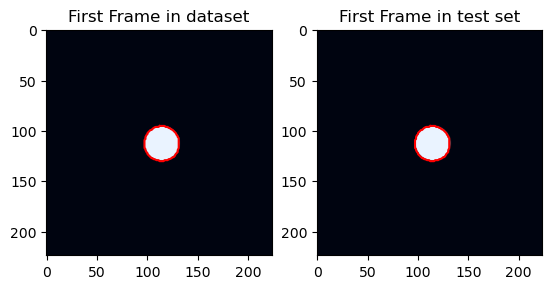

In [9]:
index = 0
plt.subplot(1, 2, 1)
plt.imshow(normalize_image(first_frame[index].permute(1, 2, 0)))
plt.plot(first_boundary[index][:, 0], first_boundary[index][:, 1], 'r')
plt.title("First Frame in dataset")
plt.subplot(1, 2, 2)
plt.imshow(normalize_image(test_set[0][0].permute(1, 2, 0)))
plt.plot(first_boundary[index][:, 0], first_boundary[index][:, 1], 'r')
plt.title("First Frame in test set")

Text(0.5, 1.0, 'Curr Frame')

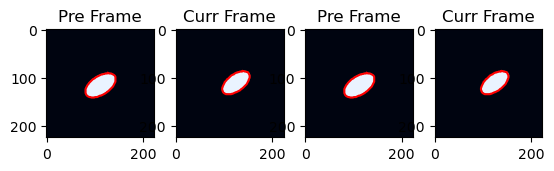

In [10]:
index = 0
plt.subplot(1, 4, 1)
plt.imshow(normalize_image(pre_frame[index].permute(1, 2, 0)))
plt.plot(pre_boundary[index][:, 0], pre_boundary[index][:, 1], 'r')
plt.title('Pre Frame')
plt.subplot(1, 4, 2)
plt.imshow(normalize_image(curr_frame[index].permute(1, 2, 0)))
plt.plot(curr_boundary[index][:, 0], curr_boundary[index][:, 1], 'r')
plt.title('Curr Frame')
plt.subplot(1, 4, 3)
plt.imshow(normalize_image(test_set[pre_idx][0].permute(1, 2, 0)))
plt.plot(pre_boundary[index][:, 0], pre_boundary[index][:, 1], 'r')
plt.title('Pre Frame')
plt.subplot(1, 4, 4)
plt.imshow(normalize_image(test_set[curr_idx][0].permute(1, 2, 0)))
plt.plot(curr_boundary[index][:, 0], curr_boundary[index][:, 1], 'r')
plt.title('Curr Frame')

In [11]:
# model = IterativeModelWithFirst()
# model = IterativeModelWithFirst_Con()
# model = IterativeModelWithFirst_Nei()
# model = IterWholeFirst(add_xy_in_token=True)
model = IterWholeFirst_Con()

In [12]:
model = model.cuda()

results = model(
    first_frame.cuda(), 
    first_boundary.cuda(), 
    pre_frame.cuda(), 
    curr_frame.cuda(), 
    pre_boundary.cuda(), 
)

In [13]:
order_loss(results[0], curr_boundary.cuda())


tensor(18.2823, device='cuda:0', grad_fn=<DivBackward0>)

In [14]:
torch.cuda.memory_allocated() / 1024 / 1024 / 1024

1.1024980545043945

In [15]:
test_set = Balltest("ellipse/uniform_samples_80.json")

In [16]:
class ModelInfer:
    def __init__(
        self,
        test_set: torch.utils.data.Dataset,
        device="cuda",
    ) -> None:
        self.test_set = test_set
        self.device = device
        self.infer_results = {}
    
    def infer_model(self, model: torch.nn.Module):
        model = model.to(self.device)
        def inference_model_at_index(
            model: torch.nn.Module,
            test_dataset: torch.utils.data.Dataset,
            first_index: int,
            end_index: int,
            device="cuda",
        ):
            inference_results = {}
            model = model.to(device)
            model.eval()
            if end_index < first_index:
                step = -1
            else:
                step = 1
            first_img, first_sgm, first_boundary = test_dataset[first_index]
            inference_results[first_index] = first_boundary
            # plt.subplot(10, 4, first_index + 1)
            # plt.imshow(normalize_image(first_img.permute(1, 2, 0)))
            # plt.plot(first_boundary[:, 0], first_boundary[:, 1], "r")
            # plt.axis("off")
            # plt.title(f"Frame {first_index}")
            first_index += step
            pre_boundary = first_boundary
            pre_img = first_img
            # for i in tqdm(range(first_index, end_index + step, step)):
            for i in range(first_index, end_index + step, step):
                curr_img, curr_sgm, curr_boundary = test_dataset[i]
                results = model(
                    first_img.unsqueeze(0).to(device),
                    first_boundary.unsqueeze(0).to(device),
                    pre_img.unsqueeze(0).to(device),
                    curr_img.unsqueeze(0).to(device),
                    pre_boundary.unsqueeze(0).to(device),
                )
                pre_boundary = results[-1].int().squeeze(0).clamp(0, 223)
                inference_results[i] = pre_boundary
                pre_img = curr_img
                # plt.subplot(10, 4, i + 1)
                # plt.imshow(normalize_image(curr_img.squeeze(0).permute(1, 2, 0)))
                # plt.plot(
                #     pre_boundary.cpu().numpy()[:, 0],
                #     pre_boundary.cpu().numpy()[:, 1],
                #     "r",
                # )
                # plt.axis("off")
                # plt.title(f"Frame {i}")
            return inference_results


        def inference_model(
            model: torch.nn.Module,
            test_dataset: torch.utils.data.Dataset,
            device="cuda",
        ):
            inference_results = {}
            for i in range(len(test_dataset)):
                tmp_result1 = inference_model_at_index(model, test_dataset, i, 0, device)
                tmp_result2 = inference_model_at_index(
                    model, test_dataset, i, len(test_dataset) - 1, device
                )
                inference_results[i] = {**tmp_result1, **tmp_result2}
            return inference_results        
        
        self.infer_results = inference_model(model, self.test_set, self.device)

    def show_infer_result(self, index: int):
        total_iou = 0
        plt.figure(figsize=(10, 20))
        for i in range(len(self.test_set)):
            plt.subplot(10, 4, i + 1)
            img, sgm, boundary = self.test_set[i]
            plt.imshow(normalize_image(img.permute(1, 2, 0)))
            plt.plot(
                self.infer_results[index][i].cpu()[:, 0],
                self.infer_results[index][i].cpu()[:, 1],
                "r",
            )
            plt.axis("off")
            plt.title(f"Frame {i}")
            total_iou += get_boundary_iou(
                sgm, self.infer_results[index][i].cpu().numpy()
            )
        plt.show()
        return total_iou / len(self.test_set)
    
    def get_boundary(self, index: int):
        if len(self.infer_results) == 0:
            return self.test_set[index][2]
        else:
            random_index = random.randint(0, len(self.infer_results) - 1)
            return self.infer_results[random_index][index]

In [17]:
model_infer = ModelInfer(test_set)

In [18]:
model_infer.infer_model(model)

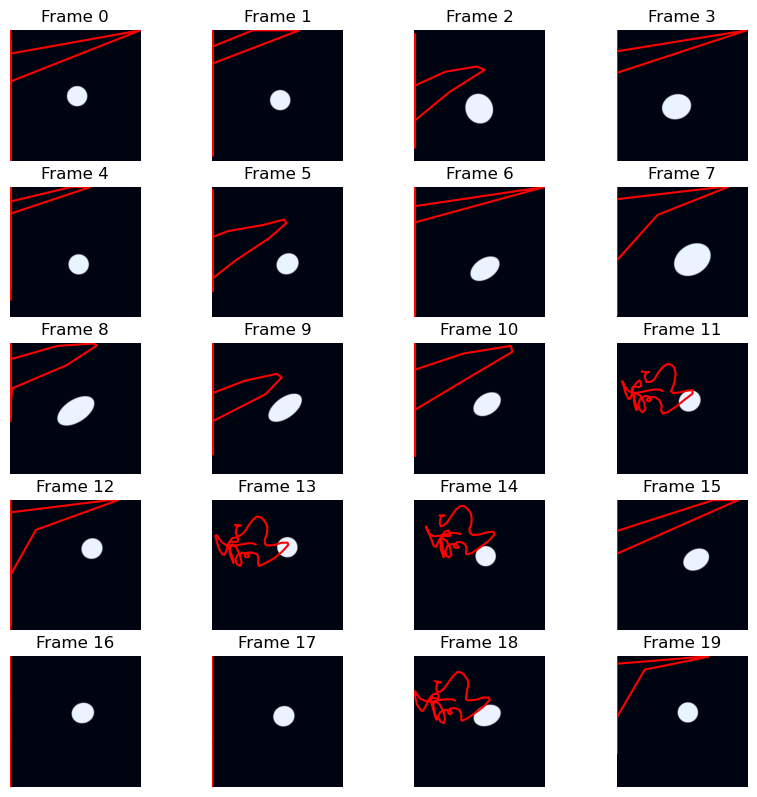

In [19]:
plt.figure(figsize=(10, 20))
for i in range(len(test_set)):
    plt.subplot(10, 4, i + 1)
    img, sgm, boundary = test_set[i]
    plt.imshow(normalize_image(img.permute(1, 2, 0)))
    boundary = model_infer.get_boundary(i)
    plt.plot(boundary.cpu()[:, 0], boundary.cpu()[:, 1], "r")
    plt.axis("off")
    plt.title(f"Frame {i}")

In [20]:
# model = IterativeModelWithFirst().to('cuda')
# model = IterativeModelWithFirst_Con().to('cuda')
# model = IterativeModelWithFirst_Nei().to('cuda')
# model = IterWholeFirst(add_xy_in_token=True).to('cuda')
model = IterWholeFirst_Con().to('cuda')
model_name = "uniform_model"
model_infer = ModelInfer(test_set)
# data_set = BallDataset(output_first=True)
# data_set = BallDataset("ellipse/uniform_samples_80.json")
data_set = BallDataset("ellipse/uniform_samples_80.json", output_first=True)
# data_set = BallDataset("ellipse/uniform_samples_80.json", is_previous=False)
# data_set = DAVIS_Seq2(is_uniform=True, is_one_video=True)
# loss_name = "chamer_distance_loss"
loss_name = "order_loss"
if loss_name == "chamer_distance_loss":
    loss_func = chamer_distance_loss
else:
    loss_func = order_loss
batch_size = 1
data_loader = DataLoader(data_set, batch_size=batch_size, shuffle=True, num_workers=4)

Epoch 1, Loss: 1105.97
Epoch 2, Loss: 1131.10
Epoch 3, Loss: 905.22
Epoch 4, Loss: 346.53
Epoch 5, Loss: 223.50
Epoch 6, Loss: 172.64
Epoch 7, Loss: 209.93
Epoch 8, Loss: 104.25
Epoch 9, Loss: 105.24
Epoch 10, Loss: 131.07
Epoch 11, Loss: 77.56
Epoch 12, Loss: 99.88
Epoch 13, Loss: 83.07
Epoch 14, Loss: 67.91
Epoch 15, Loss: 104.58
Epoch 16, Loss: 58.15
Epoch 17, Loss: 76.55
Epoch 18, Loss: 89.62
Epoch 19, Loss: 59.37
Epoch 20, Loss: 50.29
Epoch 21, Loss: 72.80
Epoch 22, Loss: 64.57
Epoch 23, Loss: 39.34
Epoch 24, Loss: 45.05
Epoch 25, Loss: 37.95
Epoch 26, Loss: 45.06
Epoch 27, Loss: 32.43
Epoch 28, Loss: 27.51
Epoch 29, Loss: 35.63
Epoch 30, Loss: 30.77
Epoch 31, Loss: 43.14
Epoch 32, Loss: 38.12
Epoch 33, Loss: 55.07
Epoch 34, Loss: 38.52
Epoch 35, Loss: 50.41
Epoch 36, Loss: 28.78
Epoch 37, Loss: 32.09
Epoch 38, Loss: 28.78
Epoch 39, Loss: 27.14
Epoch 40, Loss: 26.12
Epoch 41, Loss: 31.28
Epoch 42, Loss: 27.80
Epoch 43, Loss: 32.45
Epoch 44, Loss: 30.04
Epoch 45, Loss: 24.97
Epoch 

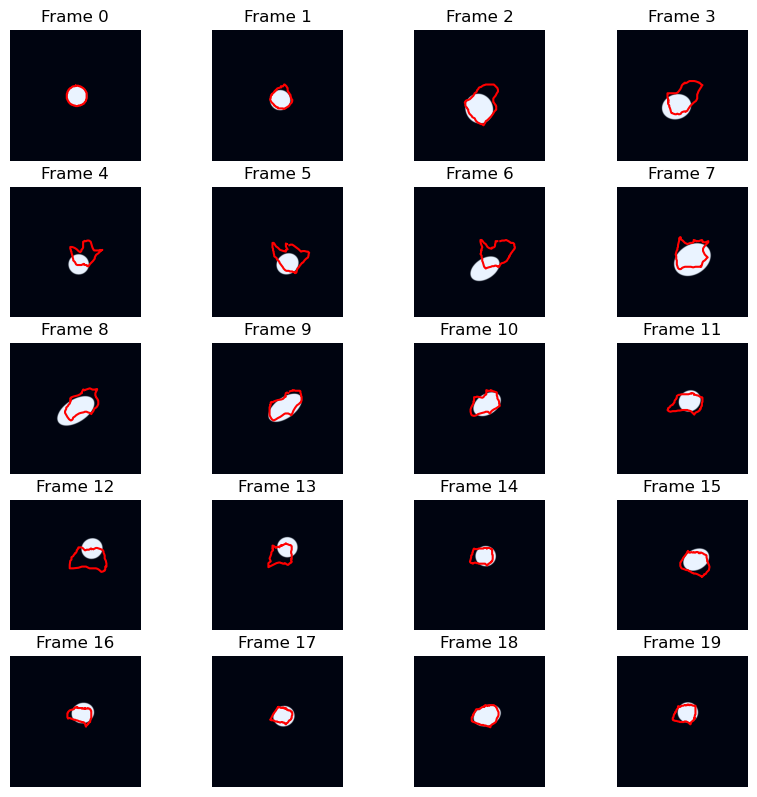

Epoch 50, IOU: 0.564254
Epoch 51, Loss: 61.56
Epoch 52, Loss: 57.10
Epoch 53, Loss: 51.13
Epoch 54, Loss: 56.82
Epoch 55, Loss: 63.72
Epoch 56, Loss: 45.81
Epoch 57, Loss: 48.07
Epoch 58, Loss: 40.27
Epoch 59, Loss: 39.52
Epoch 60, Loss: 41.38
Epoch 61, Loss: 39.49
Epoch 62, Loss: 33.67
Epoch 63, Loss: 44.91
Epoch 64, Loss: 33.74
Epoch 65, Loss: 30.42
Epoch 66, Loss: 39.03
Epoch 67, Loss: 42.95
Epoch 68, Loss: 32.88
Epoch 69, Loss: 39.43
Epoch 70, Loss: 42.71
Epoch 71, Loss: 34.13
Epoch 72, Loss: 36.77
Epoch 73, Loss: 34.54
Epoch 74, Loss: 33.41
Epoch 75, Loss: 28.84
Epoch 76, Loss: 28.20
Epoch 77, Loss: 31.45
Epoch 78, Loss: 37.63
Epoch 79, Loss: 30.83
Epoch 80, Loss: 25.45
Epoch 81, Loss: 29.50
Epoch 82, Loss: 24.07
Epoch 83, Loss: 30.51
Epoch 84, Loss: 29.79
Epoch 85, Loss: 35.37
Epoch 86, Loss: 43.04
Epoch 87, Loss: 38.17
Epoch 88, Loss: 30.91
Epoch 89, Loss: 28.22
Epoch 90, Loss: 25.36
Epoch 91, Loss: 22.91
Epoch 92, Loss: 29.99
Epoch 93, Loss: 24.95
Epoch 94, Loss: 24.67
Epoch 95

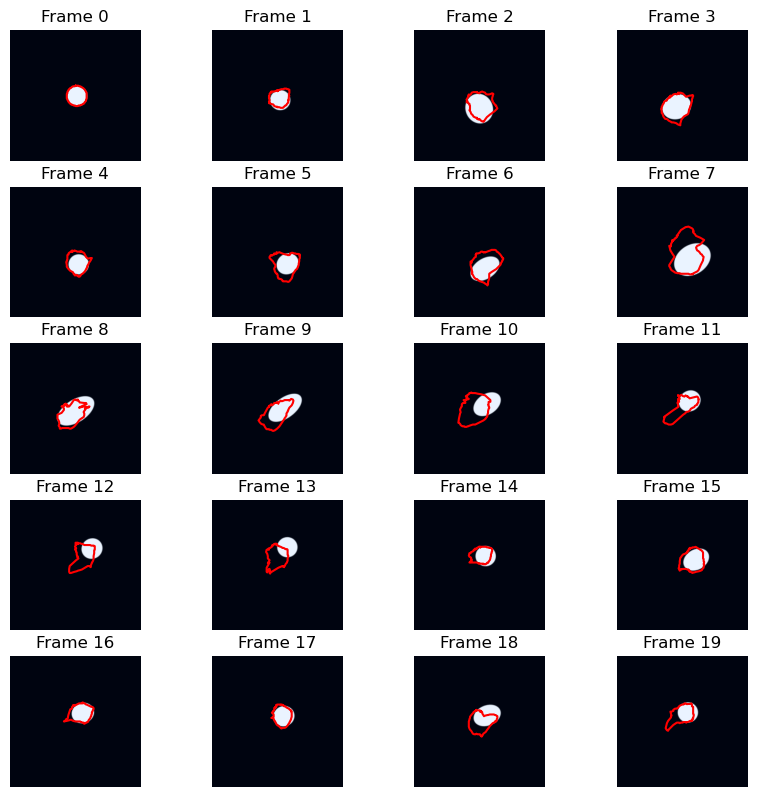

Epoch 95, IOU: 0.574003
Epoch 96, Loss: 27.65
Epoch 97, Loss: 23.77
Epoch 98, Loss: 28.05
Epoch 99, Loss: 23.53
Epoch 100, Loss: 24.16
Epoch 101, Loss: 31.91
Epoch 102, Loss: 26.67
Epoch 103, Loss: 27.18
Epoch 104, Loss: 28.18
Epoch 105, Loss: 29.17
Epoch 106, Loss: 26.15
Epoch 107, Loss: 29.39
Epoch 108, Loss: 31.85
Epoch 109, Loss: 32.57
Epoch 110, Loss: 22.60
Epoch 111, Loss: 24.22
Epoch 112, Loss: 32.22
Epoch 113, Loss: 26.22
Epoch 114, Loss: 22.64
Epoch 115, Loss: 21.39
Epoch 116, Loss: 25.72
Epoch 117, Loss: 29.02
Epoch 118, Loss: 28.39
Epoch 119, Loss: 27.91
Epoch 120, Loss: 28.99
Epoch 121, Loss: 26.24
Epoch 122, Loss: 24.28
Epoch 123, Loss: 26.27
Epoch 124, Loss: 22.49
Epoch 125, Loss: 28.66
Epoch 126, Loss: 28.43
Epoch 127, Loss: 31.27
Epoch 128, Loss: 28.09
Epoch 129, Loss: 28.48
Epoch 130, Loss: 35.81
Epoch 131, Loss: 31.19
Epoch 132, Loss: 35.33
Epoch 133, Loss: 28.21
Epoch 134, Loss: 25.08
Epoch 135, Loss: 23.42


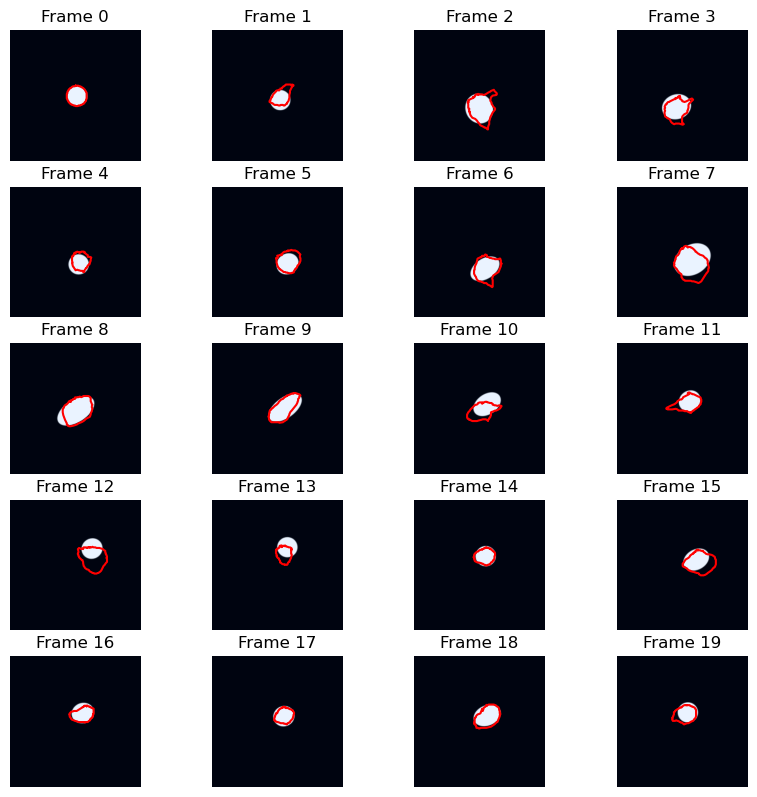

Epoch 135, IOU: 0.656934
Epoch 136, Loss: 26.12
Epoch 137, Loss: 31.41
Epoch 138, Loss: 25.38
Epoch 139, Loss: 24.97
Epoch 140, Loss: 19.54
Epoch 141, Loss: 29.66
Epoch 142, Loss: 27.78
Epoch 143, Loss: 22.64
Epoch 144, Loss: 21.32
Epoch 145, Loss: 20.86
Epoch 146, Loss: 20.85
Epoch 147, Loss: 16.49
Epoch 148, Loss: 19.82
Epoch 149, Loss: 20.71
Epoch 150, Loss: 20.54
Epoch 151, Loss: 19.39
Epoch 152, Loss: 21.45
Epoch 153, Loss: 18.30
Epoch 154, Loss: 18.26
Epoch 155, Loss: 22.05
Epoch 156, Loss: 25.05
Epoch 157, Loss: 22.31
Epoch 158, Loss: 20.00
Epoch 159, Loss: 20.09
Epoch 160, Loss: 16.49
Epoch 161, Loss: 18.12
Epoch 162, Loss: 21.88
Epoch 163, Loss: 17.24
Epoch 164, Loss: 17.26
Epoch 165, Loss: 16.43
Epoch 166, Loss: 17.59
Epoch 167, Loss: 16.88
Epoch 168, Loss: 17.34
Epoch 169, Loss: 18.51
Epoch 170, Loss: 15.05


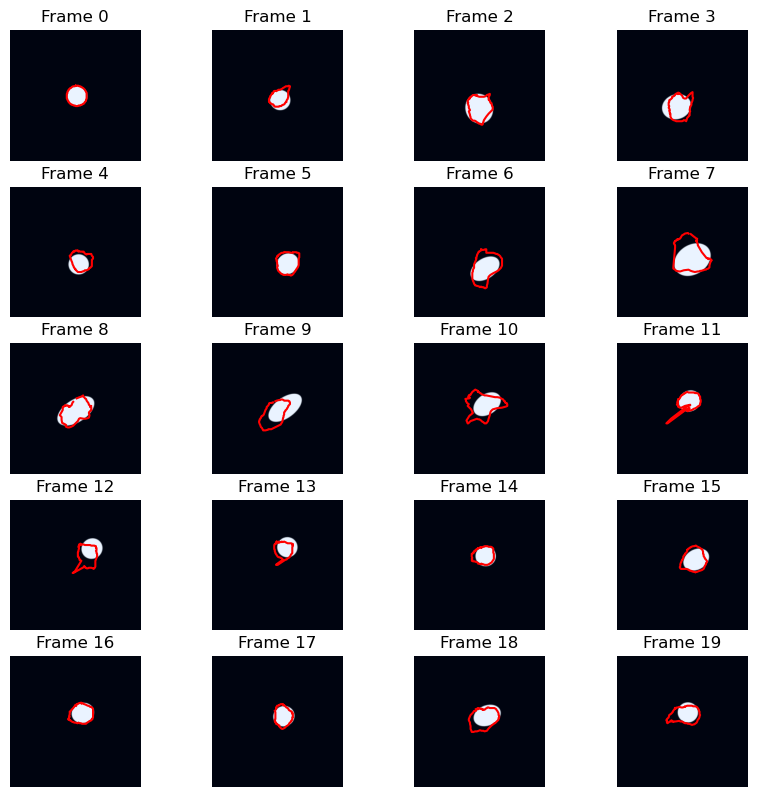

Epoch 170, IOU: 0.656049
Epoch 171, Loss: 18.06
Epoch 172, Loss: 25.69
Epoch 173, Loss: 21.14
Epoch 174, Loss: 23.50
Epoch 175, Loss: 21.03
Epoch 176, Loss: 23.84
Epoch 177, Loss: 23.50
Epoch 178, Loss: 17.98
Epoch 179, Loss: 21.48
Epoch 180, Loss: 20.86
Epoch 181, Loss: 23.88
Epoch 182, Loss: 19.10
Epoch 183, Loss: 21.55
Epoch 184, Loss: 19.68
Epoch 185, Loss: 17.12
Epoch 186, Loss: 17.76
Epoch 187, Loss: 19.41
Epoch 188, Loss: 16.91
Epoch 189, Loss: 24.42
Epoch 190, Loss: 22.54
Epoch 191, Loss: 31.35
Epoch 192, Loss: 19.35
Epoch 193, Loss: 22.01
Epoch 194, Loss: 18.57
Epoch 195, Loss: 22.56
Epoch 196, Loss: 21.68
Epoch 197, Loss: 21.61
Epoch 198, Loss: 18.67
Epoch 199, Loss: 21.92
Epoch 200, Loss: 19.17


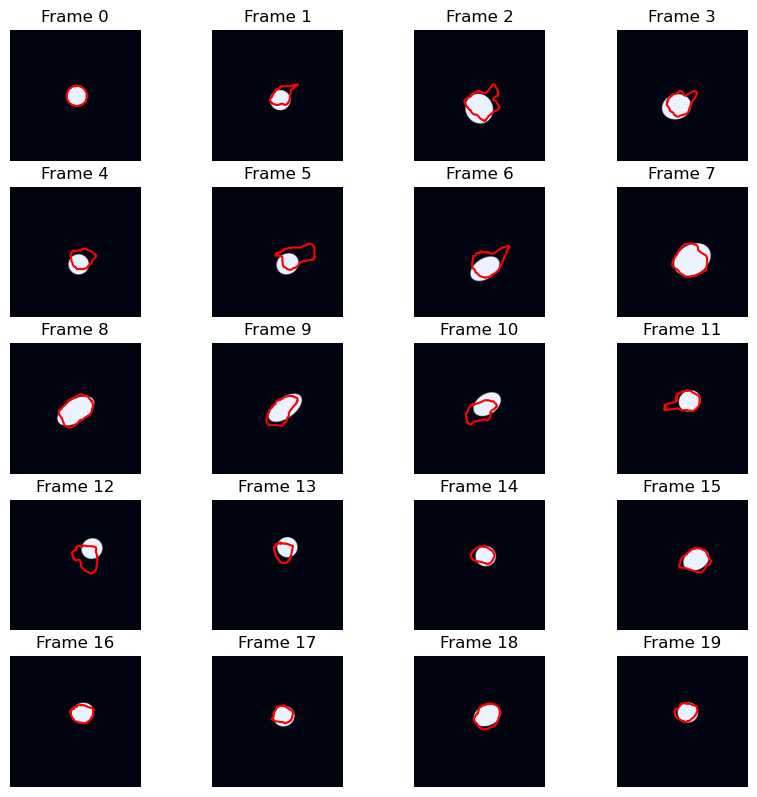

Epoch 200, IOU: 0.636975
Epoch 201, Loss: 21.24
Epoch 202, Loss: 19.18
Epoch 203, Loss: 25.83
Epoch 204, Loss: 21.96
Epoch 205, Loss: 19.97
Epoch 206, Loss: 18.10
Epoch 207, Loss: 21.56
Epoch 208, Loss: 21.73
Epoch 209, Loss: 17.44
Epoch 210, Loss: 16.58
Epoch 211, Loss: 17.22
Epoch 212, Loss: 16.26
Epoch 213, Loss: 18.94
Epoch 214, Loss: 19.33
Epoch 215, Loss: 15.52
Epoch 216, Loss: 20.71
Epoch 217, Loss: 20.24
Epoch 218, Loss: 17.84
Epoch 219, Loss: 16.45
Epoch 220, Loss: 14.39
Epoch 221, Loss: 16.74
Epoch 222, Loss: 18.46
Epoch 223, Loss: 18.11
Epoch 224, Loss: 15.25
Epoch 225, Loss: 15.76


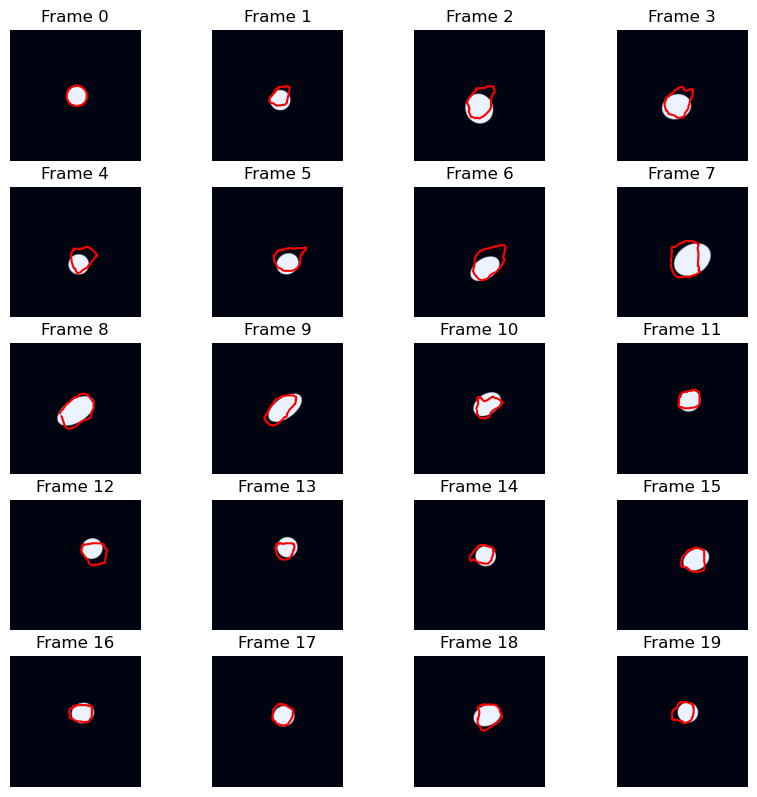

Epoch 225, IOU: 0.662721
Epoch 226, Loss: 20.15
Epoch 227, Loss: 20.07
Epoch 228, Loss: 16.41
Epoch 229, Loss: 13.47
Epoch 230, Loss: 17.26
Epoch 231, Loss: 14.40
Epoch 232, Loss: 16.85
Epoch 233, Loss: 14.91
Epoch 234, Loss: 29.32
Epoch 235, Loss: 27.29
Epoch 236, Loss: 18.31
Epoch 237, Loss: 24.93
Epoch 238, Loss: 21.50
Epoch 239, Loss: 18.29
Epoch 240, Loss: 17.64
Epoch 241, Loss: 15.97
Epoch 242, Loss: 17.86
Epoch 243, Loss: 17.63
Epoch 244, Loss: 15.92
Epoch 245, Loss: 16.64


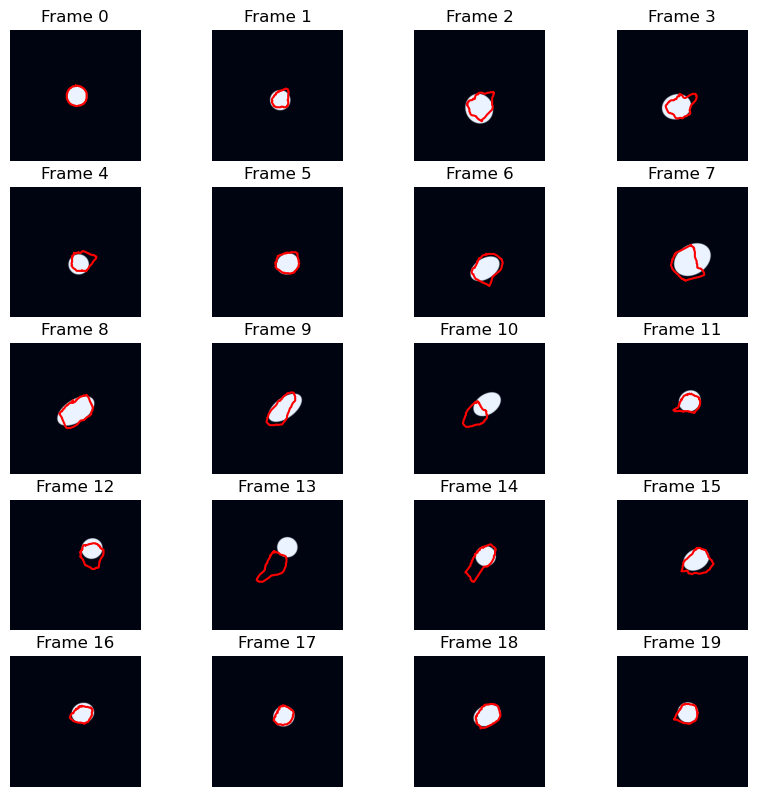

Epoch 245, IOU: 0.634845
Epoch 246, Loss: 17.86
Epoch 247, Loss: 15.35
Epoch 248, Loss: 14.57
Epoch 249, Loss: 15.53
Epoch 250, Loss: 17.34
Epoch 251, Loss: 21.00
Epoch 252, Loss: 18.17
Epoch 253, Loss: 17.76
Epoch 254, Loss: 25.88
Epoch 255, Loss: 19.20
Epoch 256, Loss: 19.18
Epoch 257, Loss: 15.16
Epoch 258, Loss: 13.73
Epoch 259, Loss: 15.85
Epoch 260, Loss: 31.10


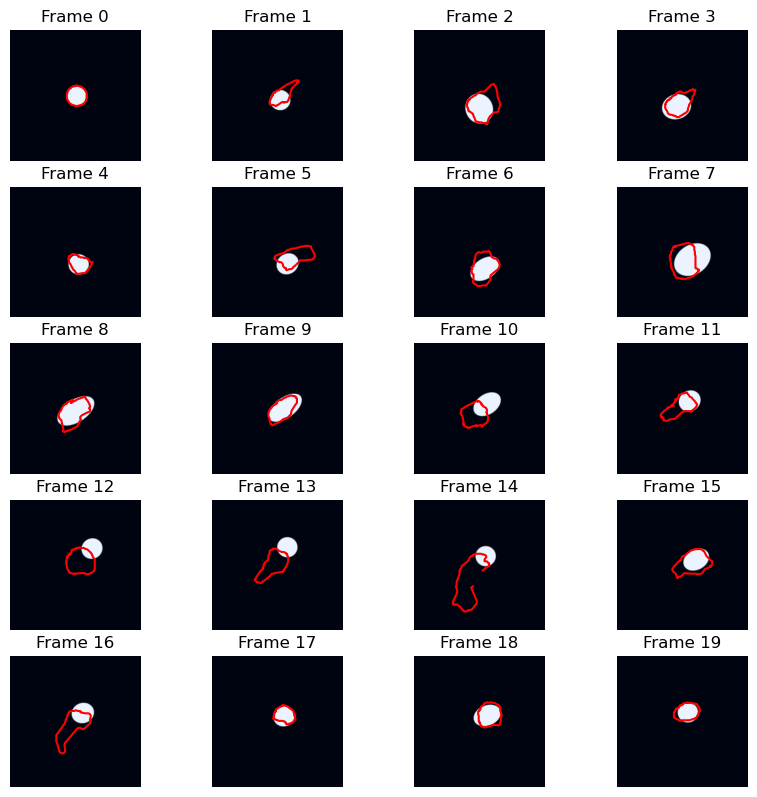

Epoch 260, IOU: 0.521130
Epoch 261, Loss: 21.70
Epoch 262, Loss: 26.26
Epoch 263, Loss: 21.91
Epoch 264, Loss: 24.11
Epoch 265, Loss: 24.09
Epoch 266, Loss: 22.94
Epoch 267, Loss: 31.80
Epoch 268, Loss: 32.65
Epoch 269, Loss: 28.99
Epoch 270, Loss: 23.33


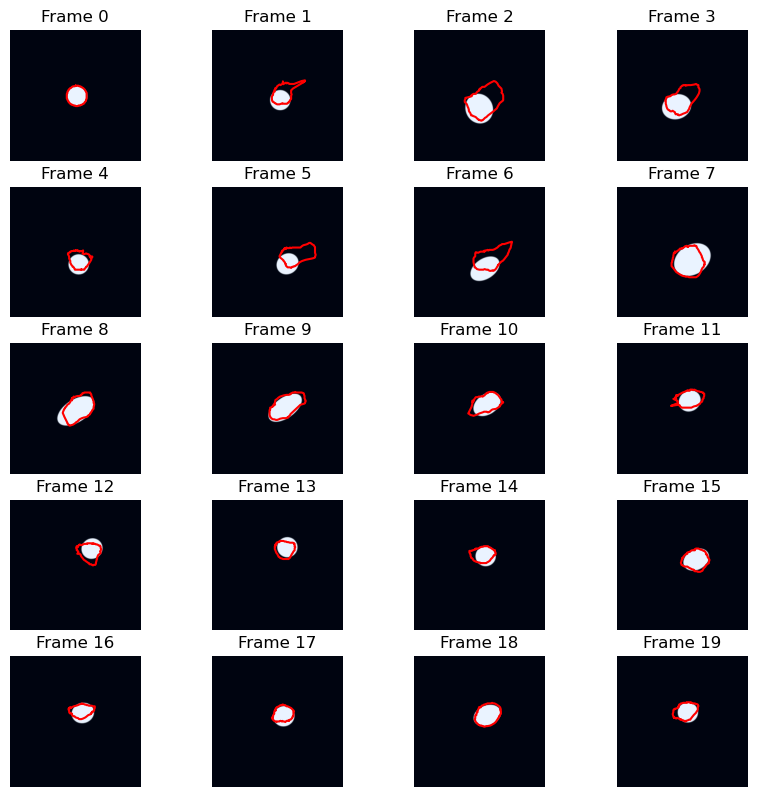

Epoch 270, IOU: 0.635168
Epoch 271, Loss: 18.05
Epoch 272, Loss: 15.96
Epoch 273, Loss: 41.52
Epoch 274, Loss: 37.40
Epoch 275, Loss: 27.70


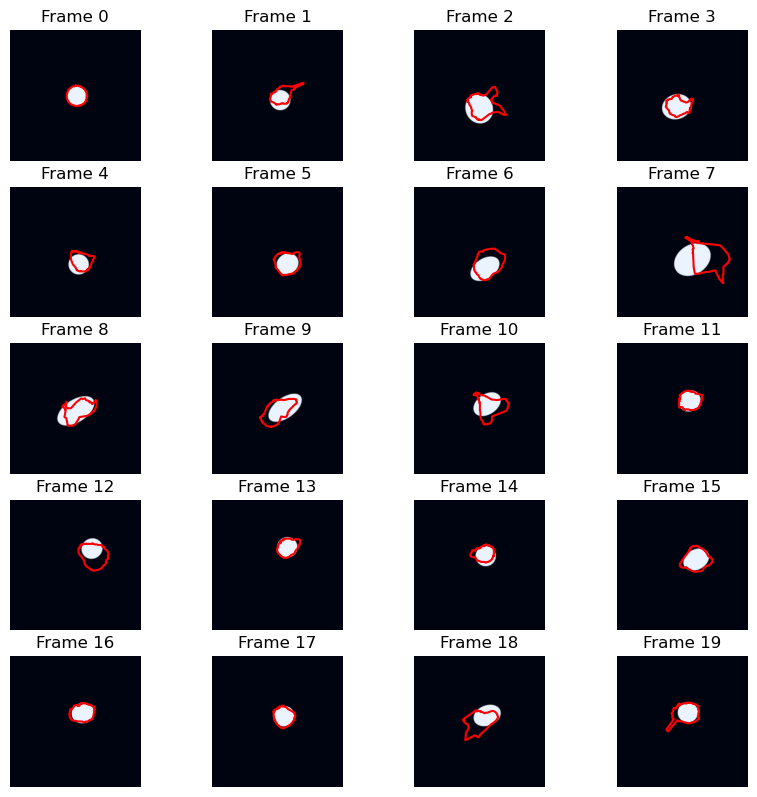

Epoch 275, IOU: 0.625722
Epoch 276, Loss: 17.88
Epoch 277, Loss: 17.39
Epoch 278, Loss: 23.89
Epoch 279, Loss: 15.06
Epoch 280, Loss: 15.04


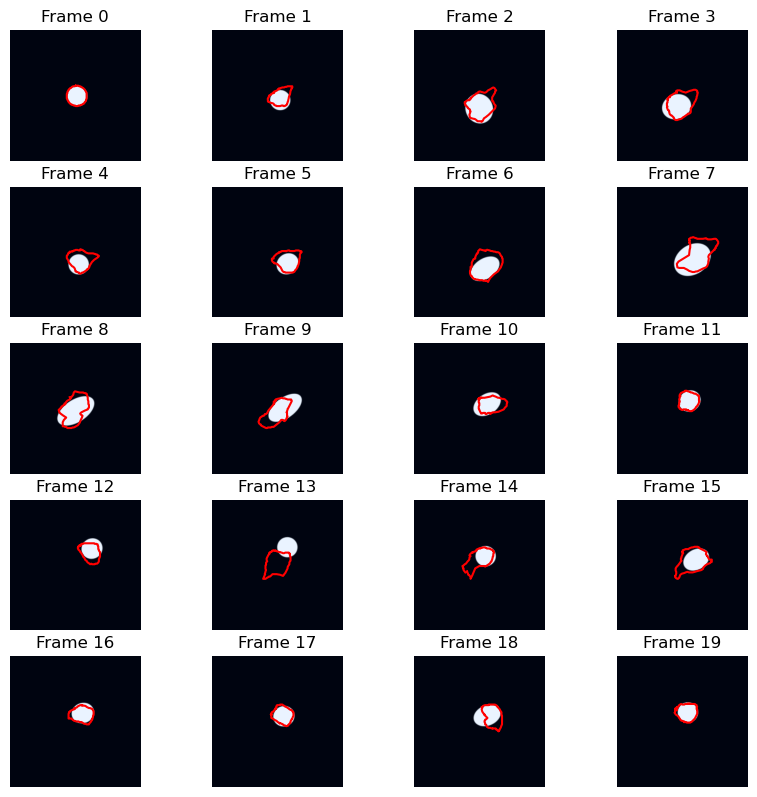

Epoch 280, IOU: 0.624599
Epoch 281, Loss: 17.11
Epoch 282, Loss: 13.46
Epoch 283, Loss: 16.89
Epoch 284, Loss: 15.36
Epoch 285, Loss: 16.43


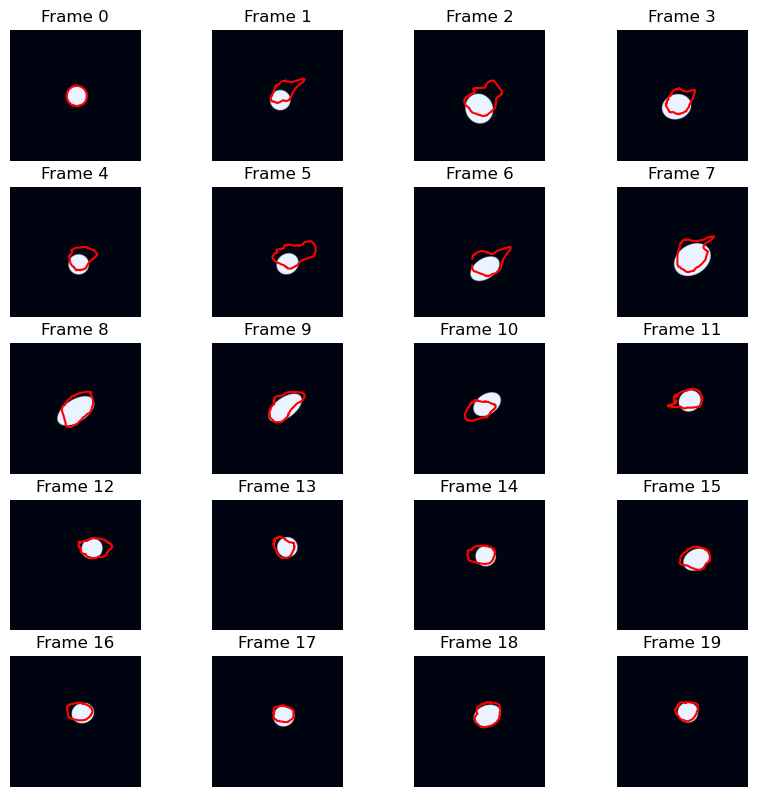

Epoch 285, IOU: 0.596847
Epoch 286, Loss: 16.24
Epoch 287, Loss: 14.27
Epoch 288, Loss: 16.87
Epoch 289, Loss: 16.64
Epoch 290, Loss: 16.25


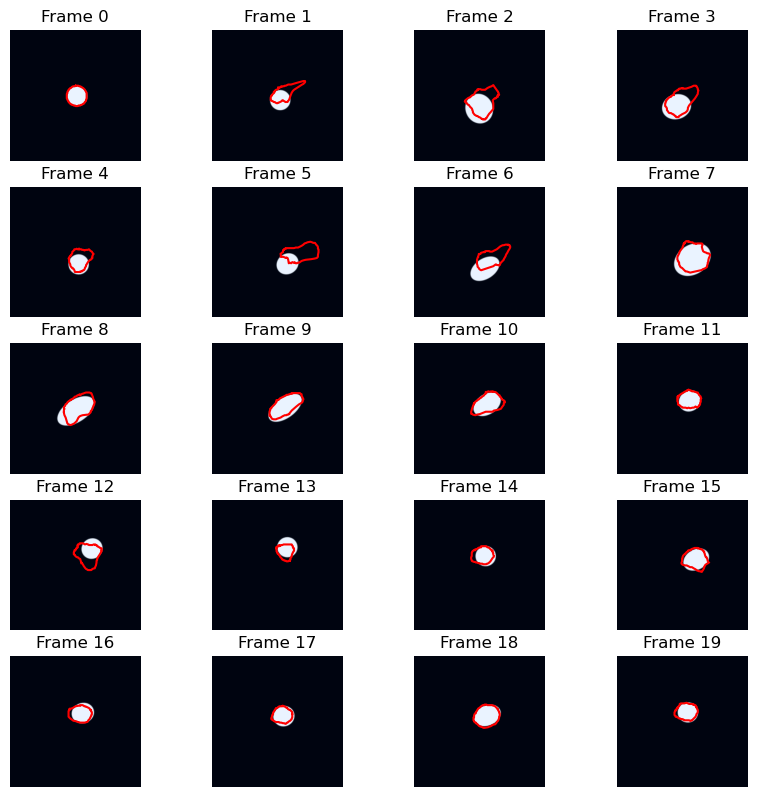

Epoch 290, IOU: 0.632231
Epoch 291, Loss: 17.94
Epoch 292, Loss: 18.68
Epoch 293, Loss: 16.26
Epoch 294, Loss: 16.26
Epoch 295, Loss: 16.29


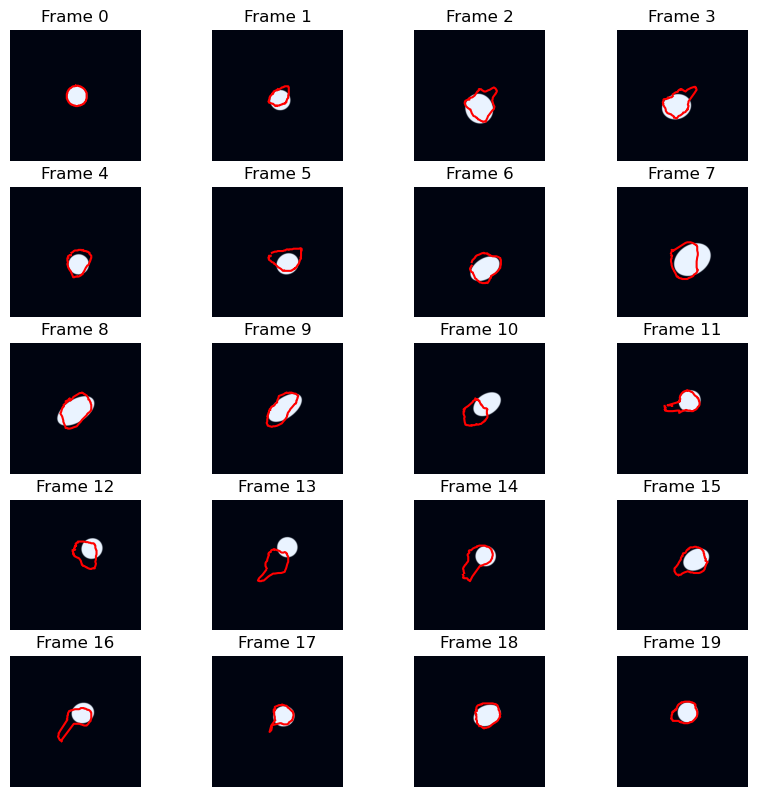

Epoch 295, IOU: 0.588296
Epoch 296, Loss: 13.60
Epoch 297, Loss: 16.50
Epoch 298, Loss: 23.44
Epoch 299, Loss: 26.53
Epoch 300, Loss: 15.21


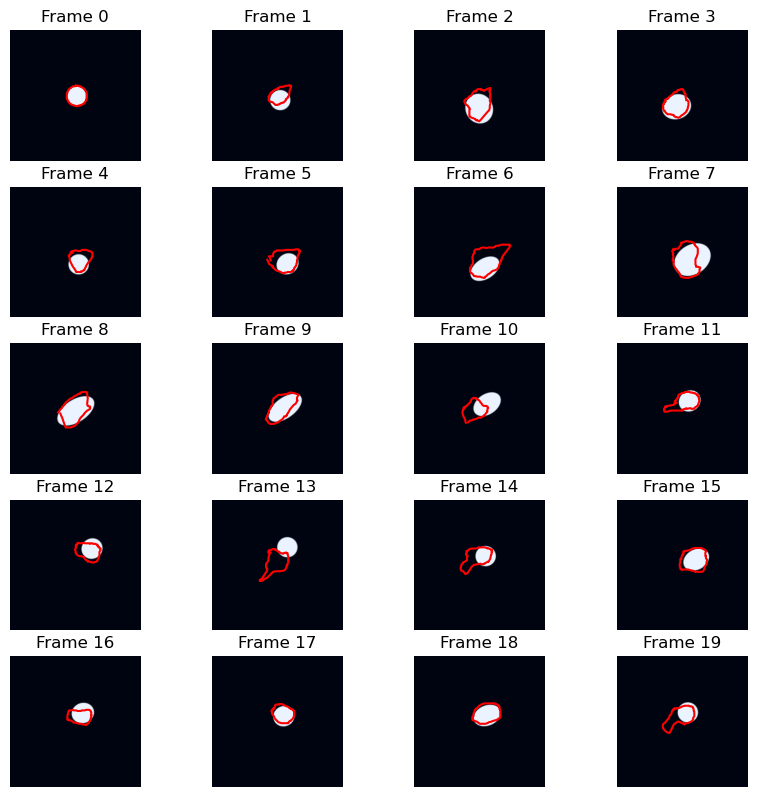

Epoch 300, IOU: 0.567954
Epoch 301, Loss: 15.47
Epoch 302, Loss: 15.96
Epoch 303, Loss: 15.64
Epoch 304, Loss: 23.22
Epoch 305, Loss: 28.31


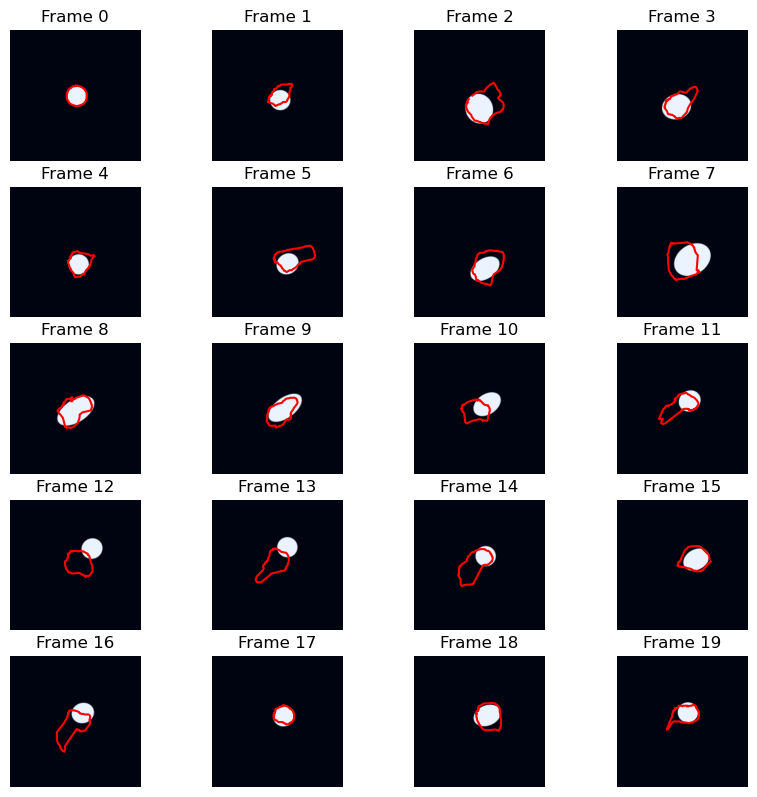

Epoch 305, IOU: 0.517715
Epoch 306, Loss: 16.88
Epoch 307, Loss: 15.14
Epoch 308, Loss: 20.03
Epoch 309, Loss: 20.19
Epoch 310, Loss: 17.91


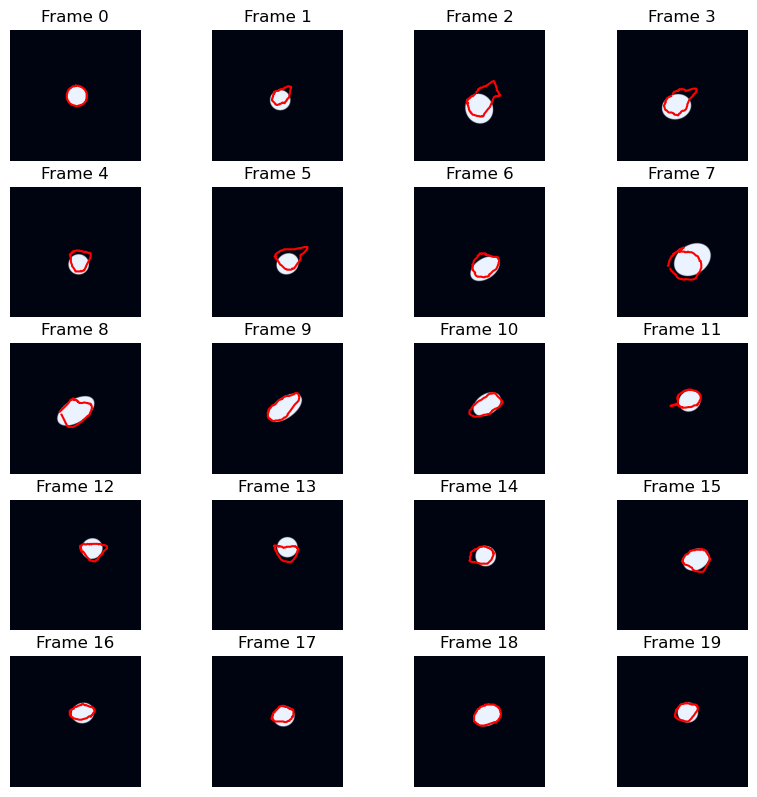

Epoch 310, IOU: 0.661134
Epoch 311, Loss: 14.13
Epoch 312, Loss: 14.43
Epoch 313, Loss: 19.20
Epoch 314, Loss: 20.40
Epoch 315, Loss: 17.86


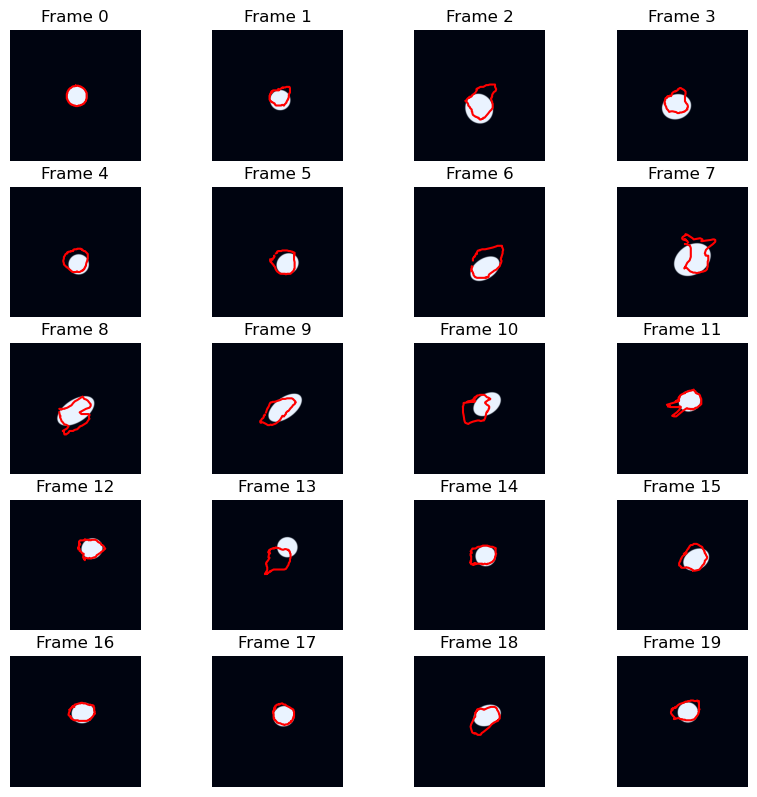

Epoch 315, IOU: 0.599422
Epoch 316, Loss: 18.01
Epoch 317, Loss: 25.03
Epoch 318, Loss: 26.87
Epoch 319, Loss: 25.15
Epoch 320, Loss: 16.13


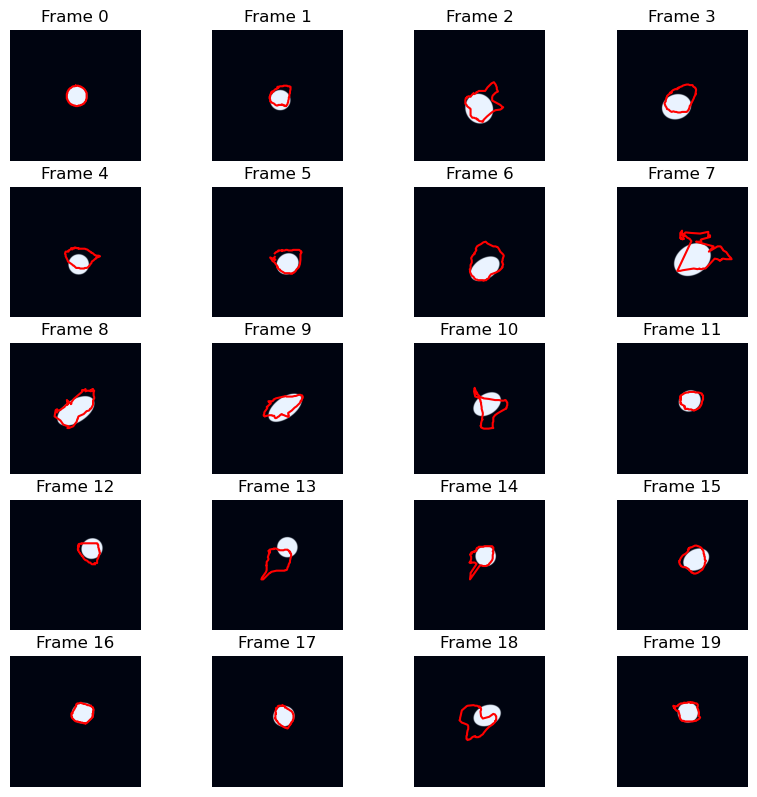

Epoch 320, IOU: 0.583835
Epoch 321, Loss: 20.33
Epoch 322, Loss: 19.90
Epoch 323, Loss: 18.31
Epoch 324, Loss: 23.63
Epoch 325, Loss: 81.07


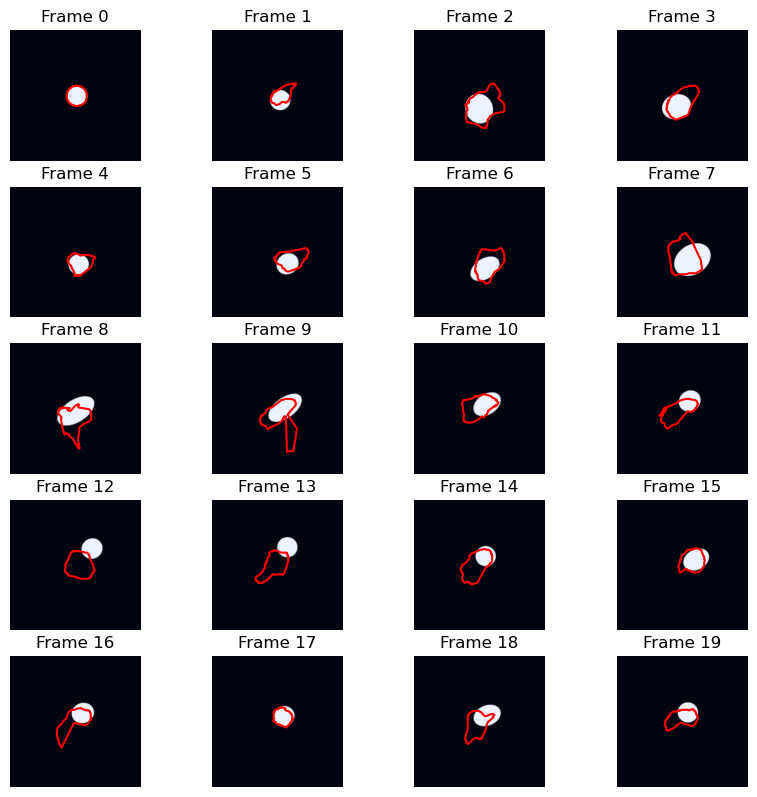

Epoch 325, IOU: 0.462083
Epoch 326, Loss: 45.01
Epoch 327, Loss: 21.73
Epoch 328, Loss: 20.97
Epoch 329, Loss: 20.16
Epoch 330, Loss: 17.95


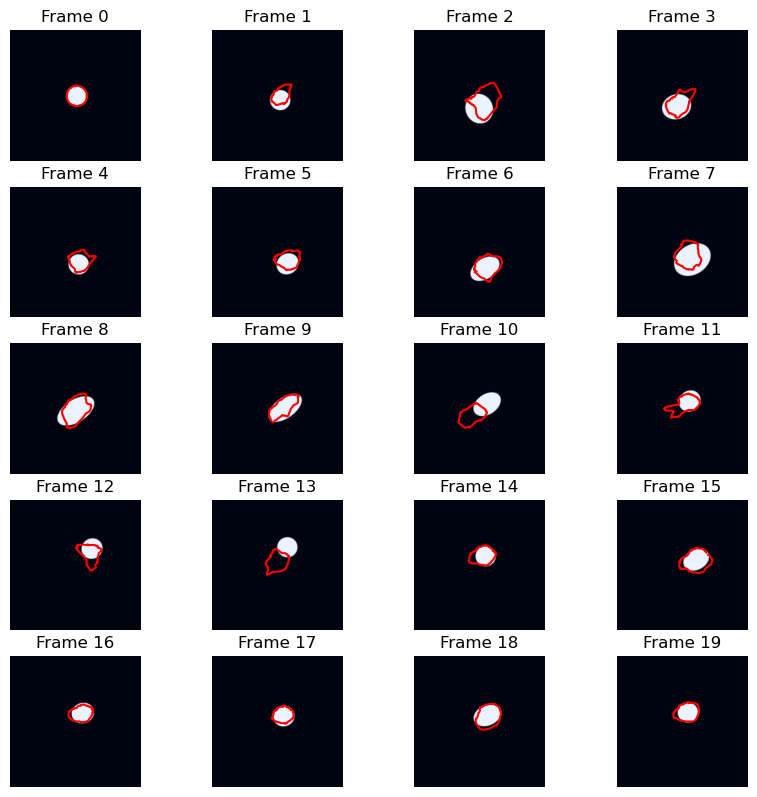

Epoch 330, IOU: 0.602259
Epoch 331, Loss: 18.30
Epoch 332, Loss: 18.13
Epoch 333, Loss: 16.53
Epoch 334, Loss: 19.24
Epoch 335, Loss: 14.35


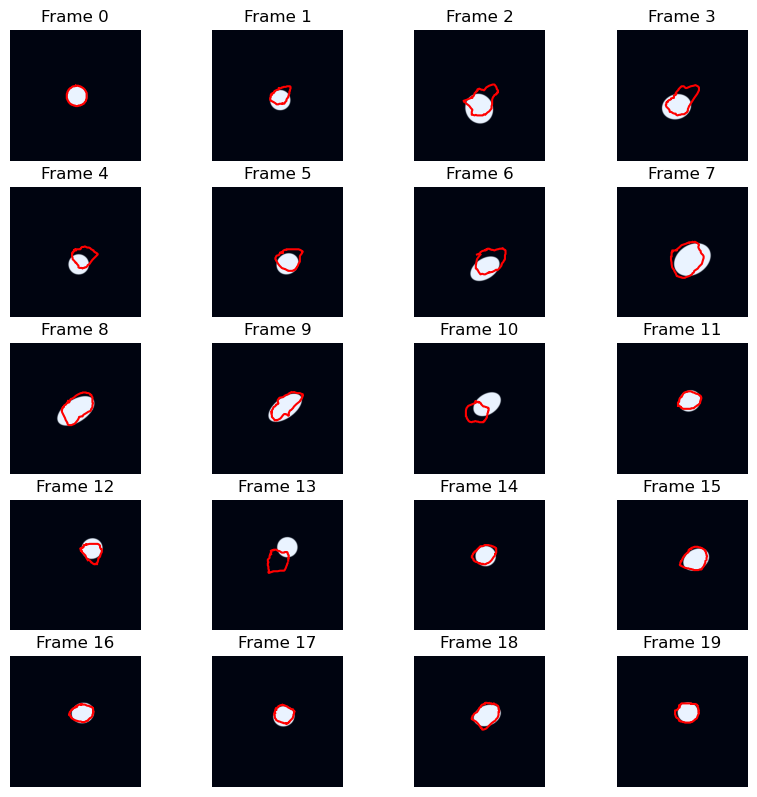

Epoch 335, IOU: 0.610628
Epoch 336, Loss: 10.85
Epoch 337, Loss: 13.89
Epoch 338, Loss: 13.46
Epoch 339, Loss: 14.89
Epoch 340, Loss: 13.50


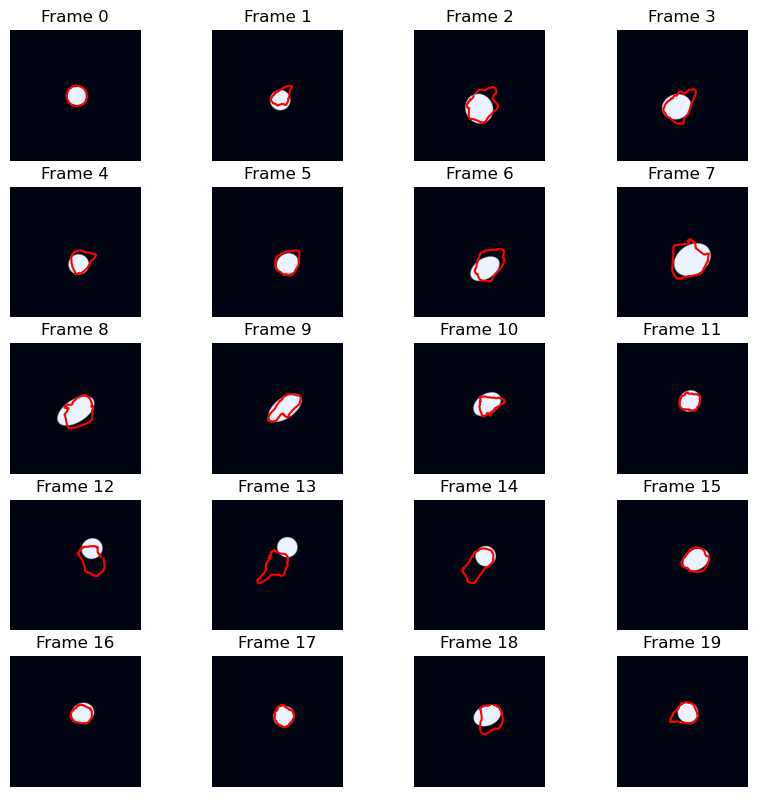

Epoch 340, IOU: 0.640555
Epoch 341, Loss: 13.23
Epoch 342, Loss: 12.27
Epoch 343, Loss: 13.47
Epoch 344, Loss: 13.22
Epoch 345, Loss: 14.28


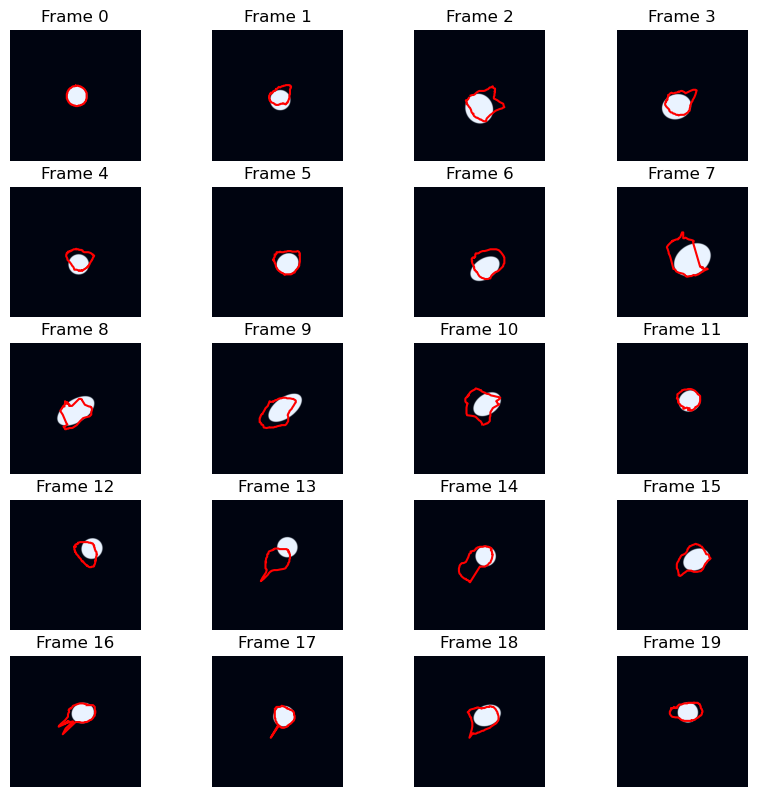

Epoch 345, IOU: 0.582290
Epoch 346, Loss: 27.23
Epoch 347, Loss: 18.16
Epoch 348, Loss: 17.90
Epoch 349, Loss: 14.08
Epoch 350, Loss: 15.62


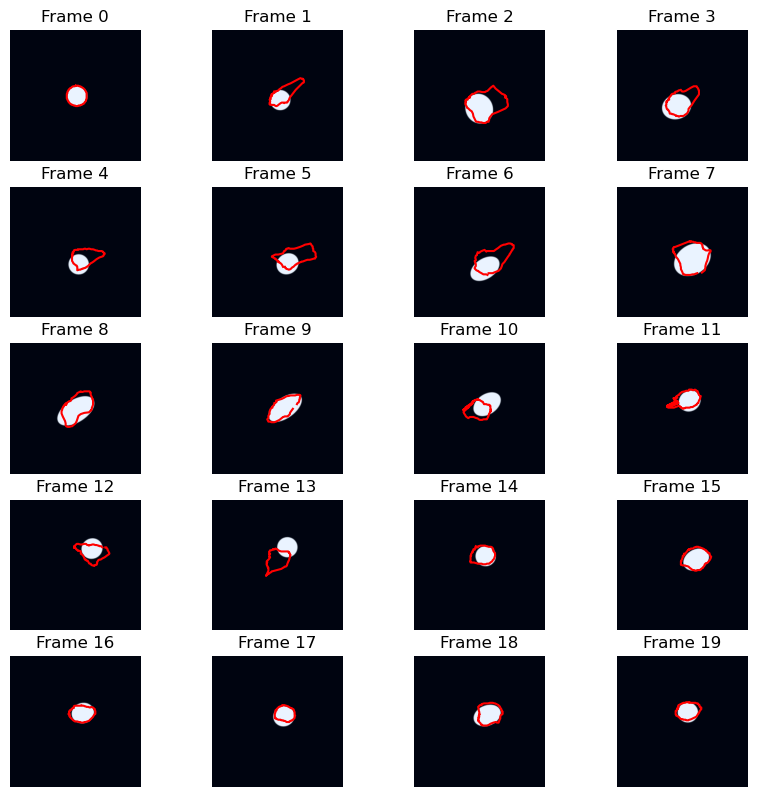

Epoch 350, IOU: 0.583903
Epoch 351, Loss: 16.45
Epoch 352, Loss: 19.46
Epoch 353, Loss: 17.97
Epoch 354, Loss: 16.23
Epoch 355, Loss: 15.94


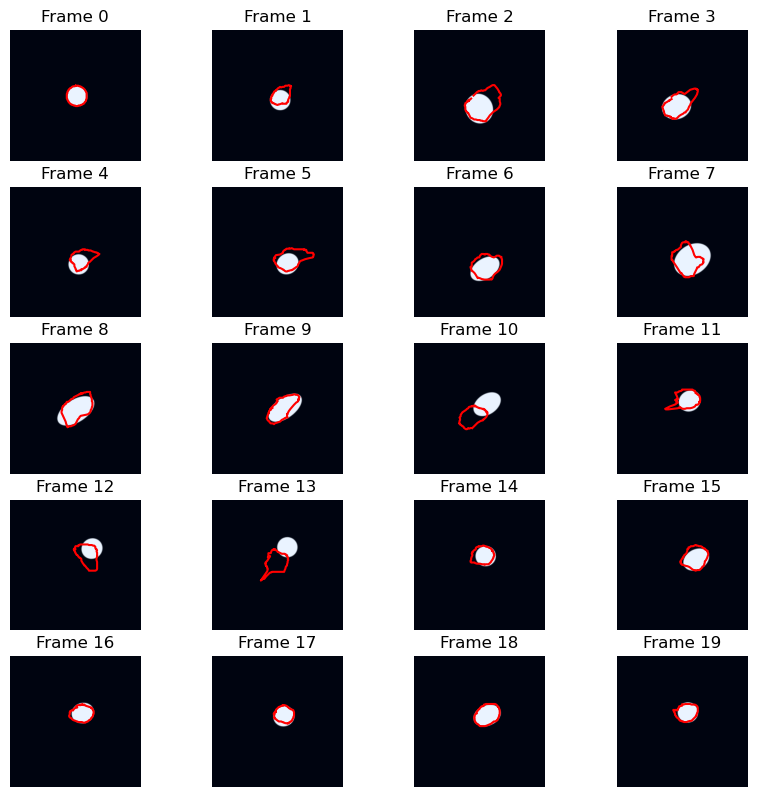

Epoch 355, IOU: 0.617273
Epoch 356, Loss: 17.39
Epoch 357, Loss: 21.82
Epoch 358, Loss: 23.39
Epoch 359, Loss: 18.02
Epoch 360, Loss: 15.81


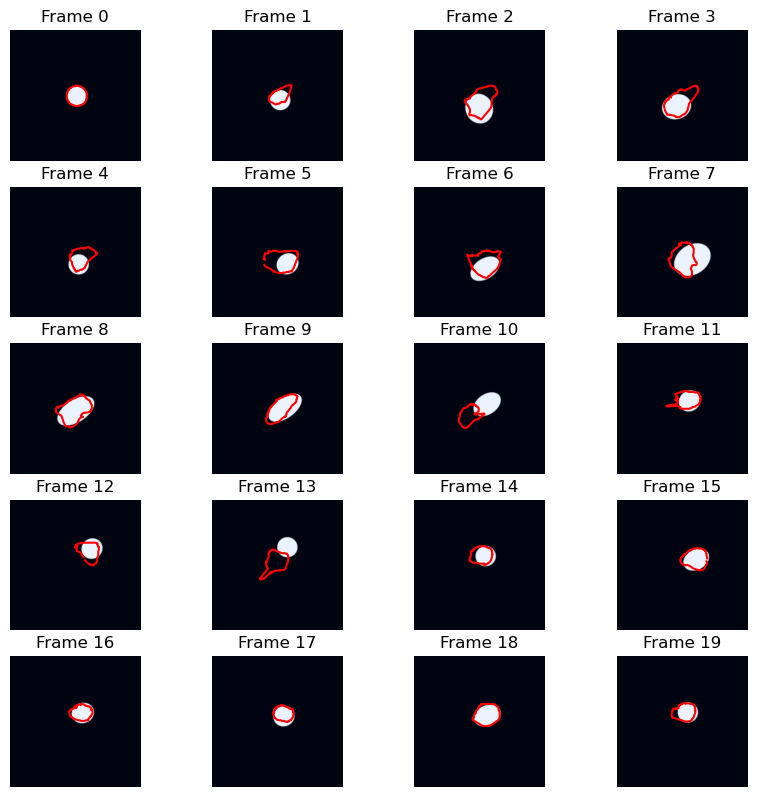

Epoch 360, IOU: 0.584843
Epoch 361, Loss: 15.64
Epoch 362, Loss: 12.83
Epoch 363, Loss: 13.97
Epoch 364, Loss: 13.54
Epoch 365, Loss: 13.72


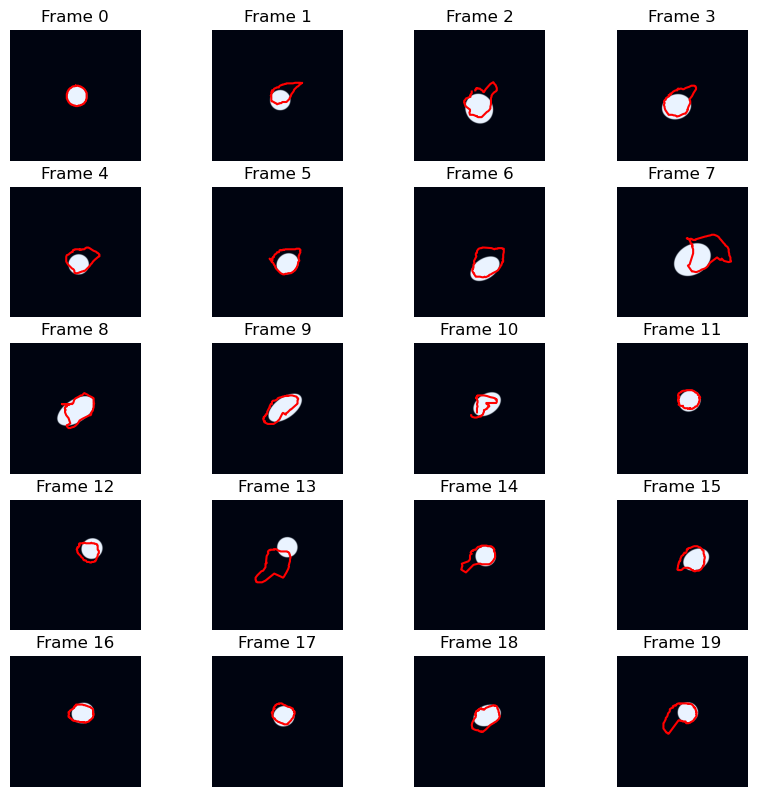

Epoch 365, IOU: 0.583185
Epoch 366, Loss: 13.85
Epoch 367, Loss: 16.14
Epoch 368, Loss: 15.41
Epoch 369, Loss: 14.04
Epoch 370, Loss: 13.70


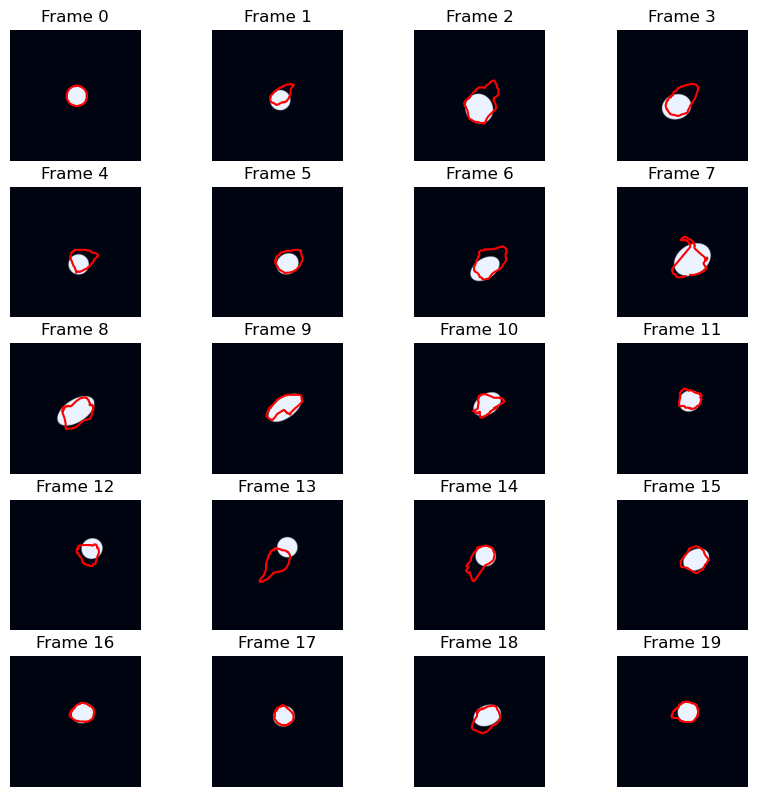

Epoch 370, IOU: 0.635346
Epoch 371, Loss: 15.74
Epoch 372, Loss: 13.49
Epoch 373, Loss: 15.21
Epoch 374, Loss: 13.69
Epoch 375, Loss: 12.44


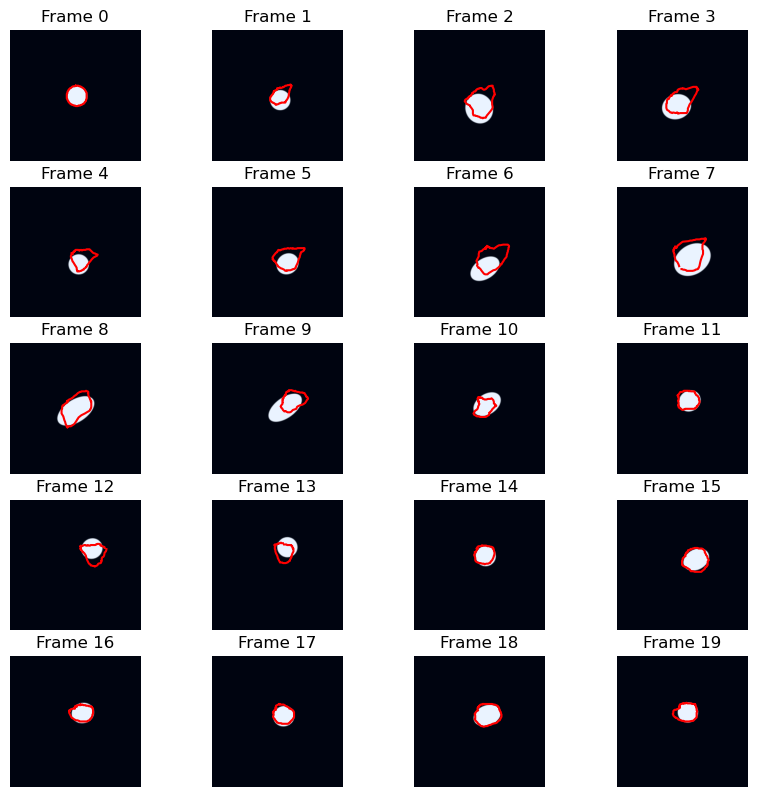

Epoch 375, IOU: 0.629832
Epoch 376, Loss: 12.53
Epoch 377, Loss: 12.52
Epoch 378, Loss: 13.48
Epoch 379, Loss: 15.48
Epoch 380, Loss: 13.09


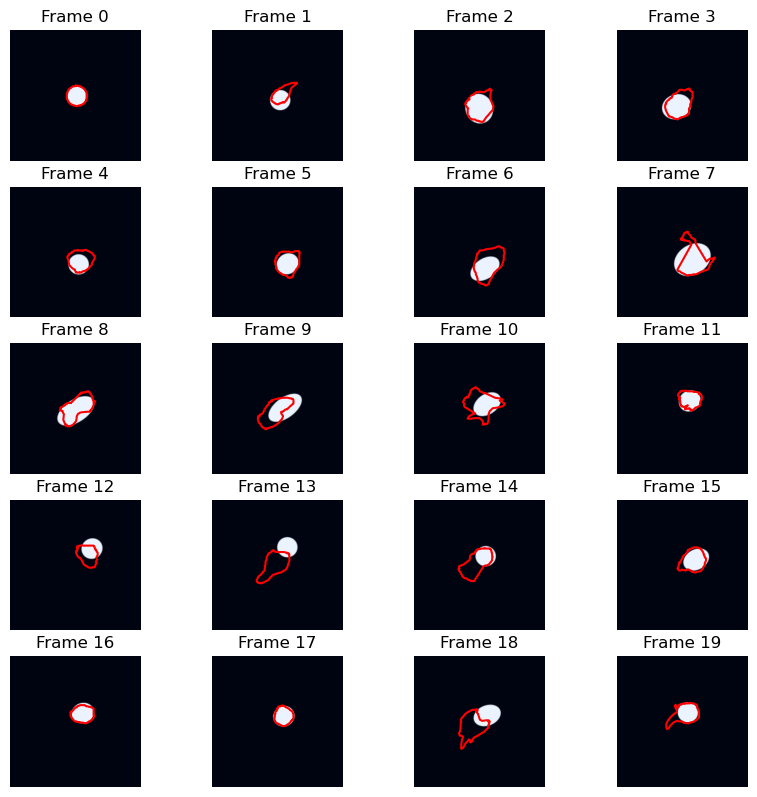

Epoch 380, IOU: 0.581114
Epoch 381, Loss: 14.63
Epoch 382, Loss: 18.08
Epoch 383, Loss: 12.20
Epoch 384, Loss: 17.99
Epoch 385, Loss: 16.40


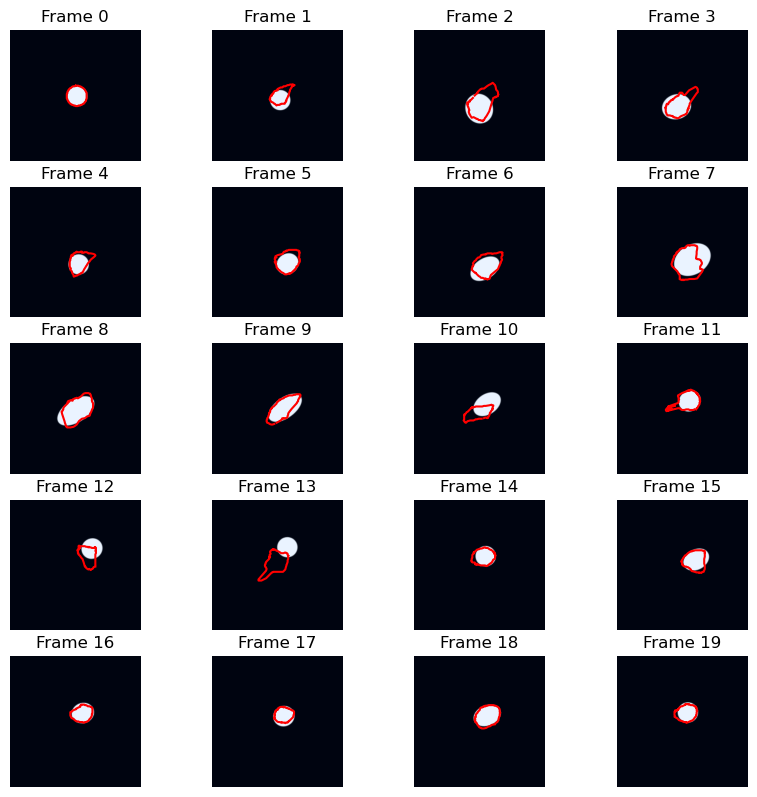

Epoch 385, IOU: 0.652371
Epoch 386, Loss: 14.76
Epoch 387, Loss: 13.07
Epoch 388, Loss: 14.47
Epoch 389, Loss: 16.08
Epoch 390, Loss: 13.57


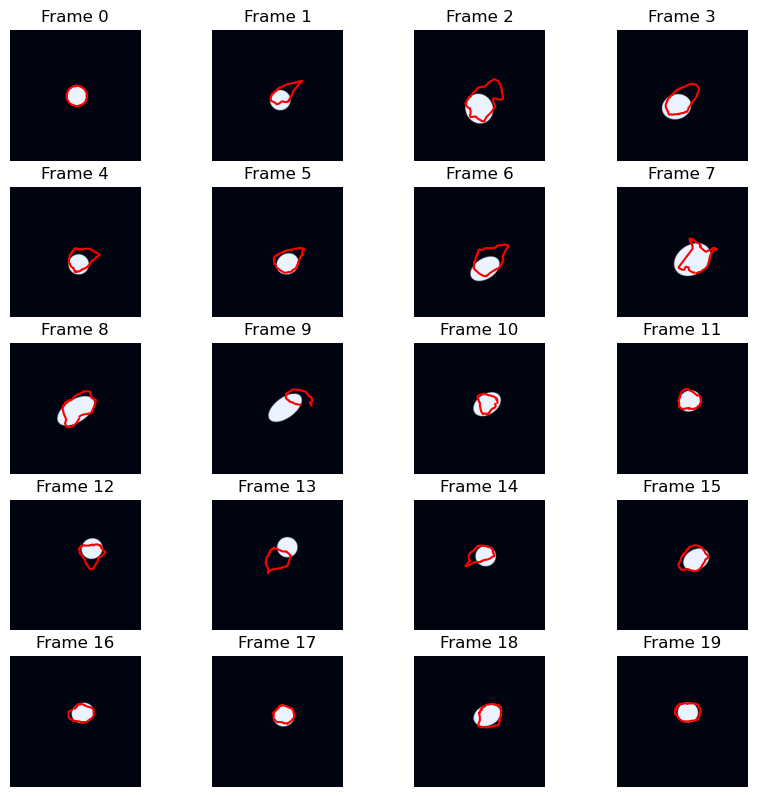

Epoch 390, IOU: 0.580432
Epoch 391, Loss: 12.76
Epoch 392, Loss: 12.72
Epoch 393, Loss: 13.32
Epoch 394, Loss: 12.00
Epoch 395, Loss: 12.88


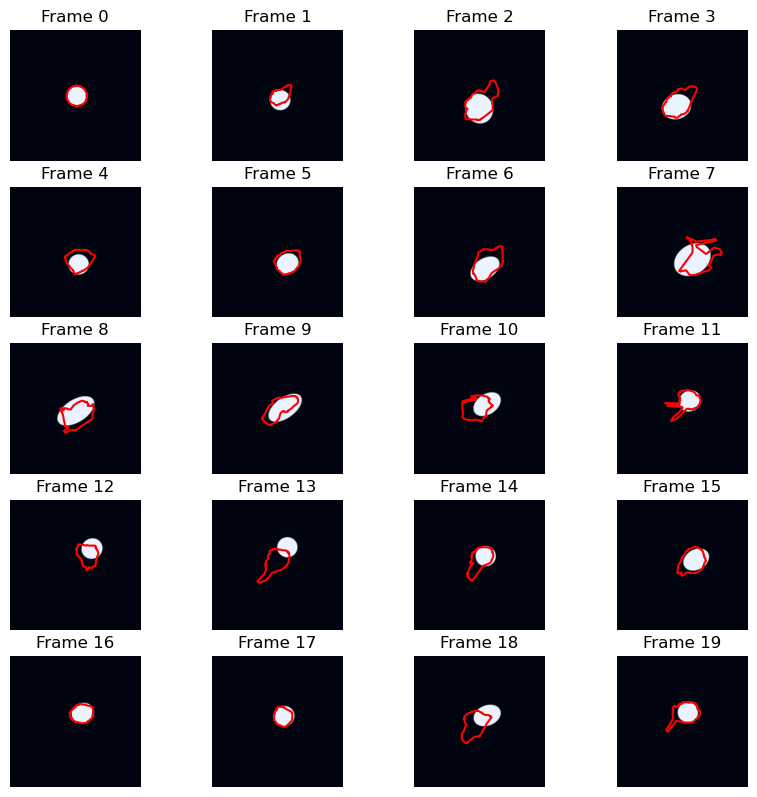

Epoch 395, IOU: 0.572767
Epoch 396, Loss: 12.76
Epoch 397, Loss: 17.60
Epoch 398, Loss: 15.06
Epoch 399, Loss: 13.39
Epoch 400, Loss: 23.58


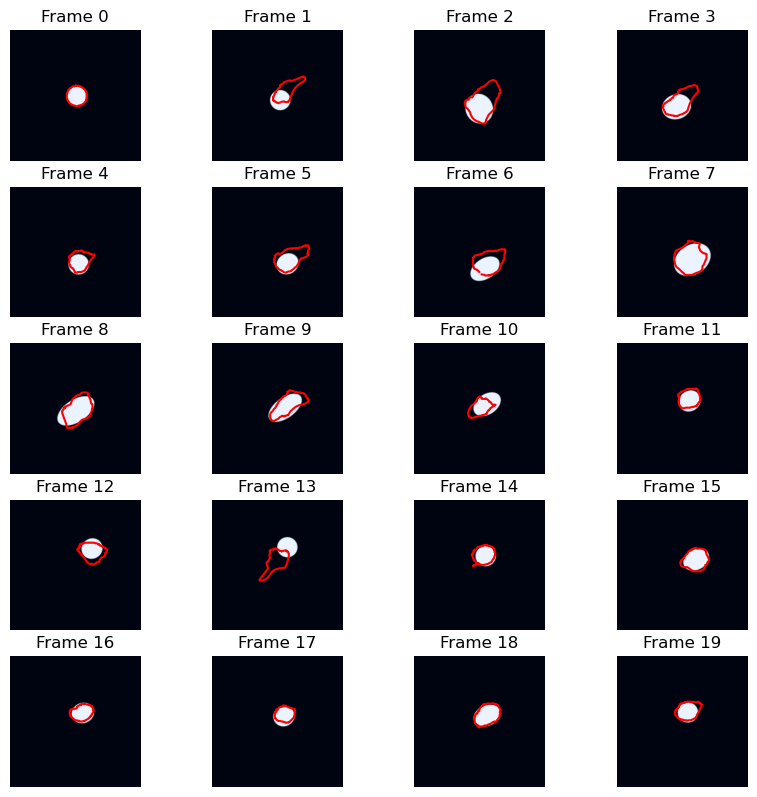

Epoch 400, IOU: 0.631381
Epoch 401, Loss: 15.43
Epoch 402, Loss: 12.66
Epoch 403, Loss: 13.30
Epoch 404, Loss: 13.06
Epoch 405, Loss: 14.02


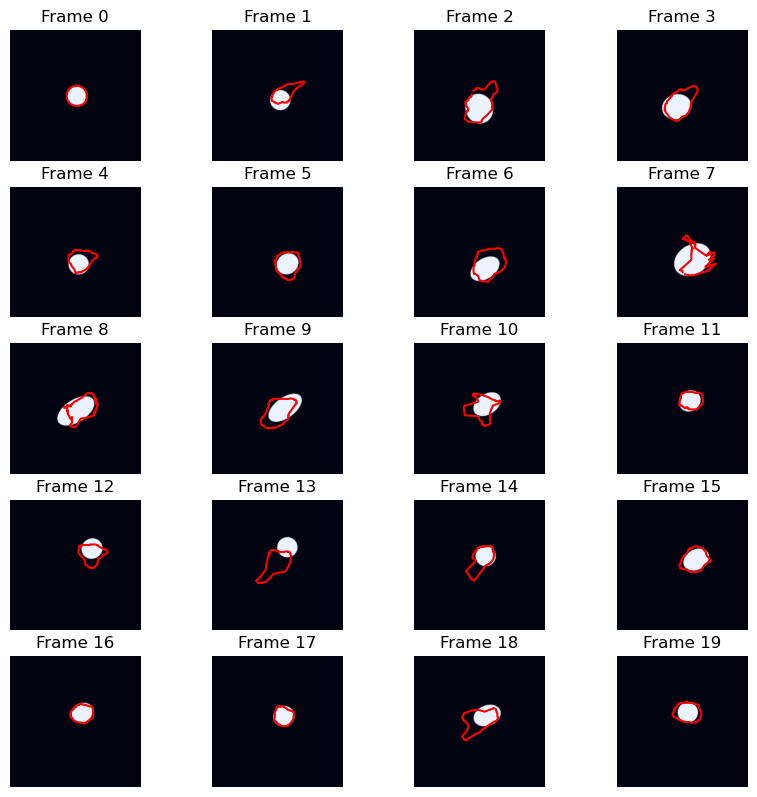

Epoch 405, IOU: 0.593961
Epoch 406, Loss: 15.81
Epoch 407, Loss: 12.23
Epoch 408, Loss: 16.48
Epoch 409, Loss: 13.49
Epoch 410, Loss: 14.62


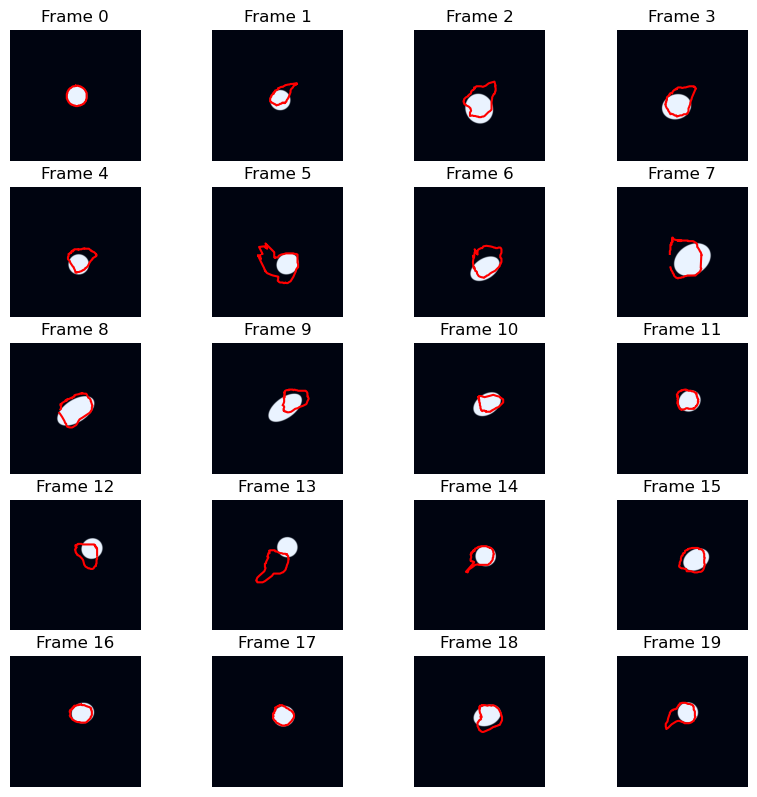

Epoch 410, IOU: 0.578962
Epoch 411, Loss: 14.05
Epoch 412, Loss: 14.35
Epoch 413, Loss: 14.32
Epoch 414, Loss: 15.16
Epoch 415, Loss: 14.98


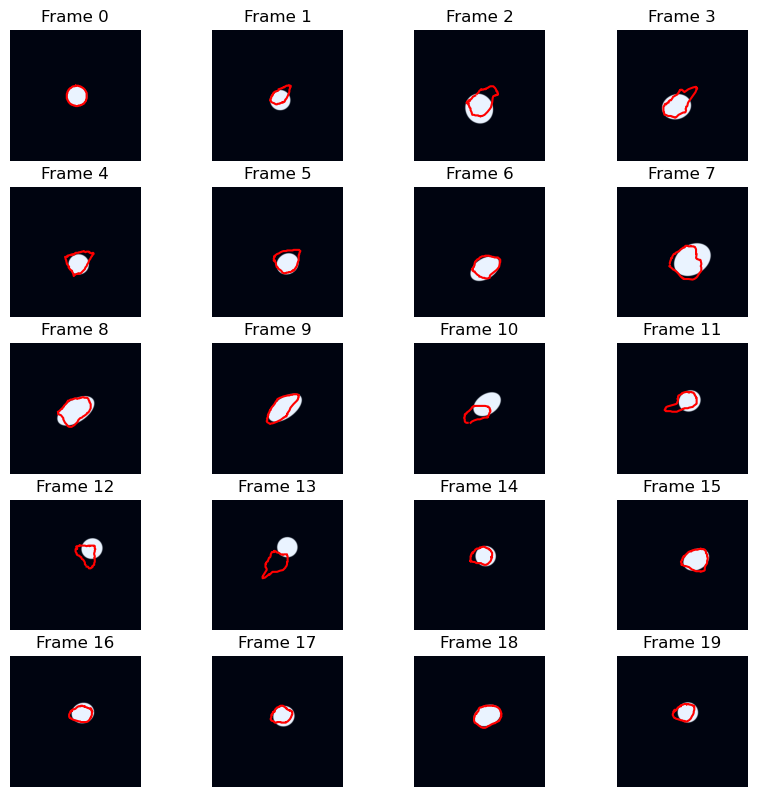

Epoch 415, IOU: 0.614923
Epoch 416, Loss: 18.79
Epoch 417, Loss: 16.52
Epoch 418, Loss: 20.64
Epoch 419, Loss: 13.03
Epoch 420, Loss: 12.50


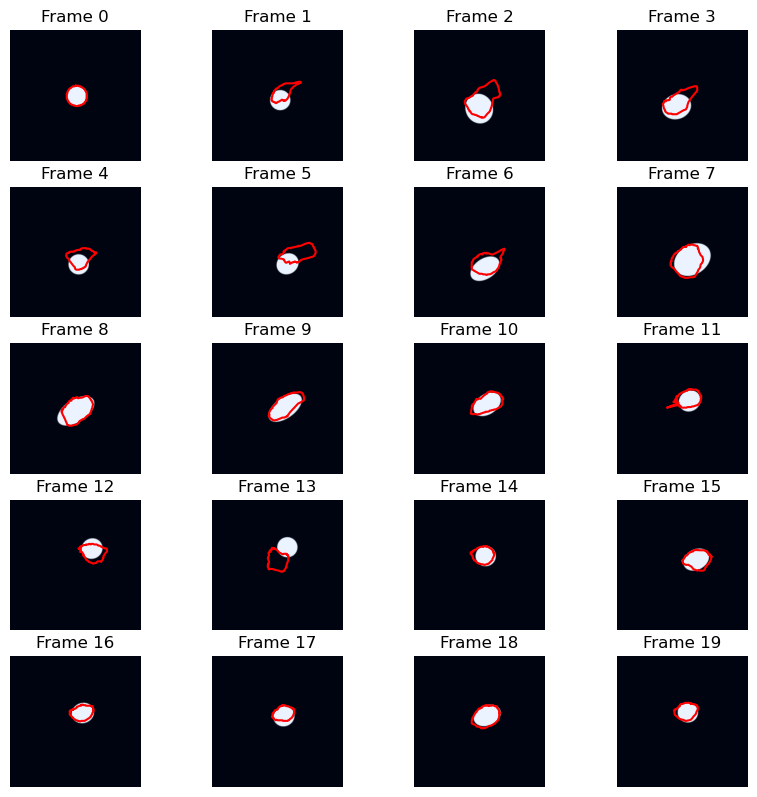

Epoch 420, IOU: 0.618796
Epoch 421, Loss: 22.56
Epoch 422, Loss: 14.68
Epoch 423, Loss: 16.79
Epoch 424, Loss: 13.70
Epoch 425, Loss: 14.73


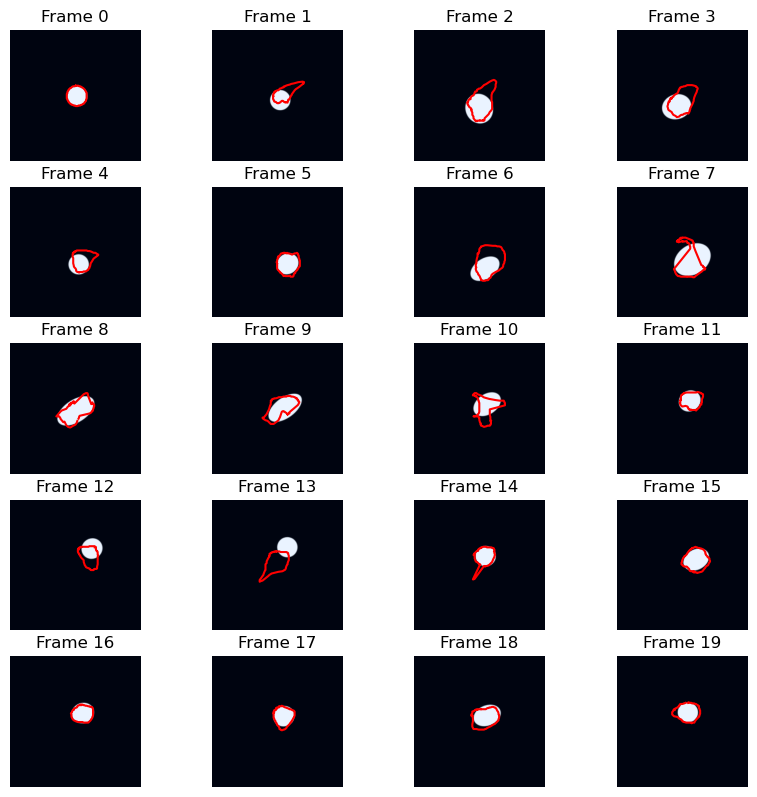

Epoch 425, IOU: 0.615314
Epoch 426, Loss: 15.66
Epoch 427, Loss: 21.43
Epoch 428, Loss: 22.73
Epoch 429, Loss: 23.48
Epoch 430, Loss: 19.96


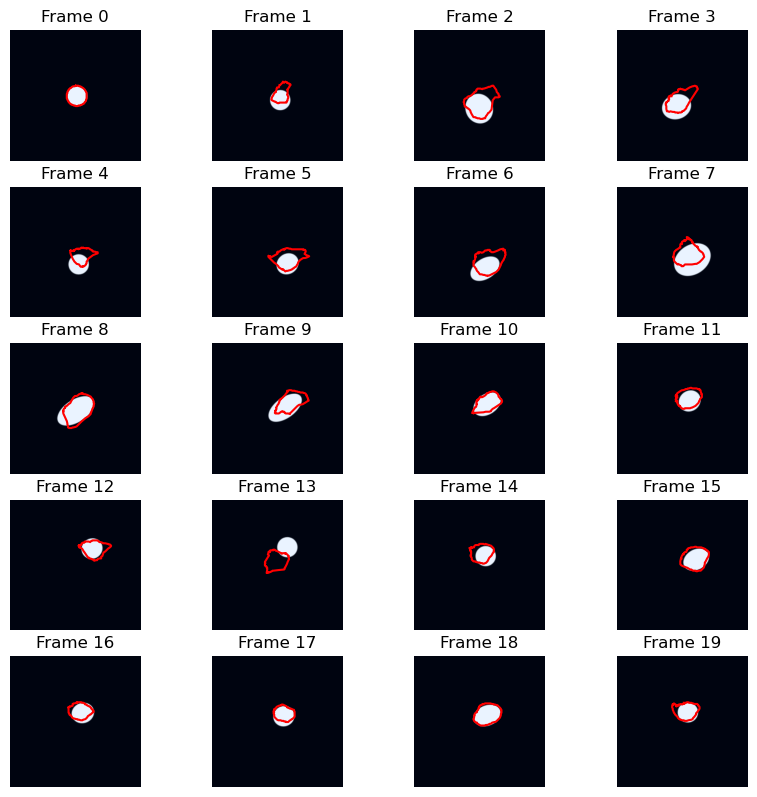

Epoch 430, IOU: 0.578839
Epoch 431, Loss: 15.18
Epoch 432, Loss: 14.11
Epoch 433, Loss: 14.17
Epoch 434, Loss: 14.84
Epoch 435, Loss: 12.21


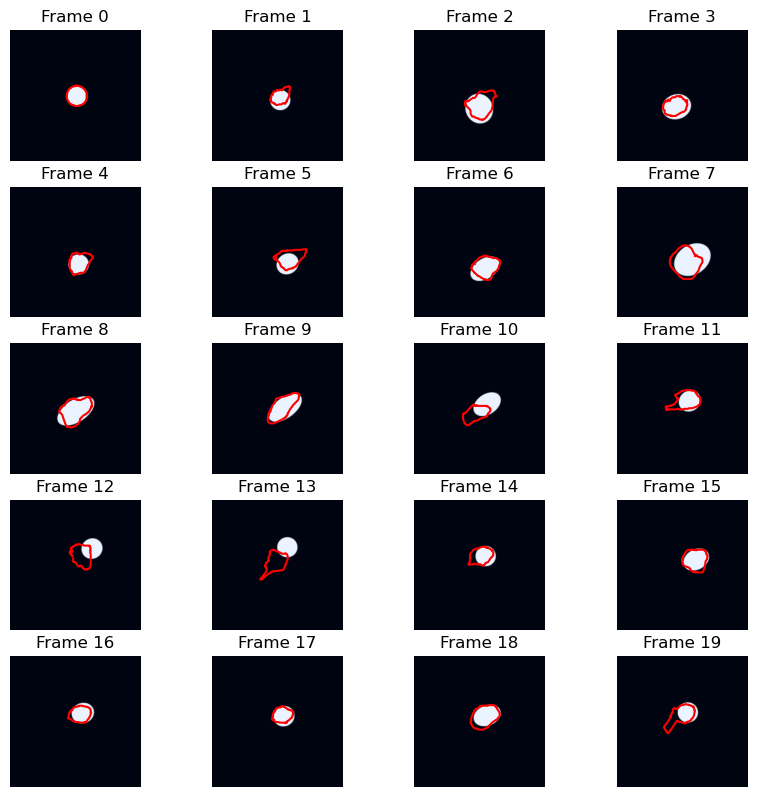

Epoch 435, IOU: 0.603088
Epoch 436, Loss: 15.98
Epoch 437, Loss: 16.11
Epoch 438, Loss: 15.08
Epoch 439, Loss: 15.18
Epoch 440, Loss: 14.10


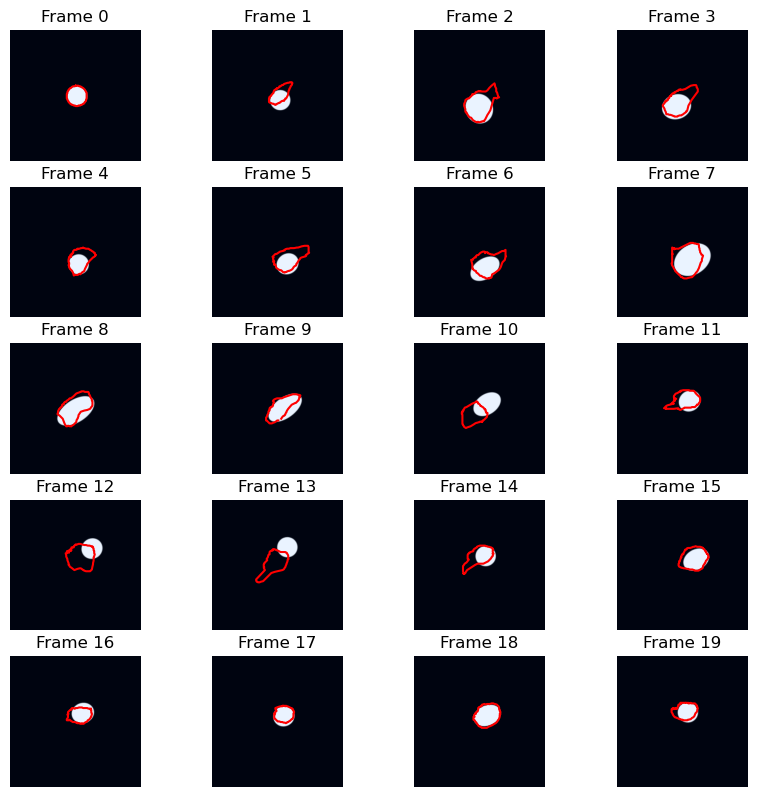

Epoch 440, IOU: 0.575187
Epoch 441, Loss: 18.33
Epoch 442, Loss: 17.15
Epoch 443, Loss: 17.39
Epoch 444, Loss: 16.38
Epoch 445, Loss: 18.93


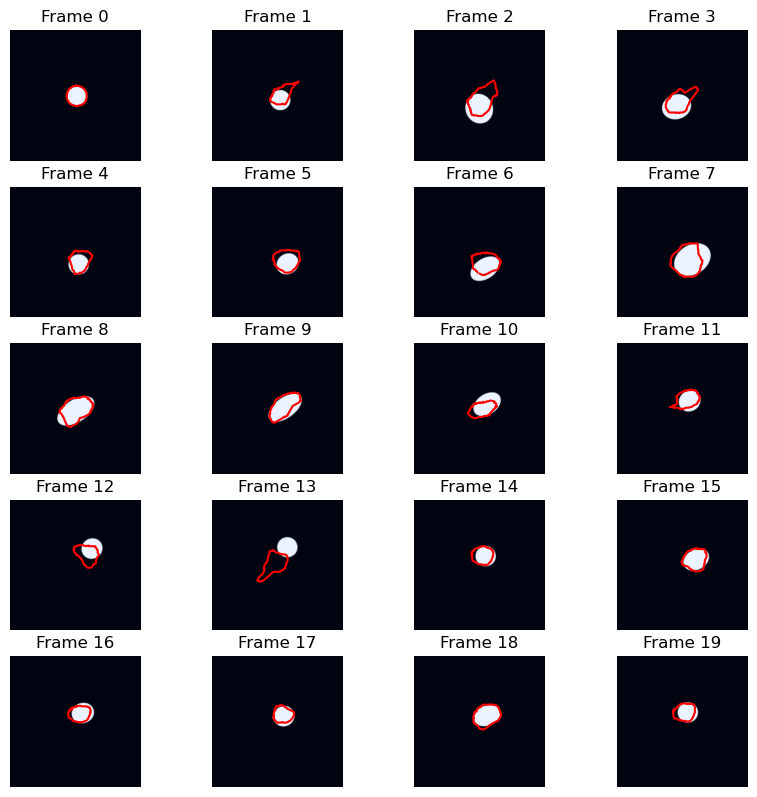

Epoch 445, IOU: 0.626864
Epoch 446, Loss: 14.90
Epoch 447, Loss: 15.47
Epoch 448, Loss: 13.12
Epoch 449, Loss: 11.90
Epoch 450, Loss: 14.25


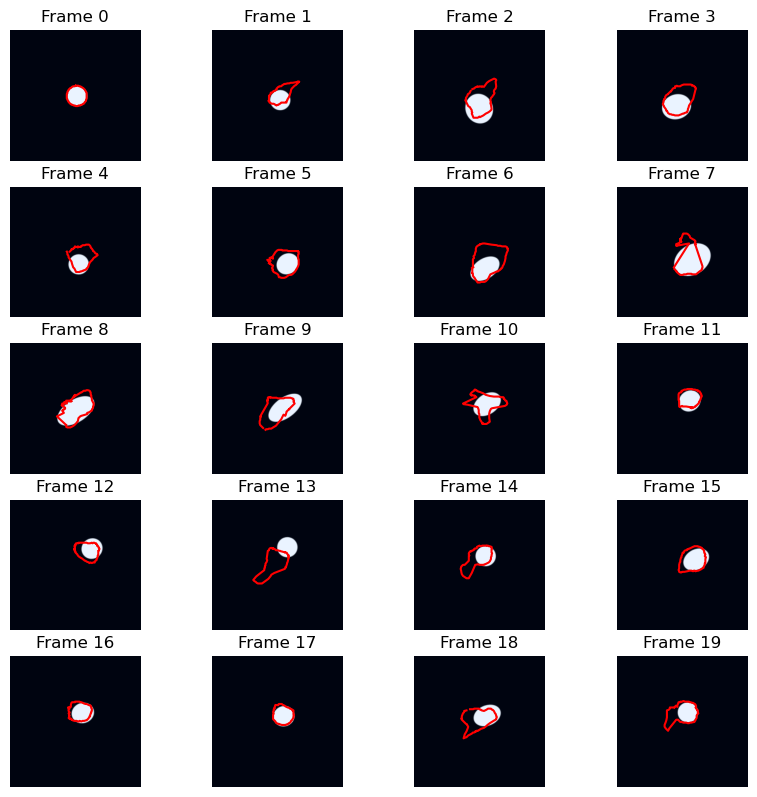

Epoch 450, IOU: 0.549645
Epoch 451, Loss: 13.81
Epoch 452, Loss: 17.19
Epoch 453, Loss: 14.11
Epoch 454, Loss: 19.93
Epoch 455, Loss: 15.43


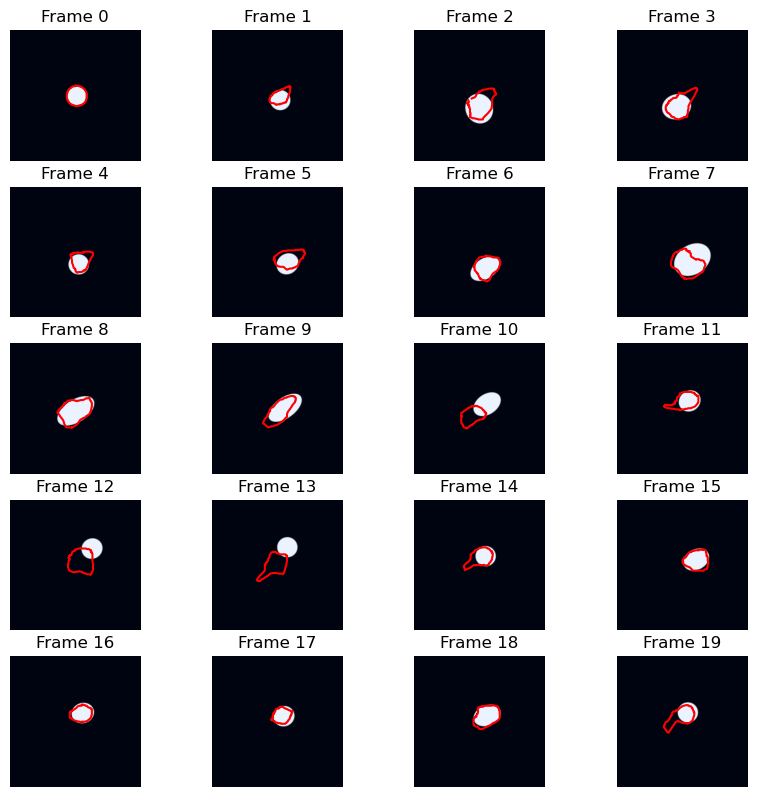

Epoch 455, IOU: 0.578141
Epoch 456, Loss: 15.26
Epoch 457, Loss: 14.86
Epoch 458, Loss: 13.31
Epoch 459, Loss: 14.35
Epoch 460, Loss: 16.73


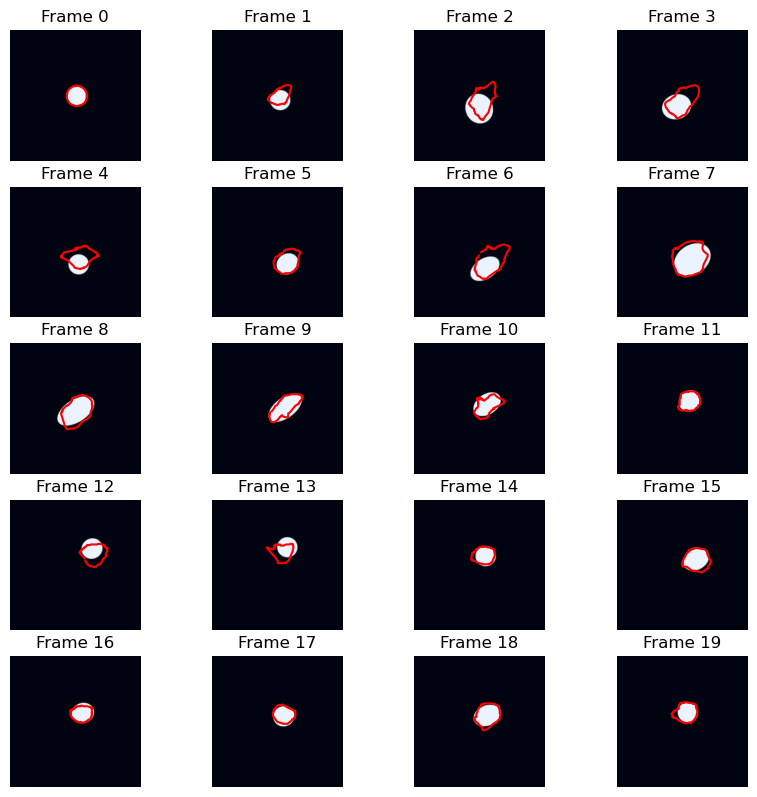

Epoch 460, IOU: 0.670159
Epoch 461, Loss: 14.38
Epoch 462, Loss: 14.88
Epoch 463, Loss: 12.60
Epoch 464, Loss: 11.36
Epoch 465, Loss: 13.38


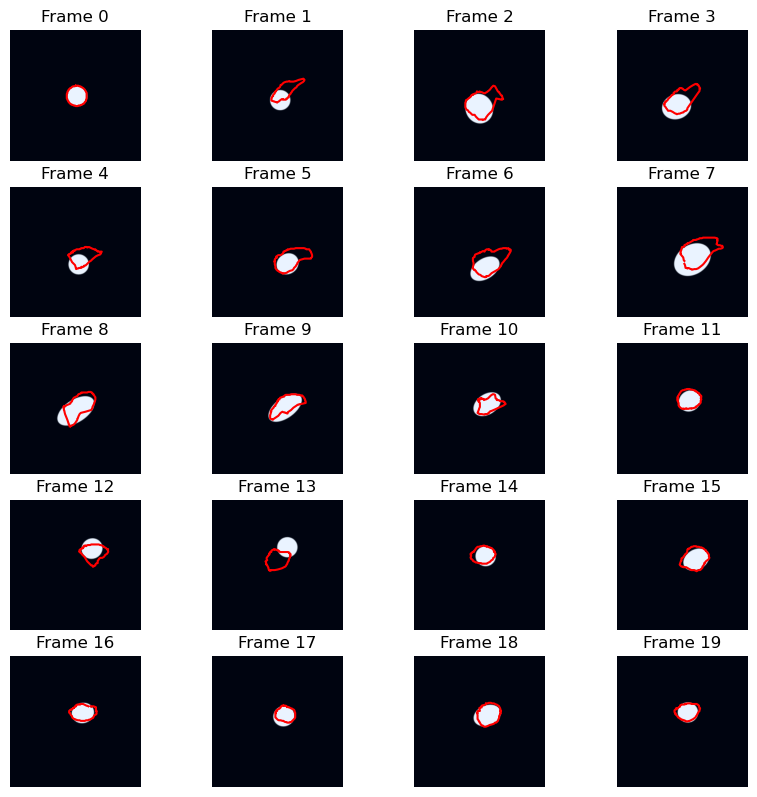

Epoch 465, IOU: 0.593814
Epoch 466, Loss: 12.25
Epoch 467, Loss: 16.08
Epoch 468, Loss: 14.36
Epoch 469, Loss: 12.37
Epoch 470, Loss: 11.99


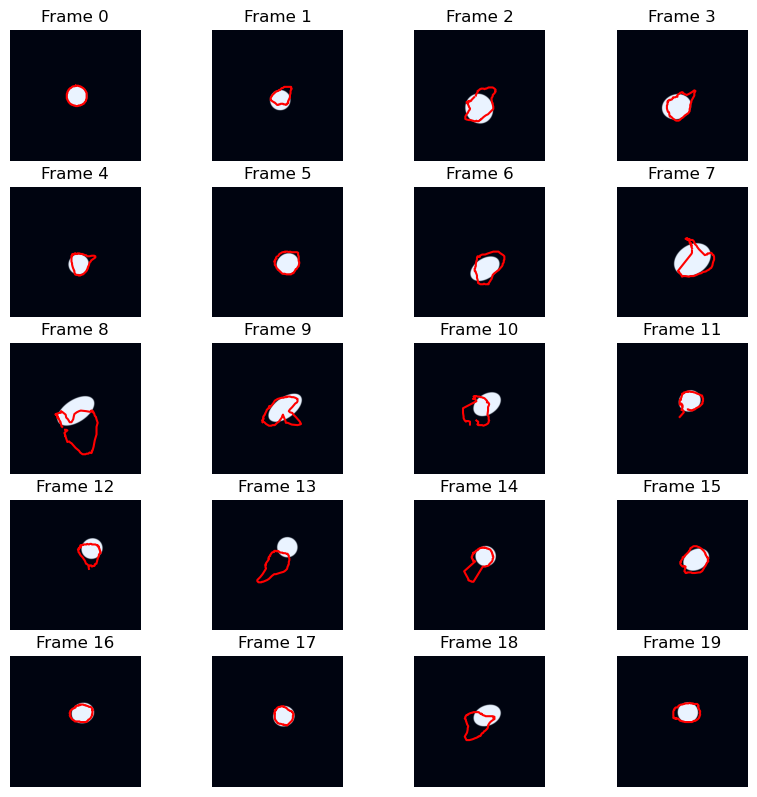

Epoch 470, IOU: 0.585311
Epoch 471, Loss: 16.60
Epoch 472, Loss: 14.17
Epoch 473, Loss: 13.75
Epoch 474, Loss: 11.75
Epoch 475, Loss: 11.19


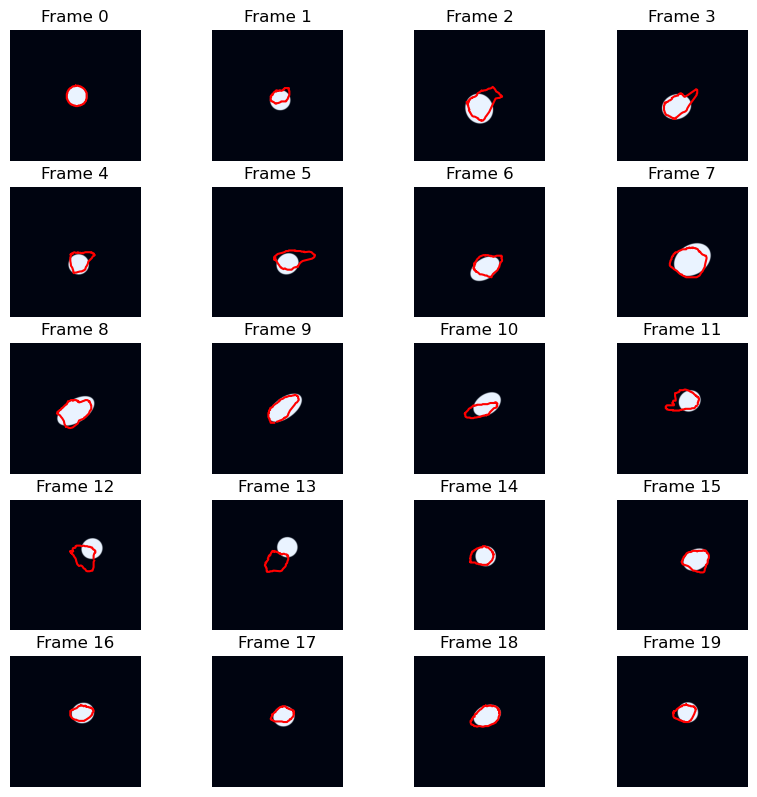

Epoch 475, IOU: 0.613751
Epoch 476, Loss: 14.31
Epoch 477, Loss: 13.79
Epoch 478, Loss: 14.89
Epoch 479, Loss: 15.60
Epoch 480, Loss: 13.35


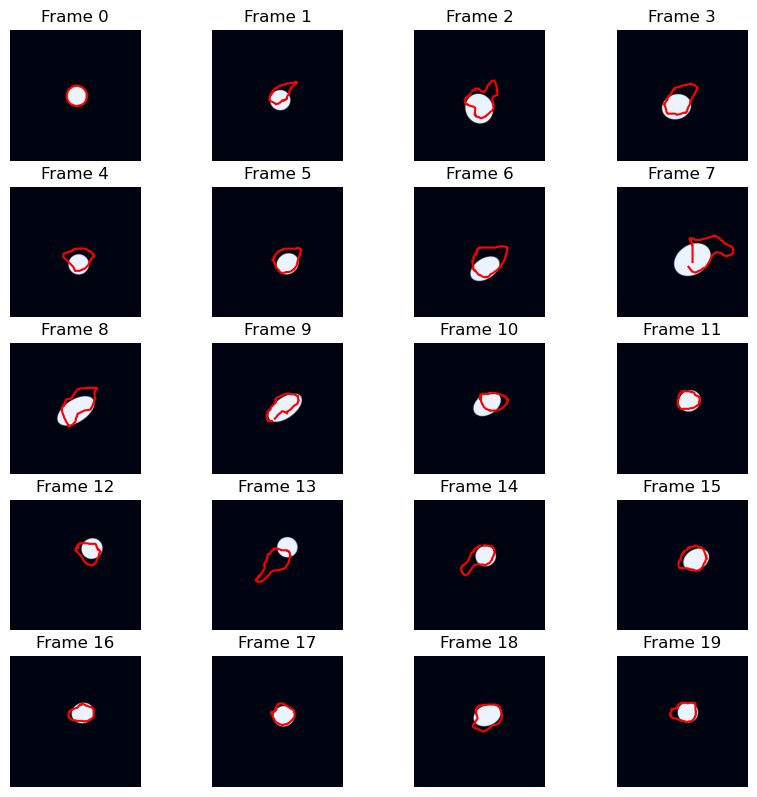

Epoch 480, IOU: 0.572978
Epoch 481, Loss: 14.95
Epoch 482, Loss: 15.93
Epoch 483, Loss: 13.77
Epoch 484, Loss: 14.21
Epoch 485, Loss: 17.81


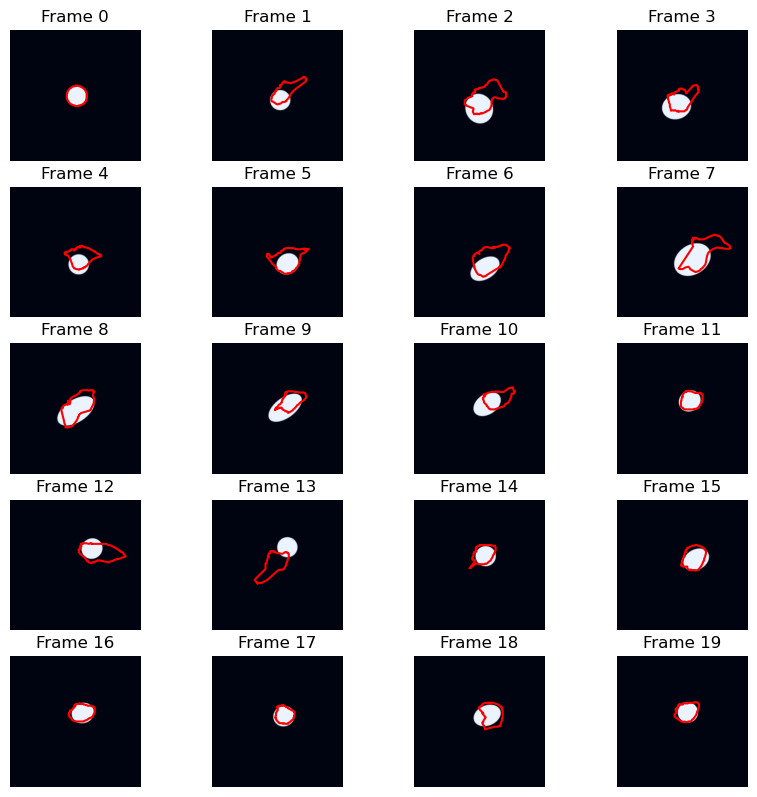

Epoch 485, IOU: 0.529563
Epoch 486, Loss: 13.31
Epoch 487, Loss: 11.77
Epoch 488, Loss: 12.03
Epoch 489, Loss: 18.71
Epoch 490, Loss: 22.95


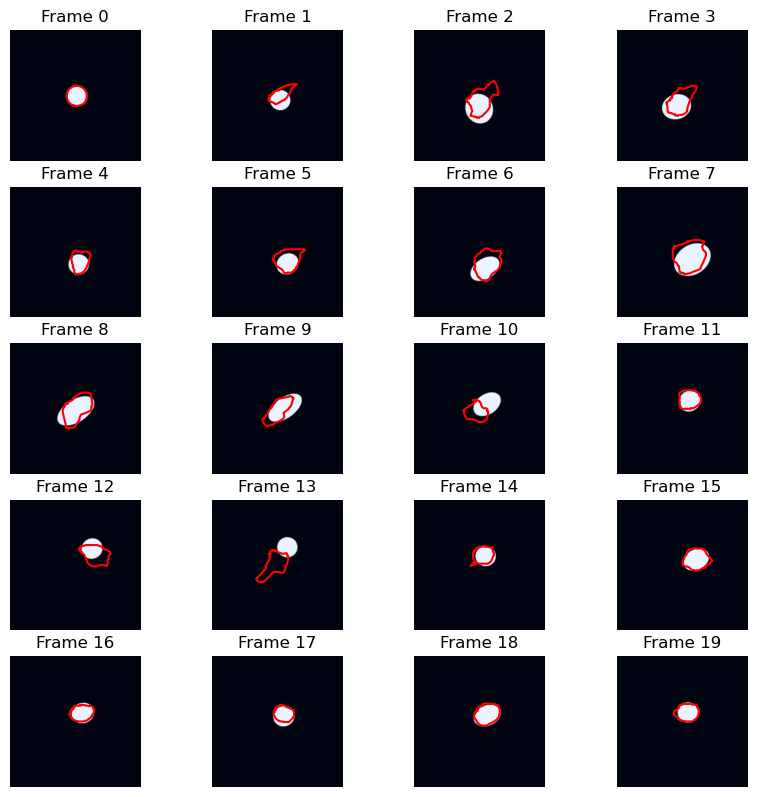

Epoch 490, IOU: 0.610055
Epoch 491, Loss: 13.29
Epoch 492, Loss: 16.27
Epoch 493, Loss: 15.22
Epoch 494, Loss: 19.36
Epoch 495, Loss: 16.96


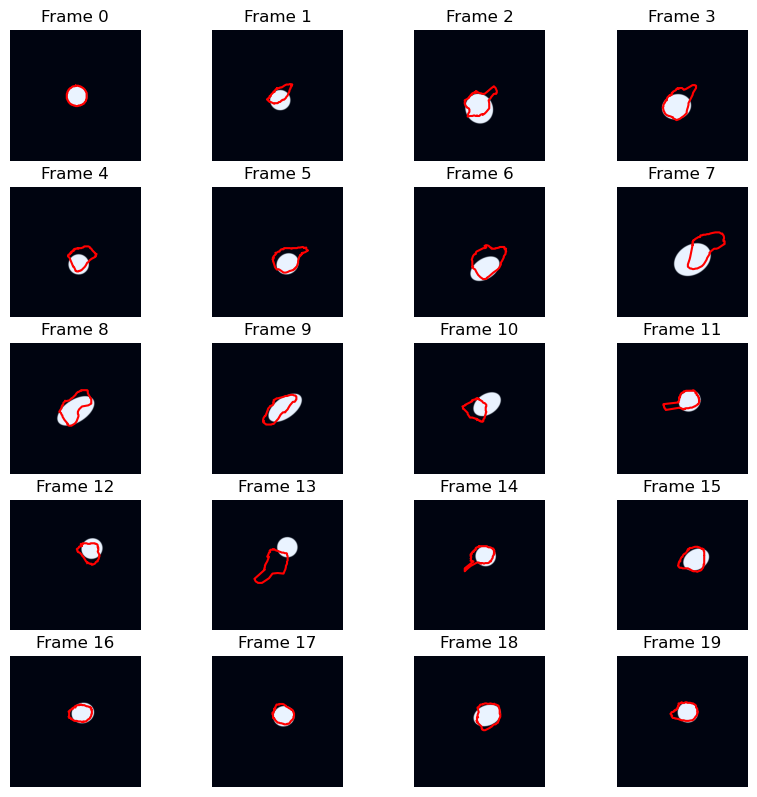

Epoch 495, IOU: 0.564727
Epoch 496, Loss: 15.54
Epoch 497, Loss: 16.08
Epoch 498, Loss: 15.06
Epoch 499, Loss: 14.95
Epoch 500, Loss: 15.42


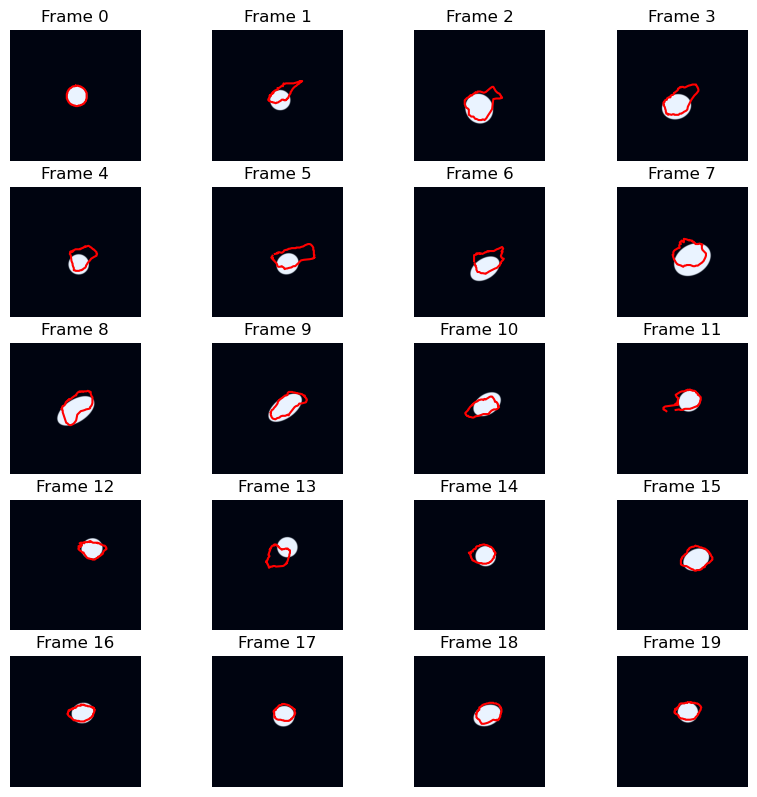

Epoch 500, IOU: 0.588287
Epoch 501, Loss: 12.63
Epoch 502, Loss: 13.40
Epoch 503, Loss: 12.64
Epoch 504, Loss: 13.76
Epoch 505, Loss: 11.86


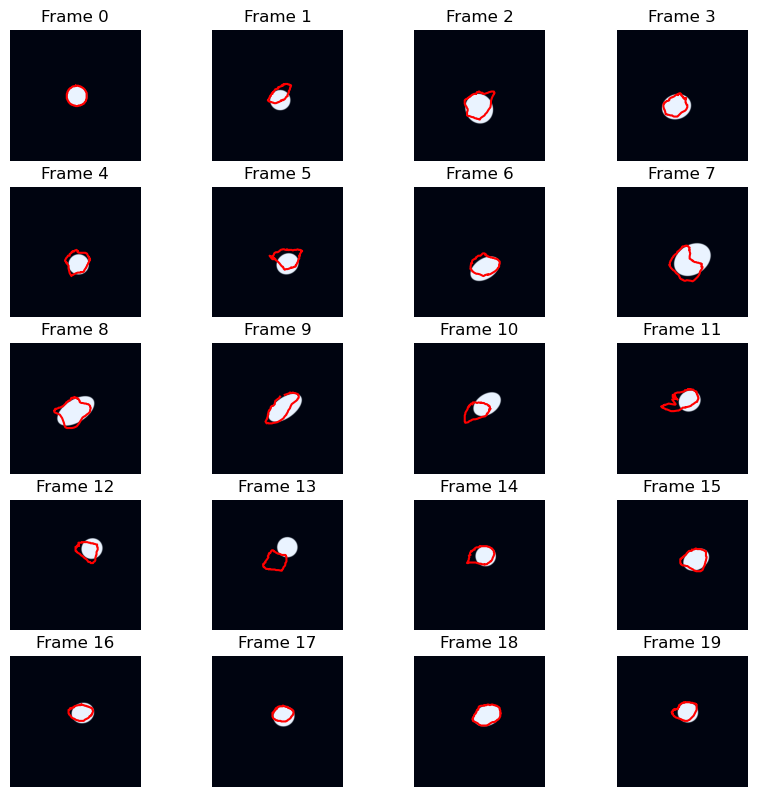

Epoch 505, IOU: 0.602271
Epoch 506, Loss: 16.08
Epoch 507, Loss: 18.01
Epoch 508, Loss: 14.82
Epoch 509, Loss: 14.44
Epoch 510, Loss: 13.27


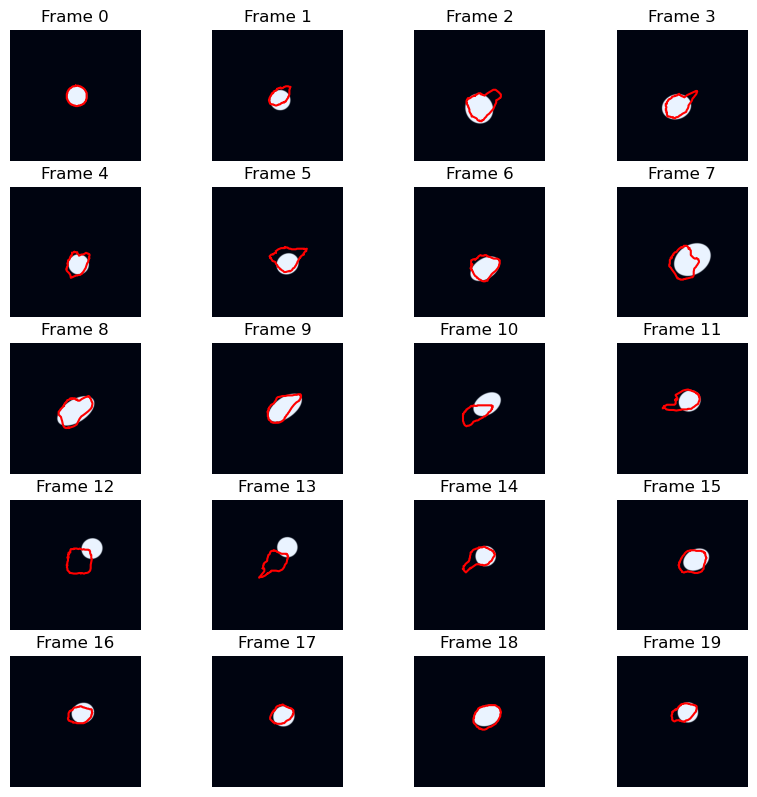

Epoch 510, IOU: 0.599368
Epoch 511, Loss: 14.07
Epoch 512, Loss: 13.67
Epoch 513, Loss: 11.93
Epoch 514, Loss: 11.99
Epoch 515, Loss: 15.13


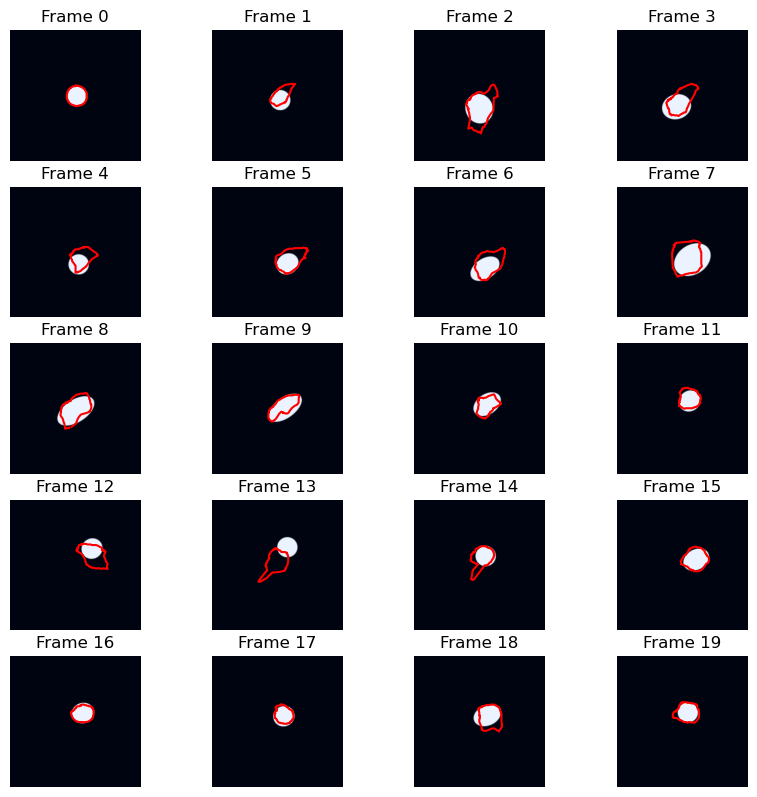

Epoch 515, IOU: 0.623625
Epoch 516, Loss: 14.51
Epoch 517, Loss: 13.73
Epoch 518, Loss: 12.84
Epoch 519, Loss: 16.05
Epoch 520, Loss: 13.51


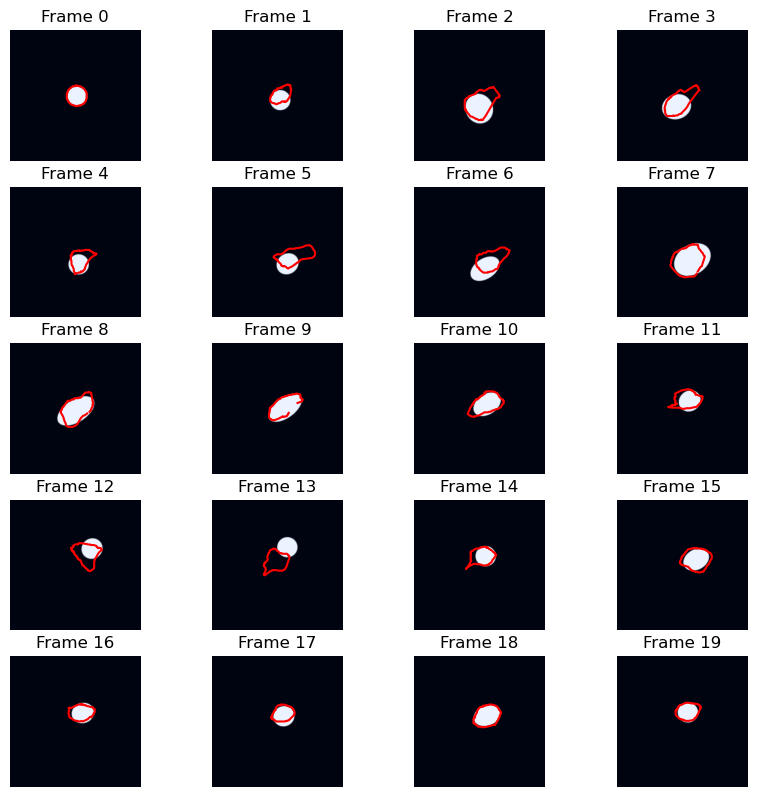

Epoch 520, IOU: 0.626232
Epoch 521, Loss: 11.72
Epoch 522, Loss: 12.08
Epoch 523, Loss: 12.53
Epoch 524, Loss: 15.03
Epoch 525, Loss: 14.31


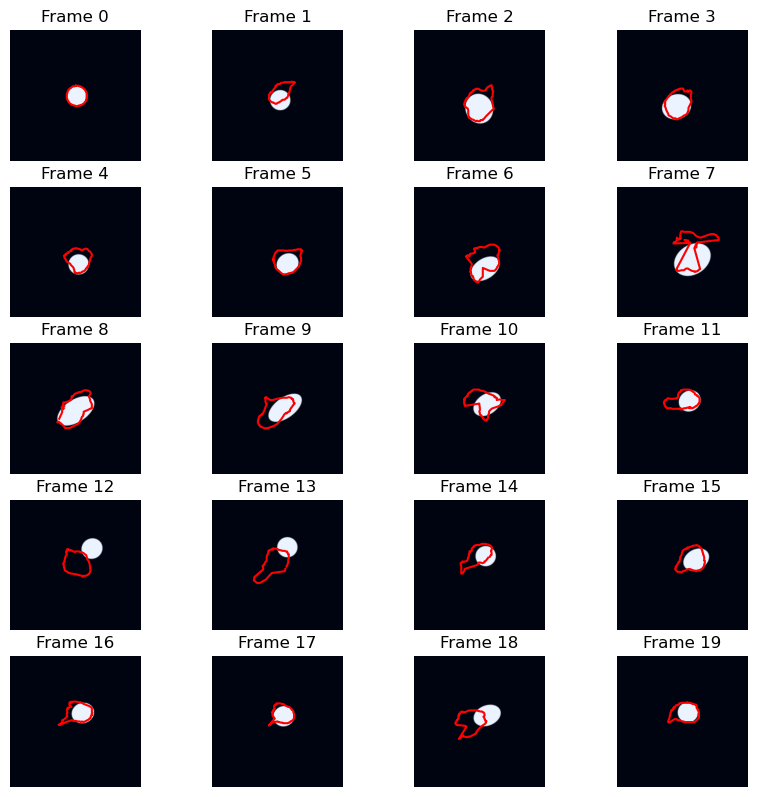

Epoch 525, IOU: 0.504112
Epoch 526, Loss: 13.60
Epoch 527, Loss: 15.60
Epoch 528, Loss: 12.64
Epoch 529, Loss: 14.43
Epoch 530, Loss: 13.71


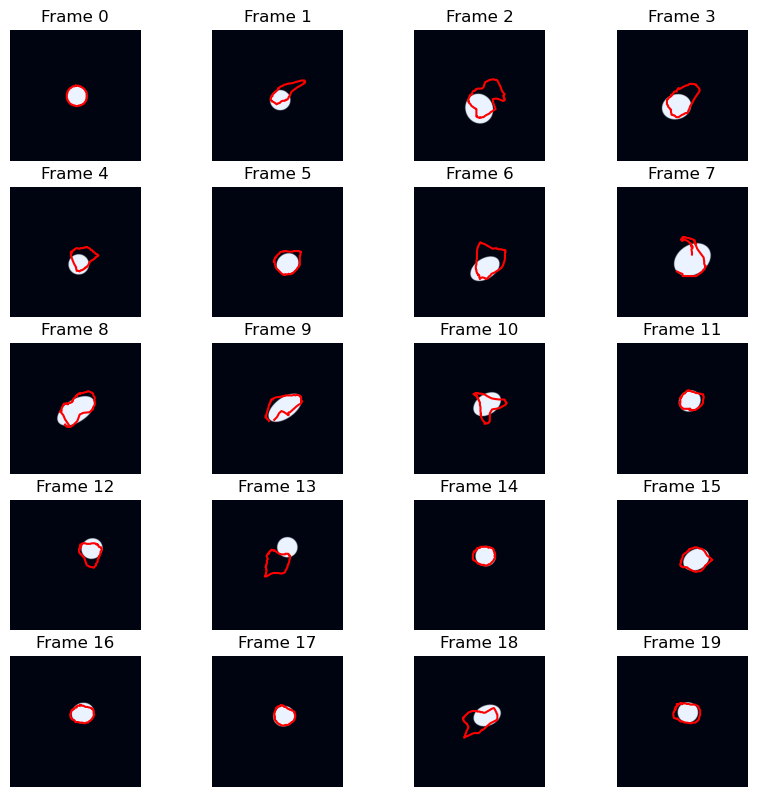

Epoch 530, IOU: 0.594032
Epoch 531, Loss: 13.00
Epoch 532, Loss: 18.27
Epoch 533, Loss: 15.86
Epoch 534, Loss: 15.18
Epoch 535, Loss: 14.77


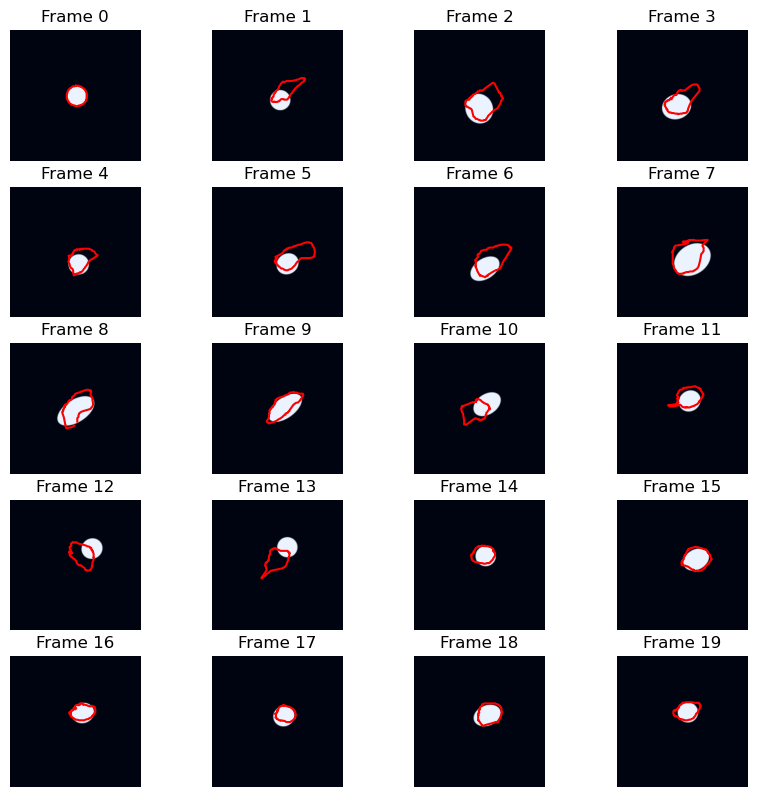

Epoch 535, IOU: 0.546084
Epoch 536, Loss: 17.50
Epoch 537, Loss: 15.37
Epoch 538, Loss: 14.43
Epoch 539, Loss: 12.06
Epoch 540, Loss: 14.76


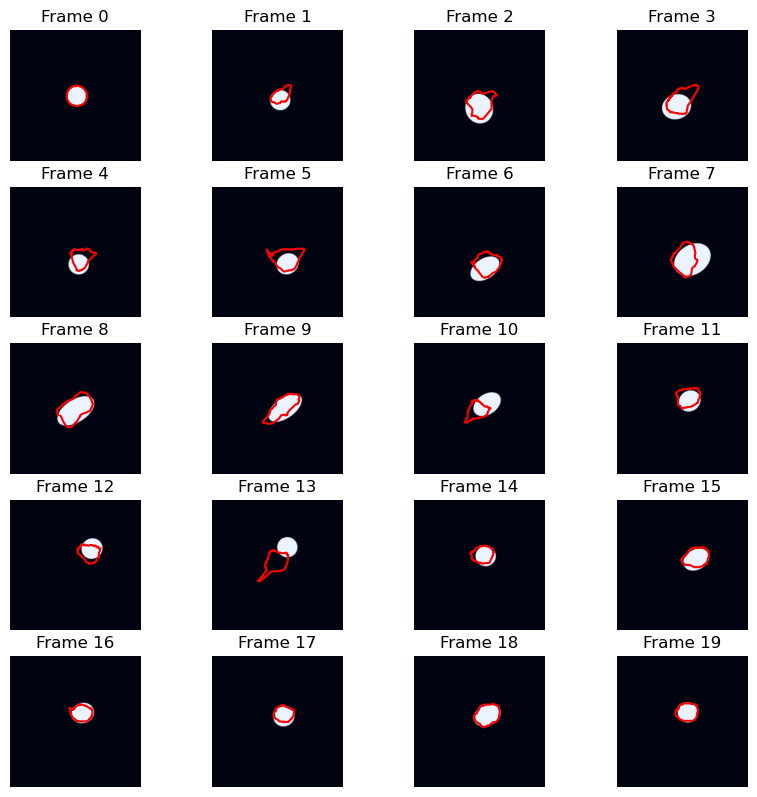

Epoch 540, IOU: 0.600132
Epoch 541, Loss: 16.96
Epoch 542, Loss: 18.96
Epoch 543, Loss: 37.15
Epoch 544, Loss: 16.18
Epoch 545, Loss: 22.44


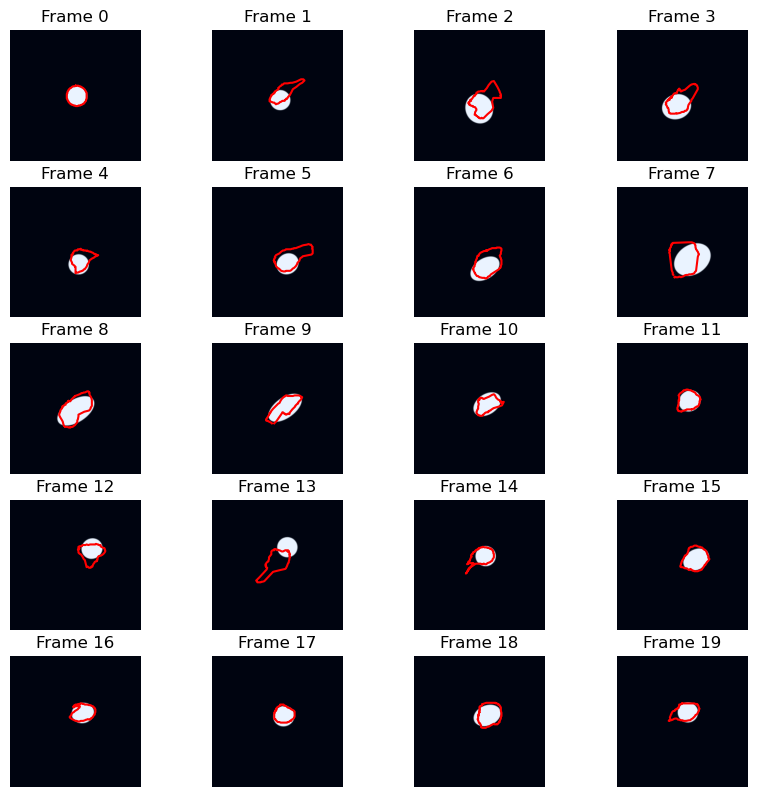

Epoch 545, IOU: 0.609427
Epoch 546, Loss: 13.60
Epoch 547, Loss: 14.24
Epoch 548, Loss: 12.95
Epoch 549, Loss: 13.81
Epoch 550, Loss: 18.26


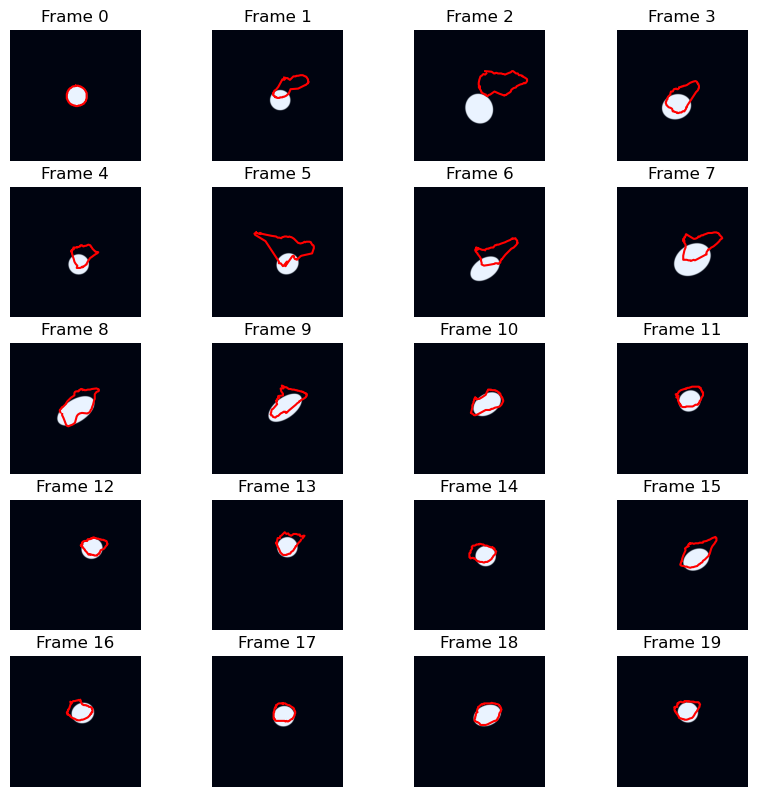

Epoch 550, IOU: 0.469549
Epoch 551, Loss: 14.96
Epoch 552, Loss: 33.47
Epoch 553, Loss: 28.32
Epoch 554, Loss: 13.96
Epoch 555, Loss: 16.56


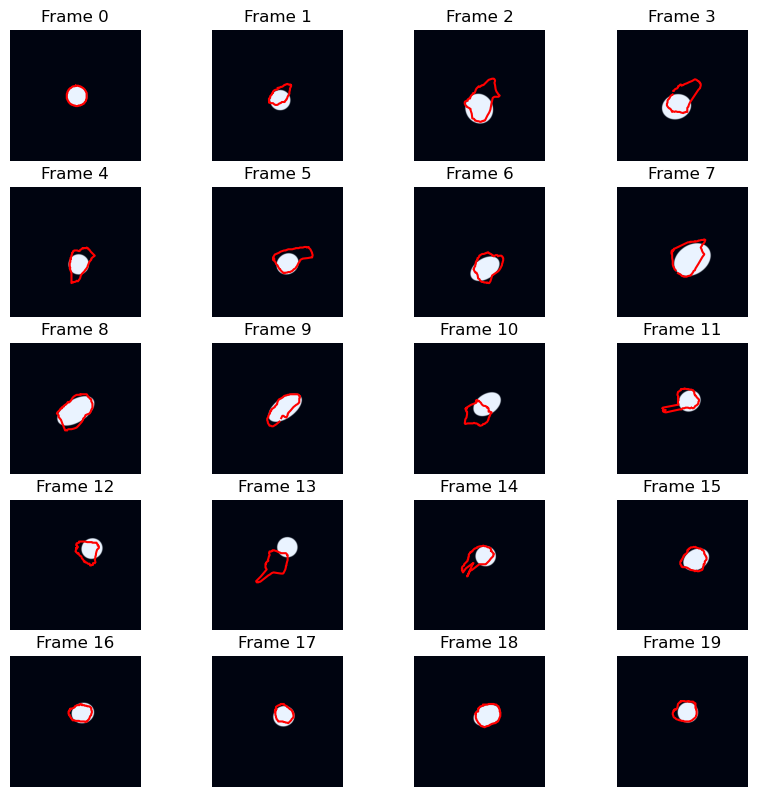

Epoch 555, IOU: 0.596206
Epoch 556, Loss: 14.11
Epoch 557, Loss: 12.09
Epoch 558, Loss: 12.17
Epoch 559, Loss: 12.78
Epoch 560, Loss: 15.94


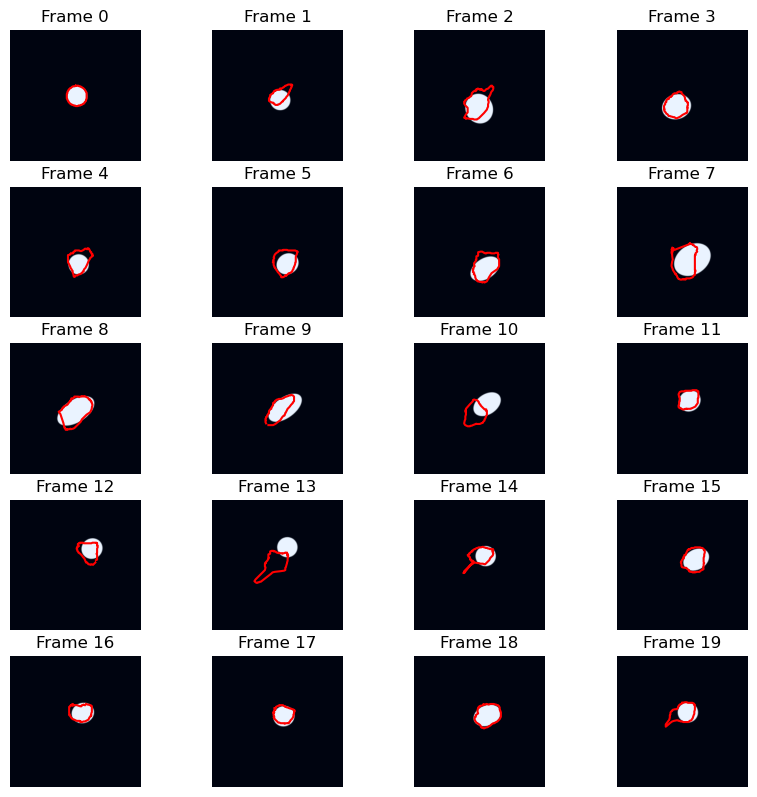

Epoch 560, IOU: 0.620312
Epoch 561, Loss: 13.41
Epoch 562, Loss: 12.90
Epoch 563, Loss: 13.41
Epoch 564, Loss: 12.13
Epoch 565, Loss: 10.76


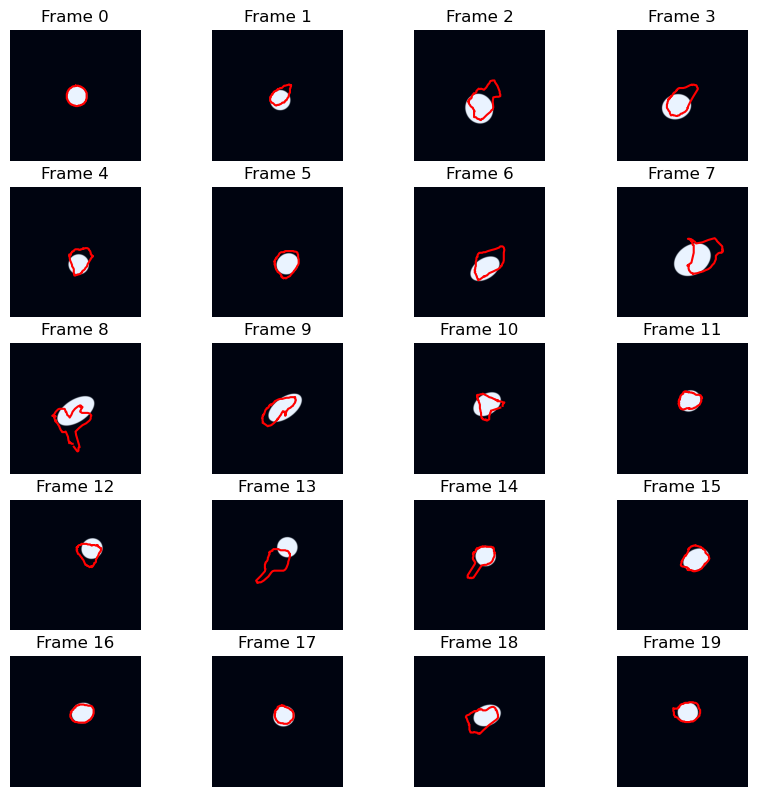

Epoch 565, IOU: 0.590697
Epoch 566, Loss: 11.19
Epoch 567, Loss: 12.56
Epoch 568, Loss: 12.02
Epoch 569, Loss: 11.74
Epoch 570, Loss: 15.64


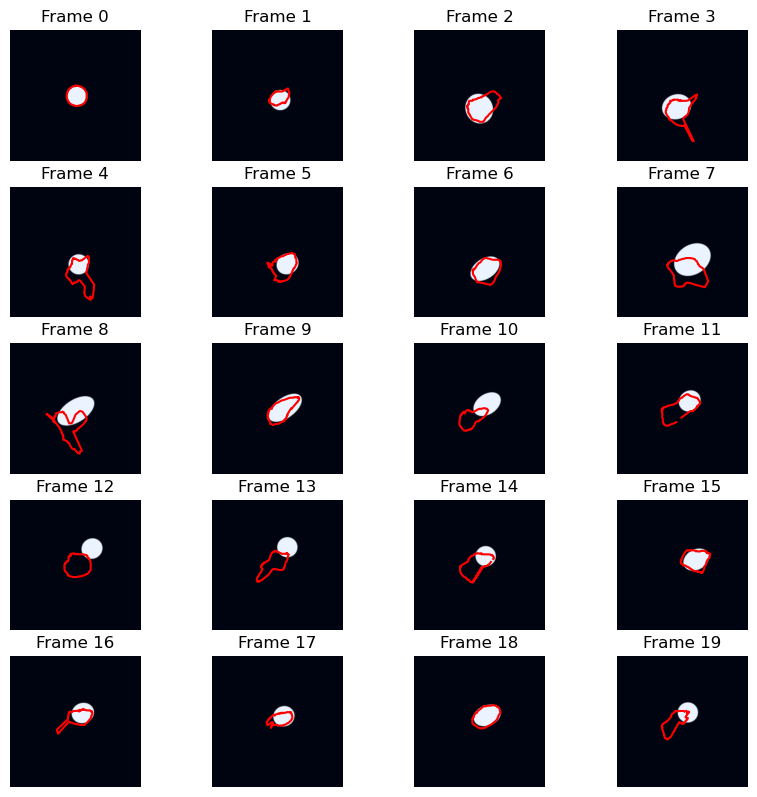

Epoch 570, IOU: 0.459201
Epoch 571, Loss: 23.07
Epoch 572, Loss: 15.44
Epoch 573, Loss: 26.31
Epoch 574, Loss: 13.65
Epoch 575, Loss: 22.25


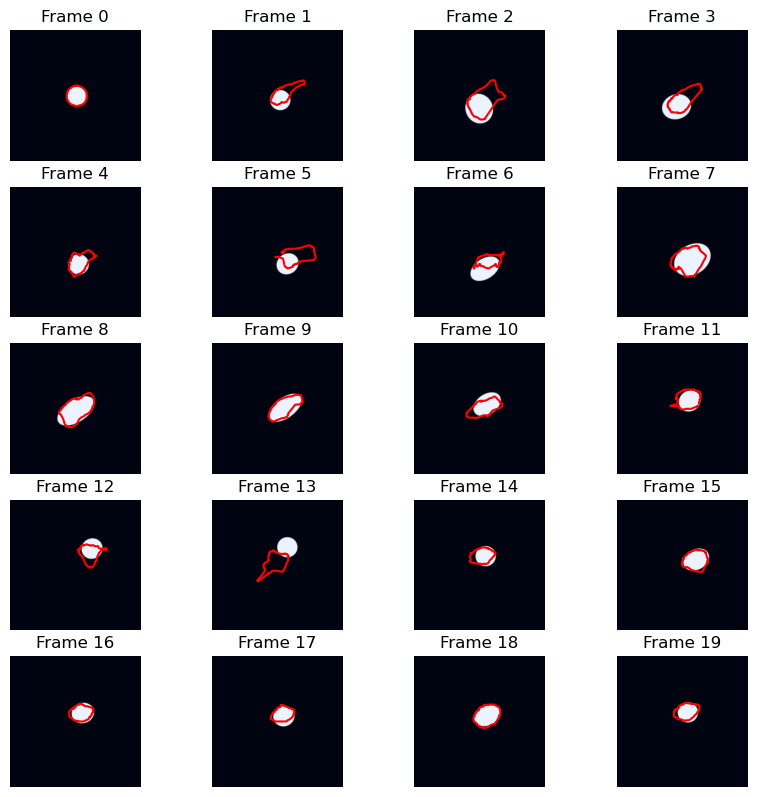

Epoch 575, IOU: 0.617792
Epoch 576, Loss: 10.19
Epoch 577, Loss: 11.49
Epoch 578, Loss: 14.20
Epoch 579, Loss: 13.41
Epoch 580, Loss: 13.16


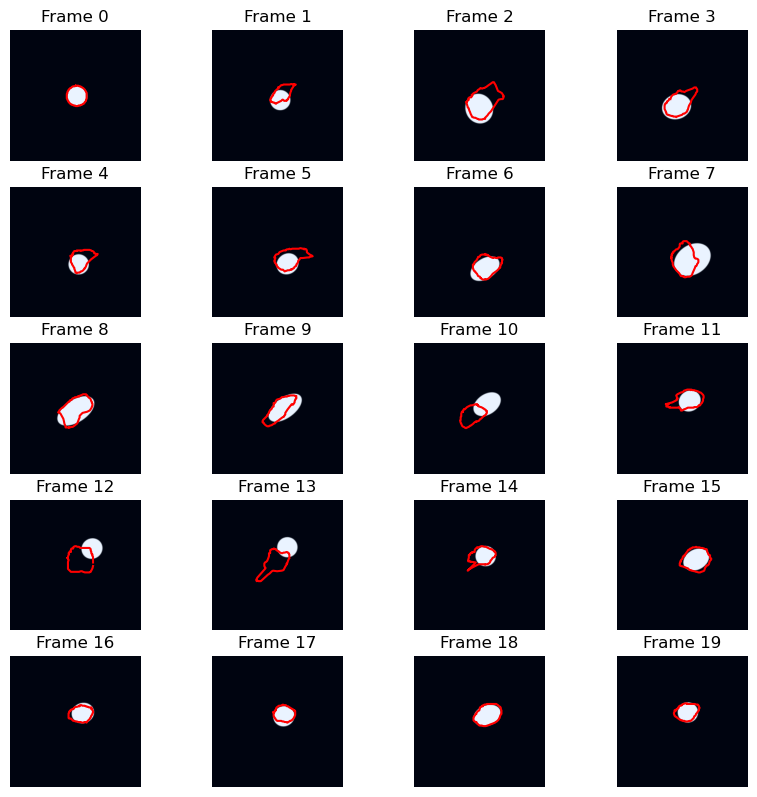

Epoch 580, IOU: 0.576551
Epoch 581, Loss: 12.62
Epoch 582, Loss: 14.40
Epoch 583, Loss: 12.68
Epoch 584, Loss: 11.47
Epoch 585, Loss: 17.73


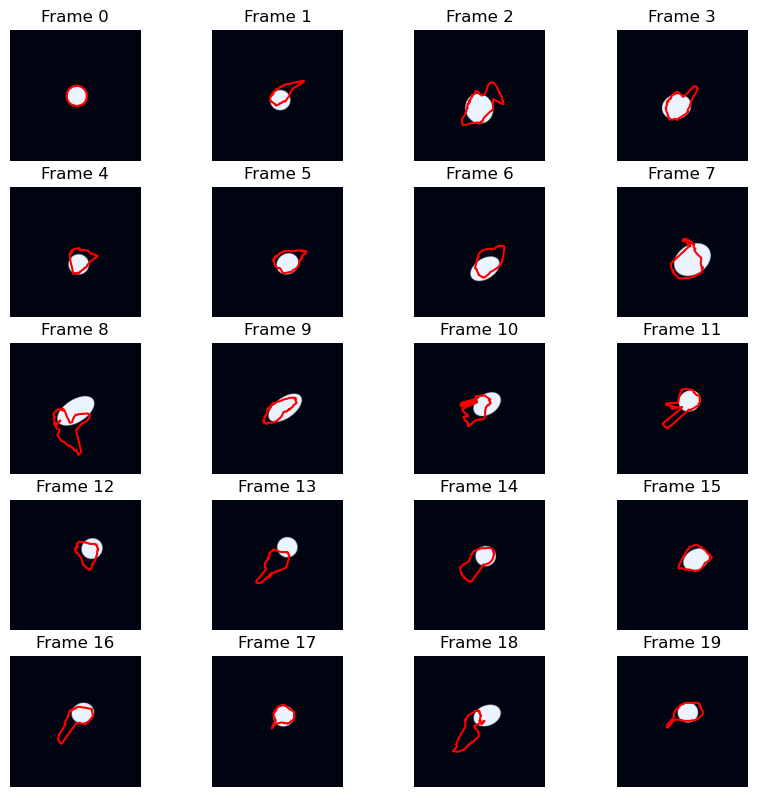

Epoch 585, IOU: 0.506423
Epoch 586, Loss: 12.82
Epoch 587, Loss: 13.10
Epoch 588, Loss: 17.33
Epoch 589, Loss: 15.72
Epoch 590, Loss: 15.46


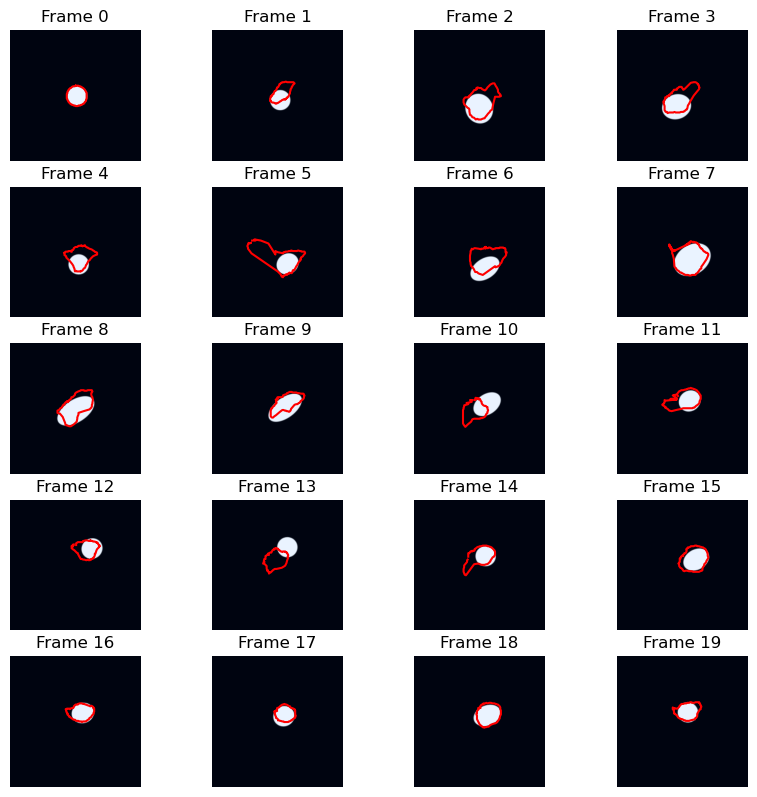

Epoch 590, IOU: 0.551700
Epoch 591, Loss: 17.65
Epoch 592, Loss: 12.16
Epoch 593, Loss: 13.60
Epoch 594, Loss: 13.69
Epoch 595, Loss: 12.19


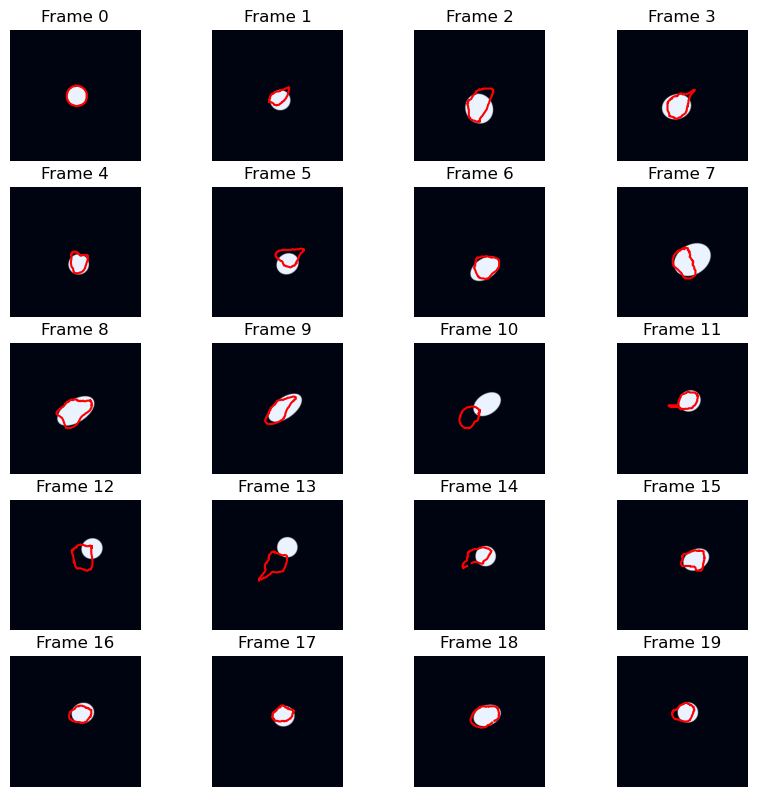

Epoch 595, IOU: 0.556081
Epoch 596, Loss: 12.02
Epoch 597, Loss: 12.10
Epoch 598, Loss: 14.17
Epoch 599, Loss: 12.54
Epoch 600, Loss: 14.55


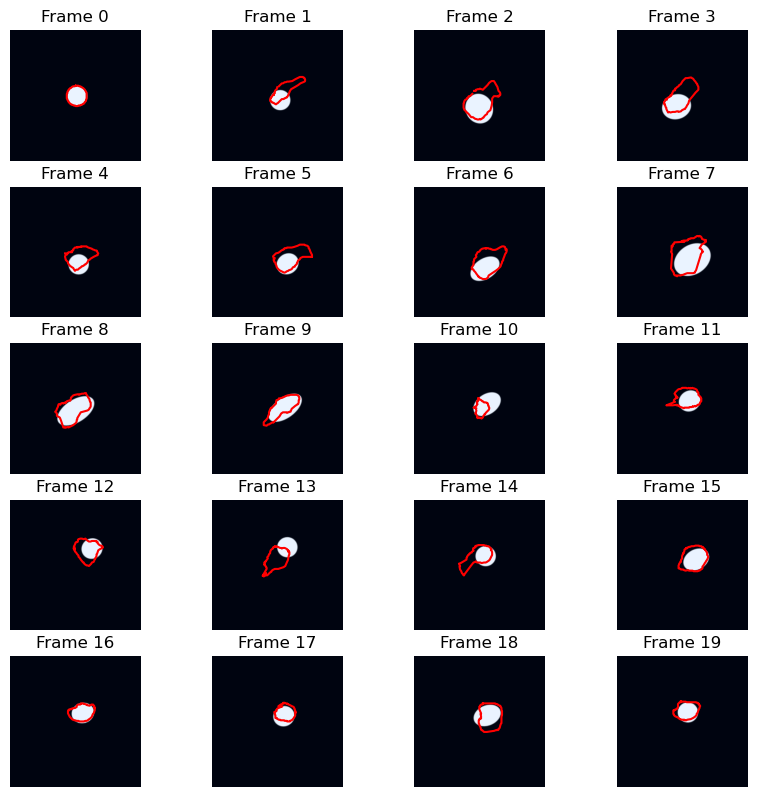

Epoch 600, IOU: 0.537241
Epoch 601, Loss: 13.31
Epoch 602, Loss: 11.62
Epoch 603, Loss: 9.98
Epoch 604, Loss: 10.90
Epoch 605, Loss: 12.04


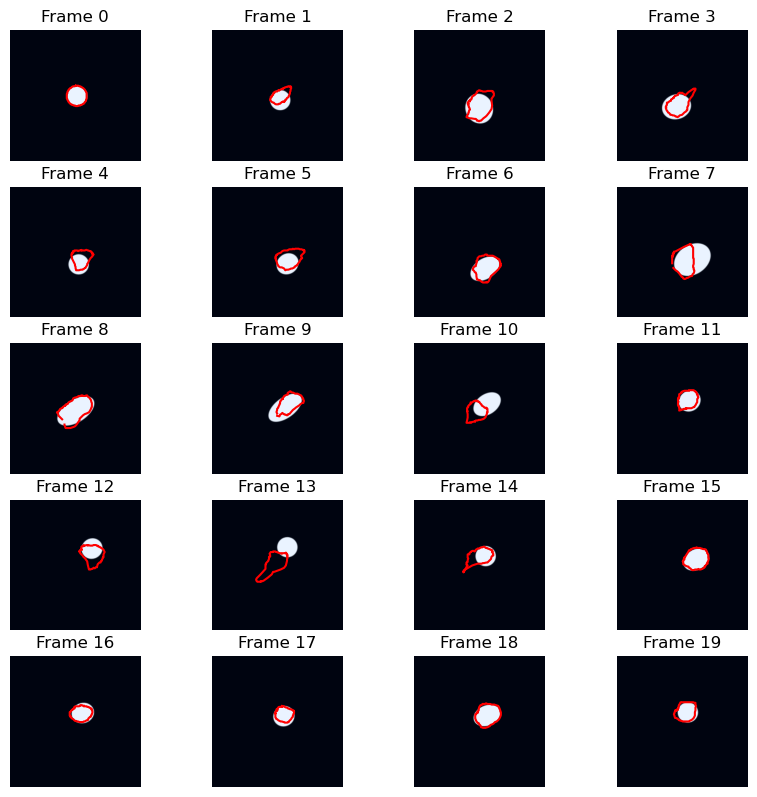

Epoch 605, IOU: 0.610832
Epoch 606, Loss: 10.80
Epoch 607, Loss: 13.27
Epoch 608, Loss: 17.76
Epoch 609, Loss: 14.53
Epoch 610, Loss: 19.25


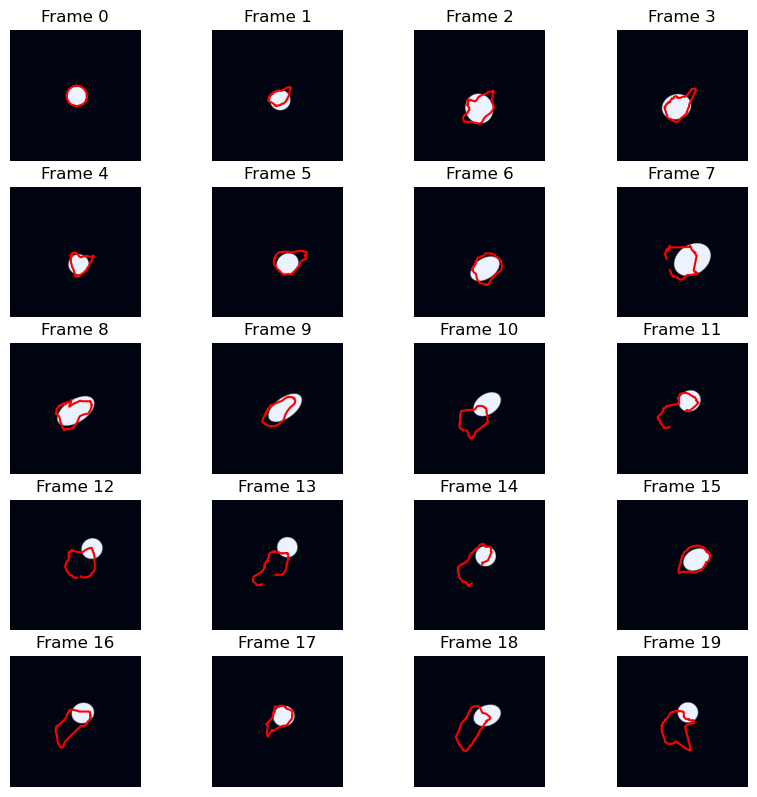

Epoch 610, IOU: 0.468411
Epoch 611, Loss: 39.55
Epoch 612, Loss: 21.49
Epoch 613, Loss: 16.17
Epoch 614, Loss: 28.10
Epoch 615, Loss: 20.47


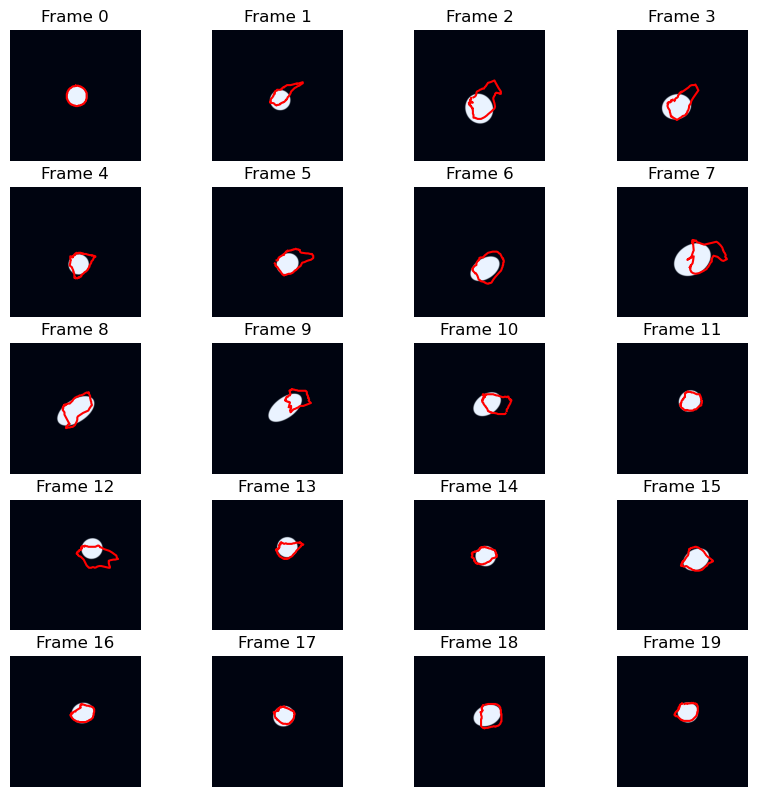

Epoch 615, IOU: 0.608804
Epoch 616, Loss: 15.89
Epoch 617, Loss: 15.25
Epoch 618, Loss: 14.68
Epoch 619, Loss: 13.98
Epoch 620, Loss: 13.46


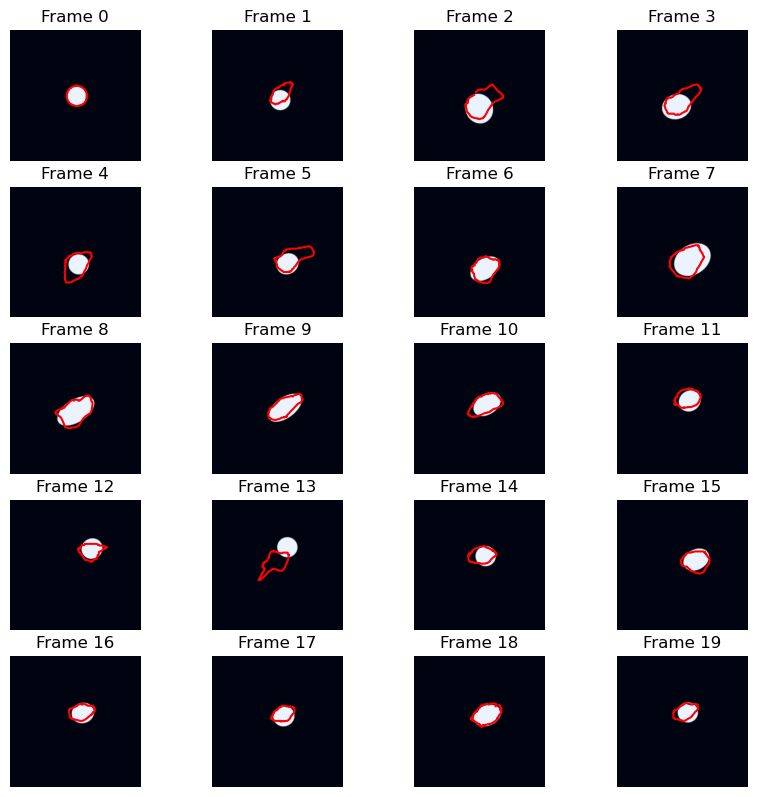

Epoch 620, IOU: 0.643928
Epoch 621, Loss: 15.20
Epoch 622, Loss: 12.15
Epoch 623, Loss: 15.95
Epoch 624, Loss: 13.35
Epoch 625, Loss: 13.78


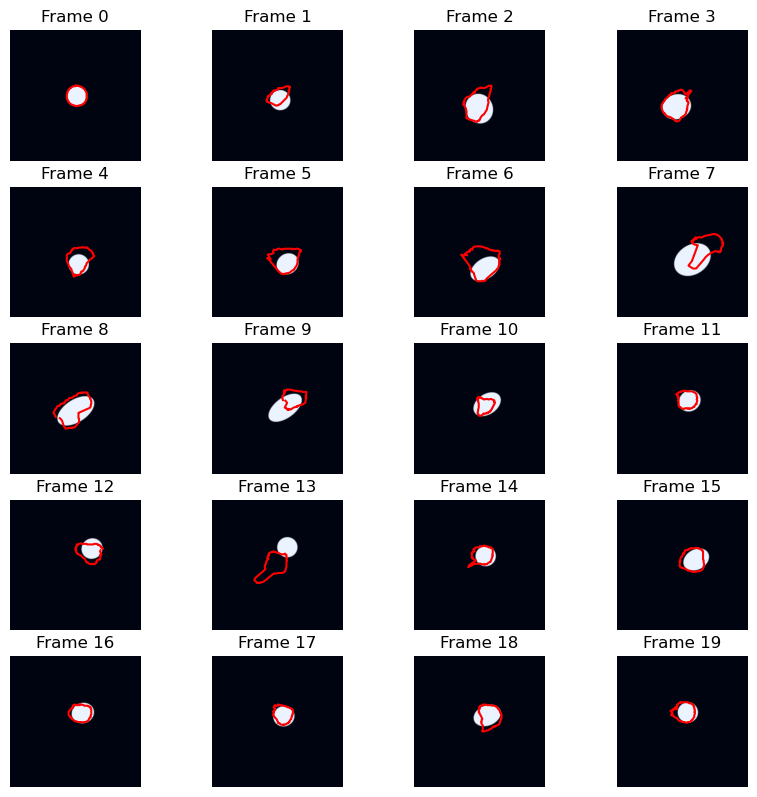

Epoch 625, IOU: 0.580553
Epoch 626, Loss: 15.16
Epoch 627, Loss: 14.63
Epoch 628, Loss: 13.87
Epoch 629, Loss: 11.94
Epoch 630, Loss: 11.55


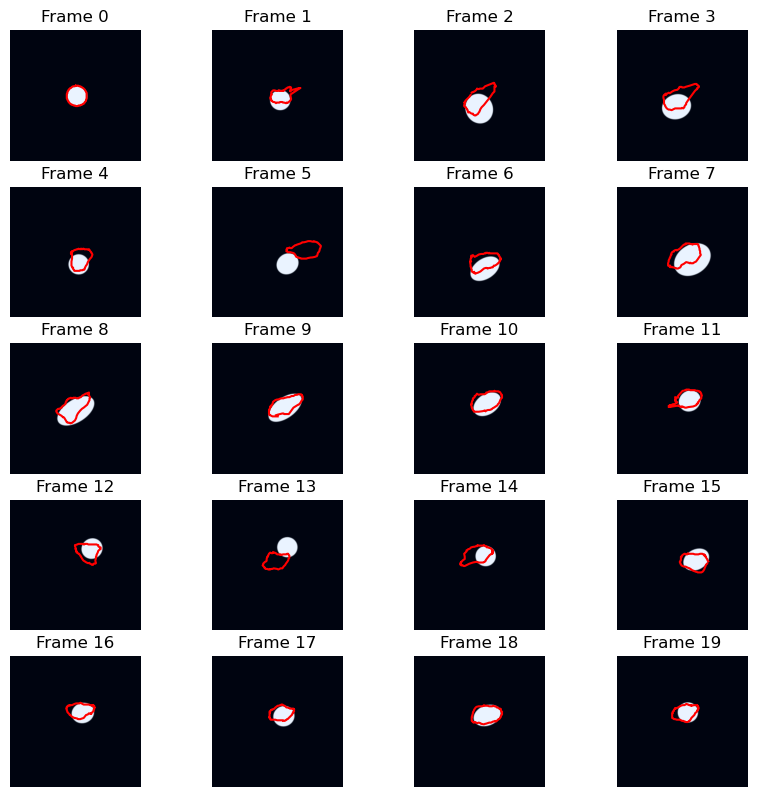

Epoch 630, IOU: 0.511351
Epoch 631, Loss: 12.26
Epoch 632, Loss: 14.74
Epoch 633, Loss: 11.69
Epoch 634, Loss: 11.06
Epoch 635, Loss: 10.98


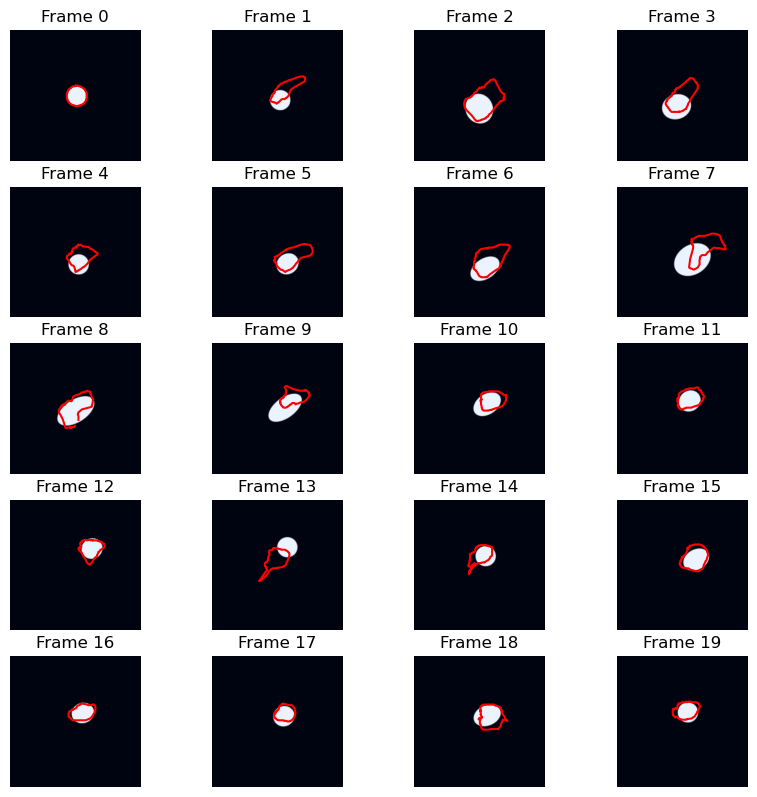

Epoch 635, IOU: 0.519569
Epoch 636, Loss: 10.83
Epoch 637, Loss: 11.28
Epoch 638, Loss: 12.31
Epoch 639, Loss: 11.65
Epoch 640, Loss: 14.49


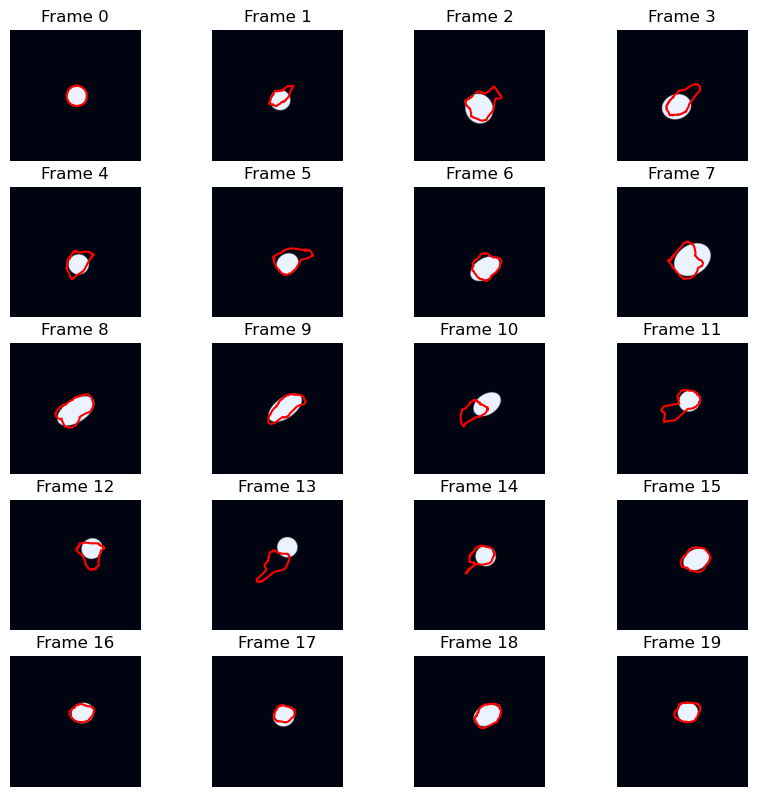

Epoch 640, IOU: 0.632260
Epoch 641, Loss: 13.16
Epoch 642, Loss: 12.38
Epoch 643, Loss: 14.47
Epoch 644, Loss: 13.87
Epoch 645, Loss: 15.26


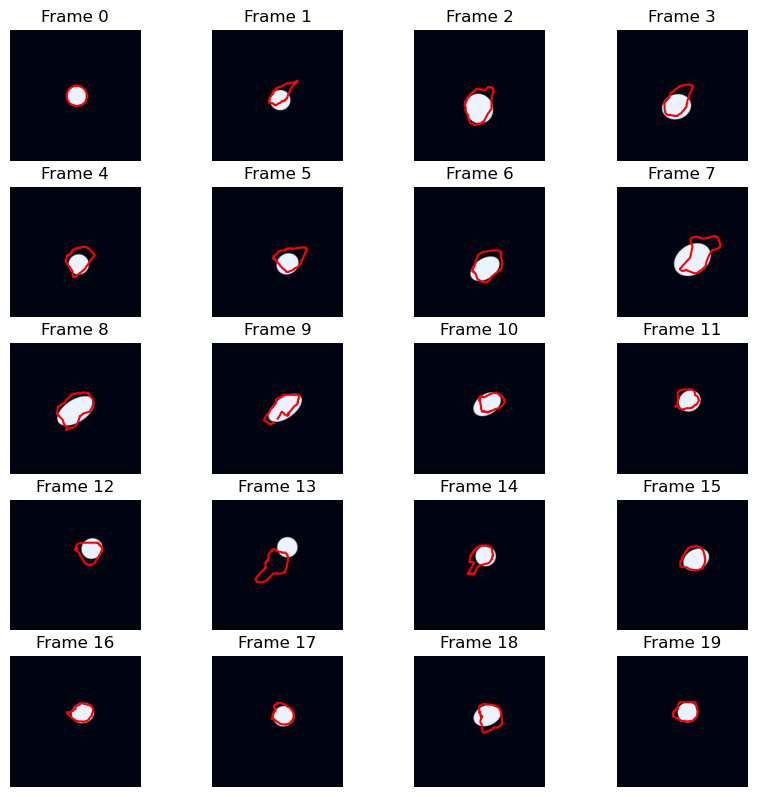

Epoch 645, IOU: 0.616961
Epoch 646, Loss: 15.77
Epoch 647, Loss: 15.34
Epoch 648, Loss: 15.73
Epoch 649, Loss: 16.81
Epoch 650, Loss: 17.80


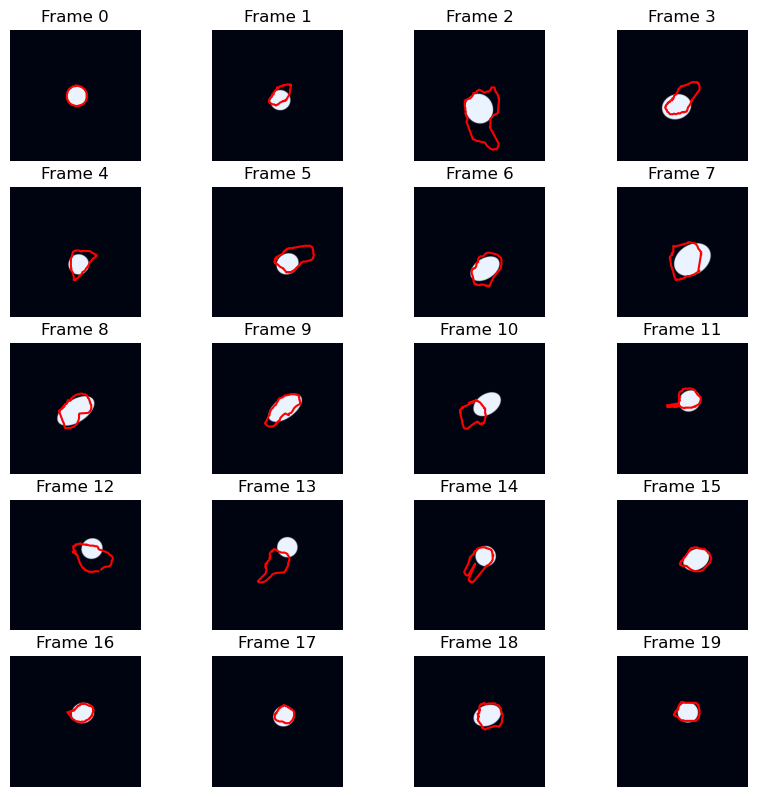

Epoch 650, IOU: 0.574012
Epoch 651, Loss: 21.51
Epoch 652, Loss: 20.82
Epoch 653, Loss: 15.27
Epoch 654, Loss: 29.17
Epoch 655, Loss: 19.18


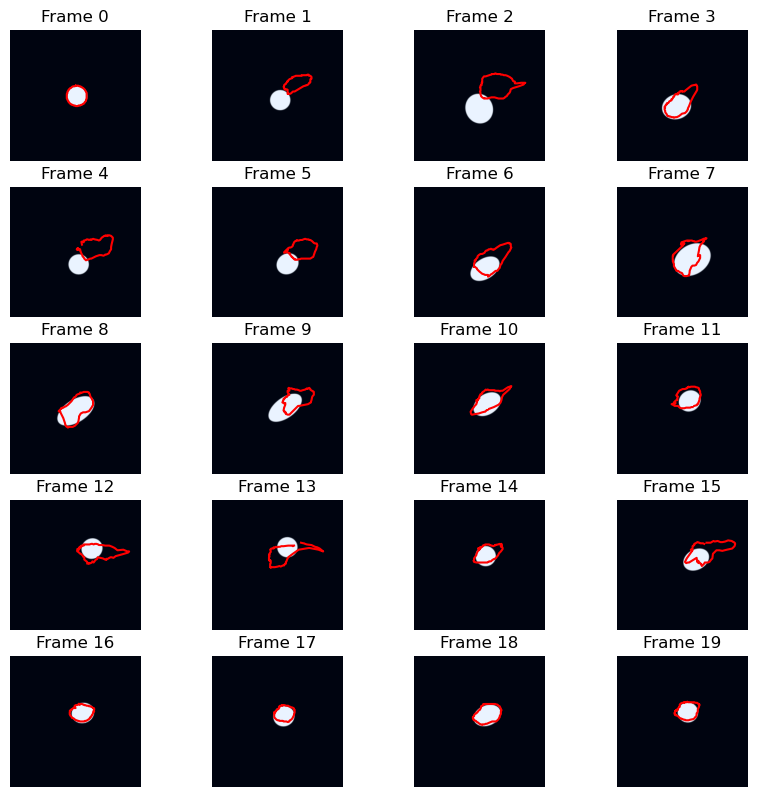

Epoch 655, IOU: 0.473839
Epoch 656, Loss: 13.95
Epoch 657, Loss: 12.82
Epoch 658, Loss: 12.63
Epoch 659, Loss: 12.24
Epoch 660, Loss: 12.28


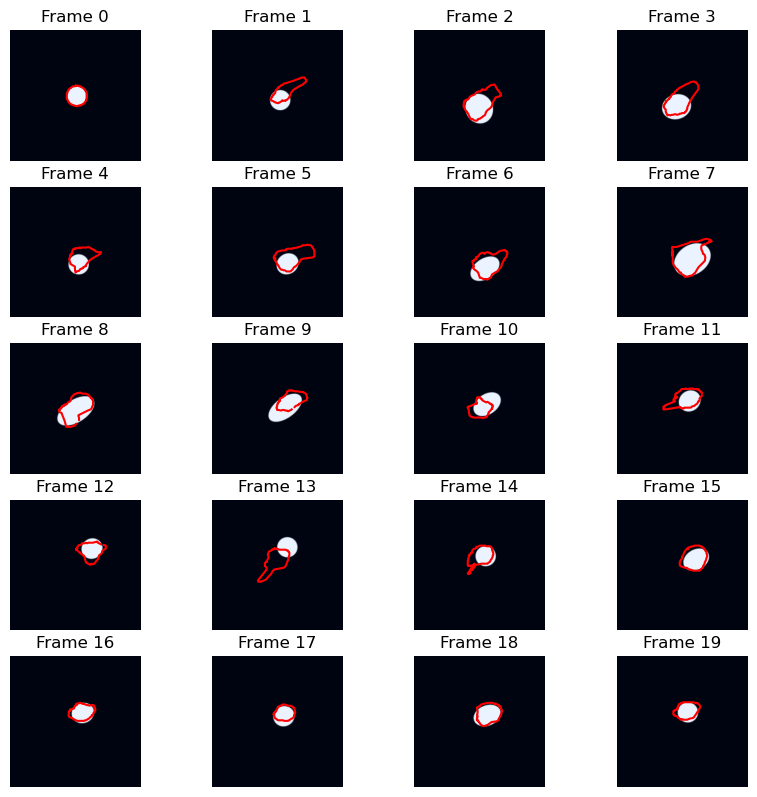

Epoch 660, IOU: 0.567062
Epoch 661, Loss: 13.67
Epoch 662, Loss: 20.16
Epoch 663, Loss: 16.27
Epoch 664, Loss: 16.89
Epoch 665, Loss: 12.84


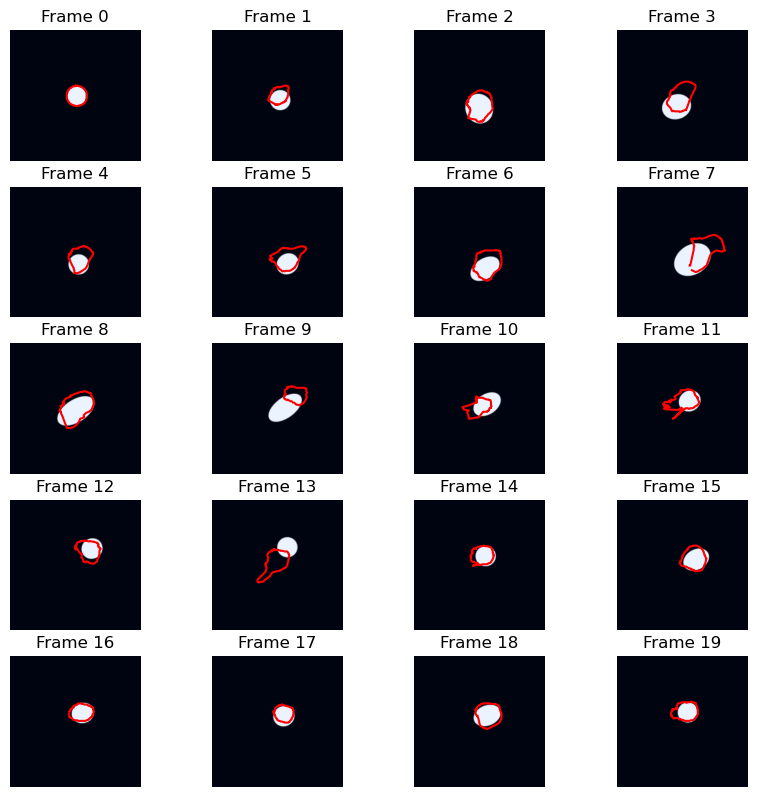

Epoch 665, IOU: 0.561341
Epoch 666, Loss: 13.02
Epoch 667, Loss: 12.75
Epoch 668, Loss: 13.21
Epoch 669, Loss: 12.84
Epoch 670, Loss: 11.82


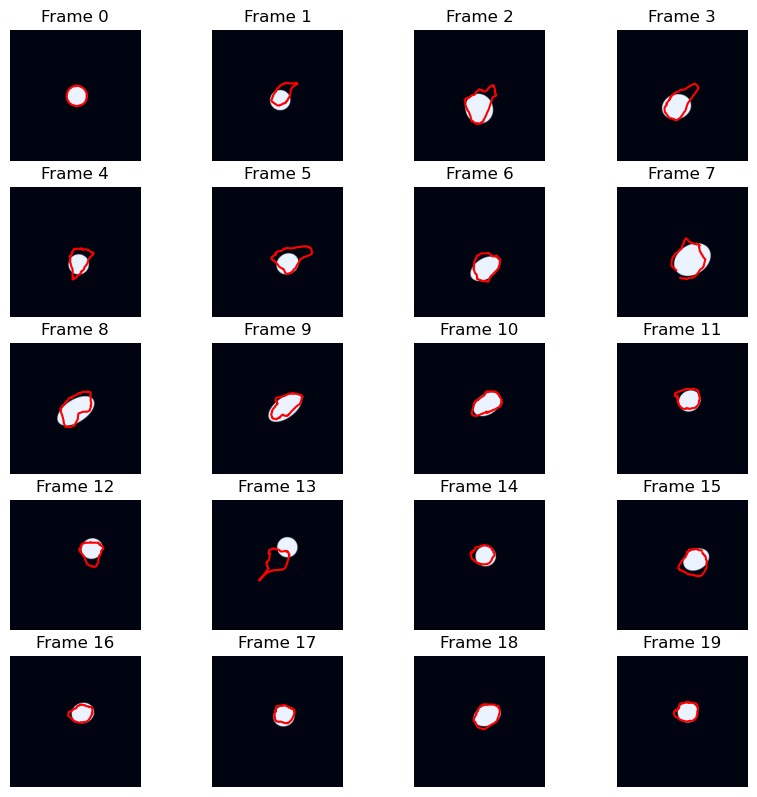

Epoch 670, IOU: 0.667142
Epoch 671, Loss: 13.59
Epoch 672, Loss: 11.50
Epoch 673, Loss: 13.53
Epoch 674, Loss: 12.50
Epoch 675, Loss: 13.10


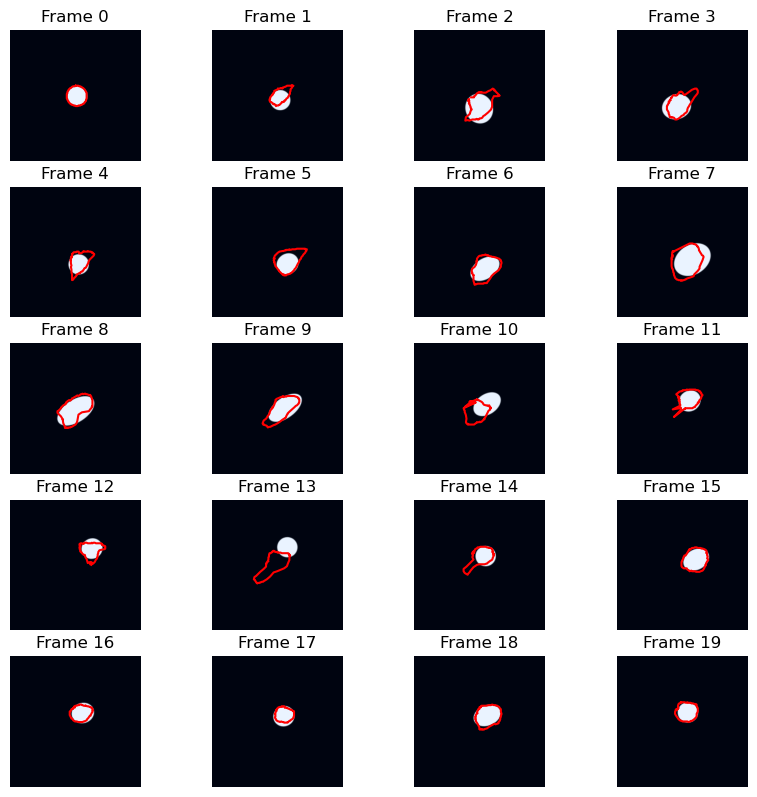

Epoch 675, IOU: 0.650712
Epoch 676, Loss: 12.50
Epoch 677, Loss: 14.77
Epoch 678, Loss: 13.12
Epoch 679, Loss: 12.37
Epoch 680, Loss: 11.36


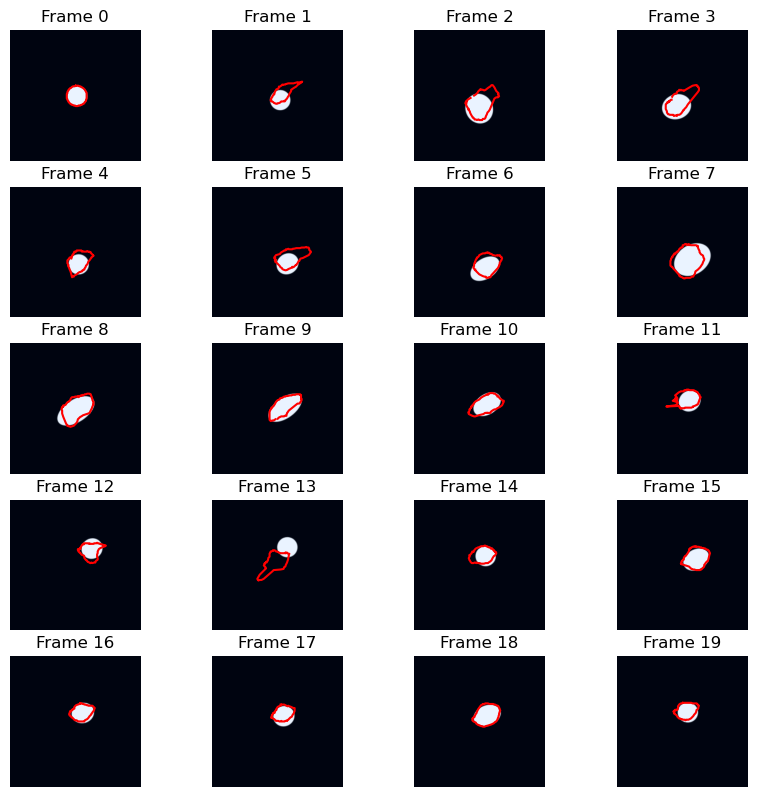

Epoch 680, IOU: 0.643515
Epoch 681, Loss: 12.22
Epoch 682, Loss: 12.48
Epoch 683, Loss: 11.46
Epoch 684, Loss: 10.71
Epoch 685, Loss: 21.70


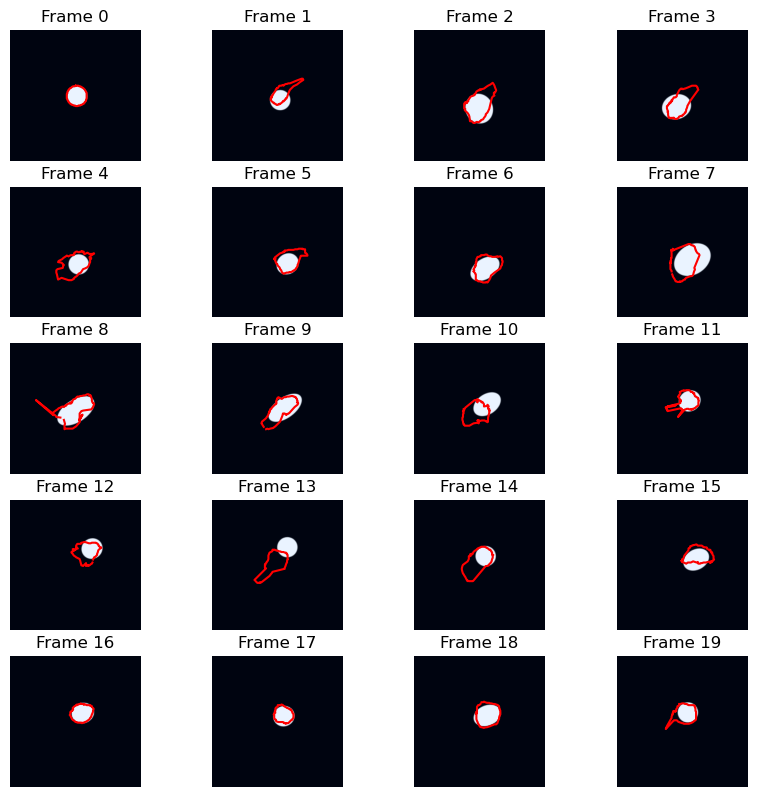

Epoch 685, IOU: 0.576307
Epoch 686, Loss: 16.60
Epoch 687, Loss: 12.45
Epoch 688, Loss: 12.07
Epoch 689, Loss: 11.17
Epoch 690, Loss: 13.28


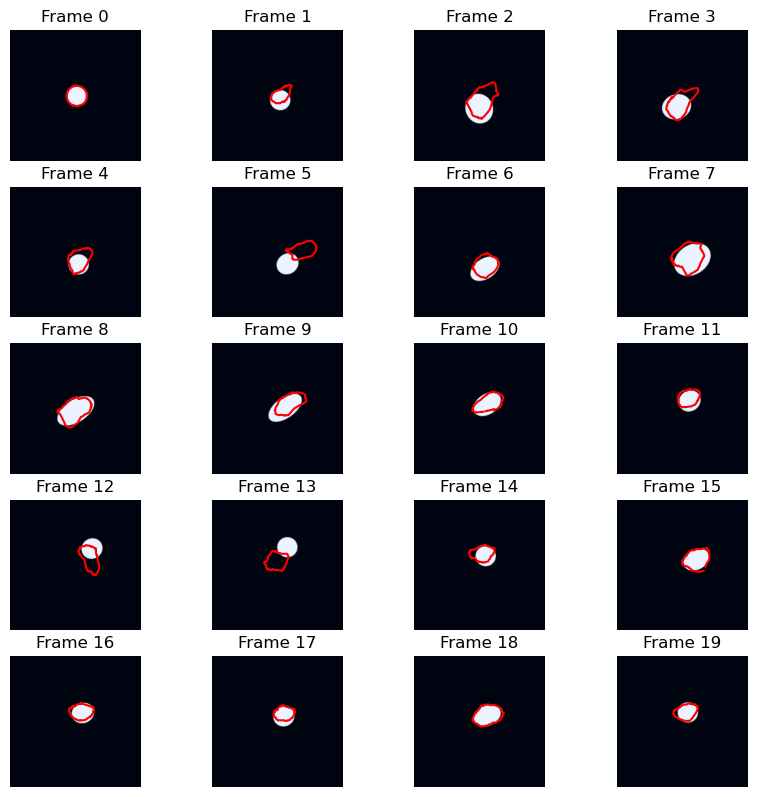

Epoch 690, IOU: 0.599227
Epoch 691, Loss: 13.76
Epoch 692, Loss: 39.21
Epoch 693, Loss: 18.43
Epoch 694, Loss: 15.15
Epoch 695, Loss: 15.58


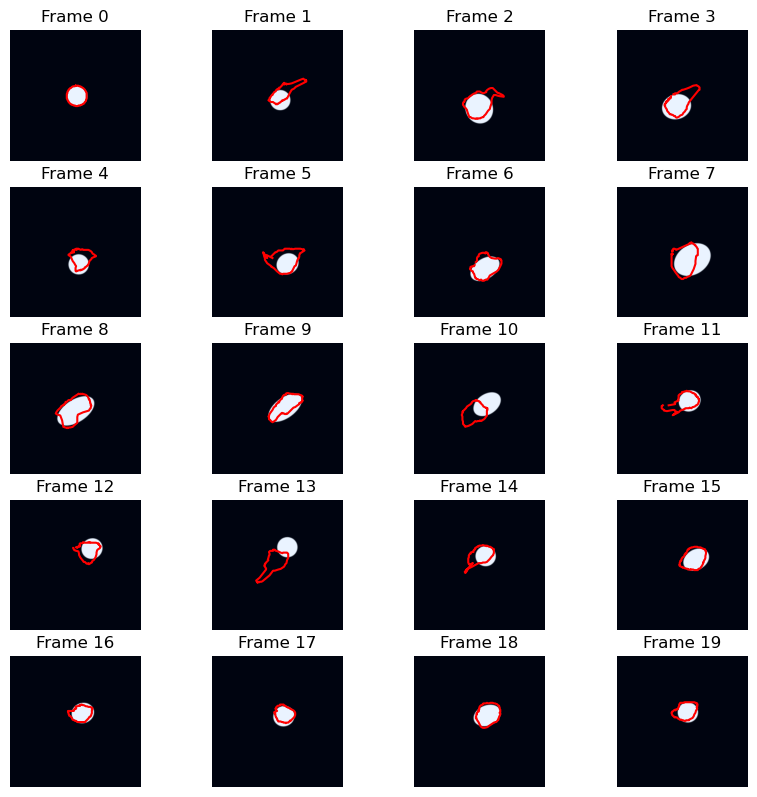

Epoch 695, IOU: 0.583420
Epoch 696, Loss: 13.29
Epoch 697, Loss: 10.88
Epoch 698, Loss: 12.27
Epoch 699, Loss: 9.99
Epoch 700, Loss: 11.60


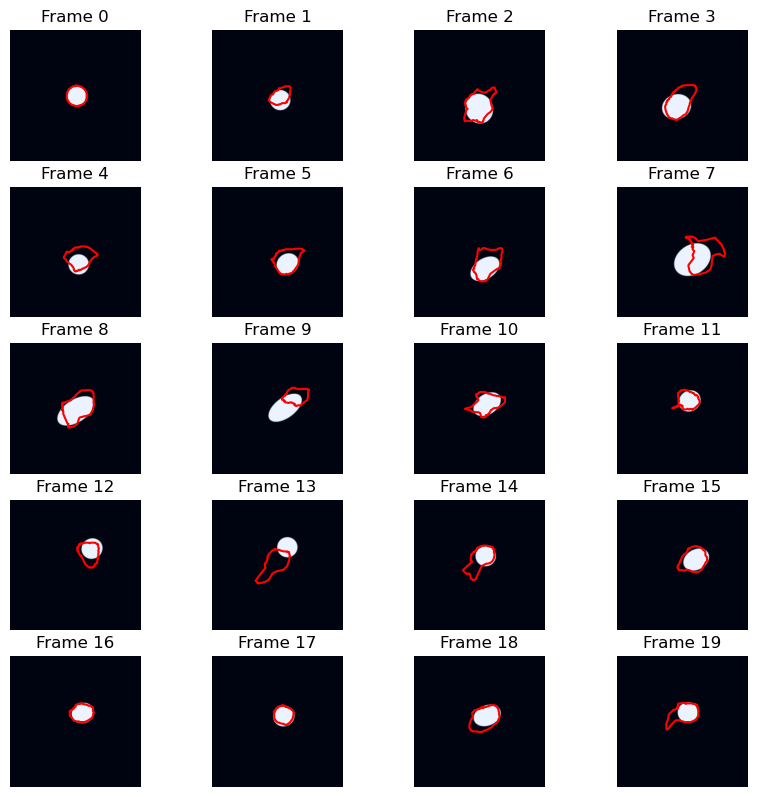

Epoch 700, IOU: 0.601102
Epoch 701, Loss: 11.28
Epoch 702, Loss: 10.13
Epoch 703, Loss: 9.97
Epoch 704, Loss: 13.03
Epoch 705, Loss: 11.71


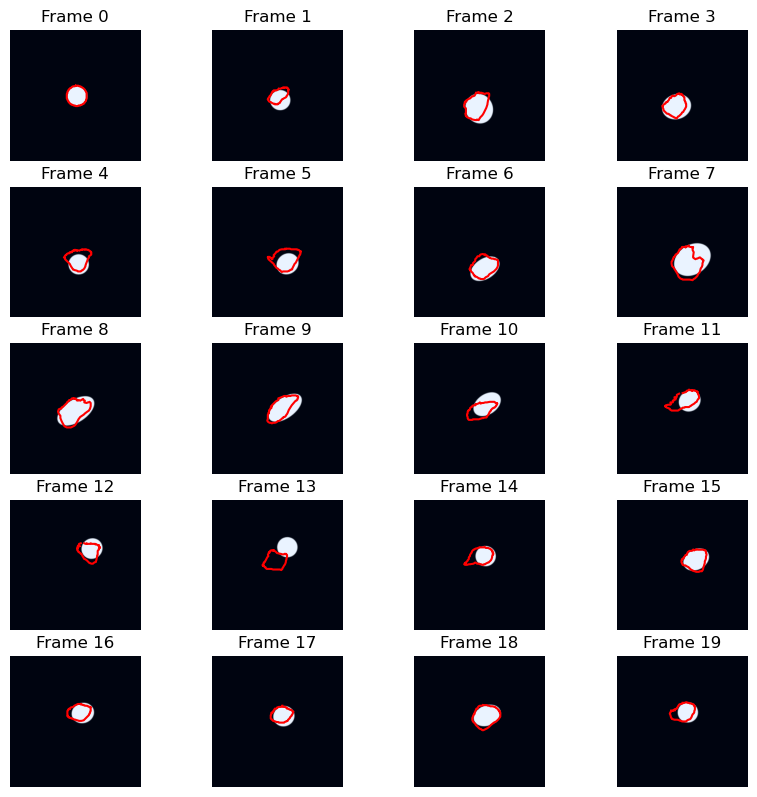

Epoch 705, IOU: 0.608316
Epoch 706, Loss: 11.36
Epoch 707, Loss: 11.43
Epoch 708, Loss: 12.07
Epoch 709, Loss: 10.55
Epoch 710, Loss: 10.56


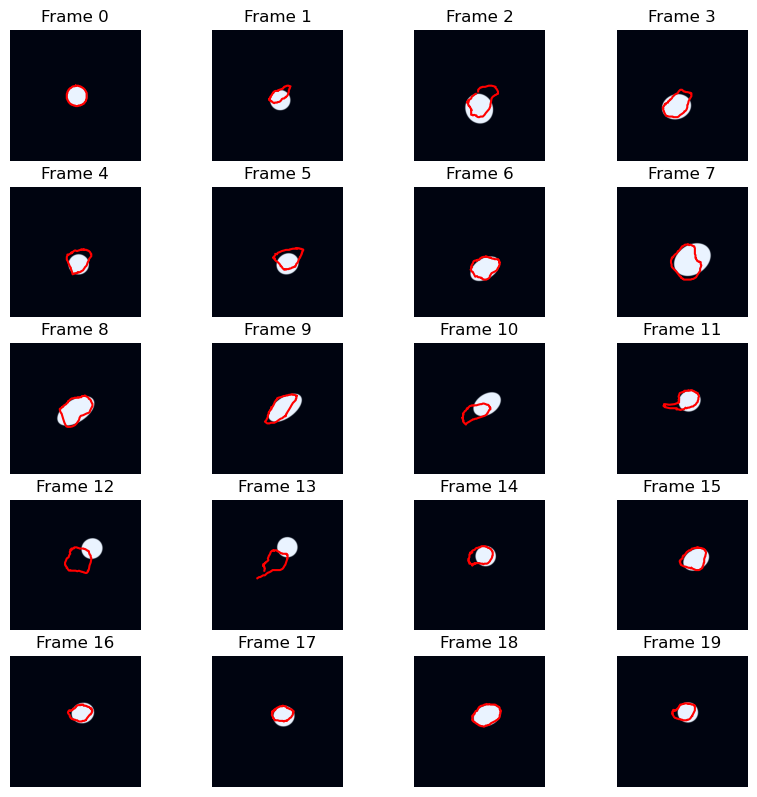

Epoch 710, IOU: 0.583365
Epoch 711, Loss: 10.97
Epoch 712, Loss: 11.68
Epoch 713, Loss: 11.86
Epoch 714, Loss: 11.68
Epoch 715, Loss: 13.52


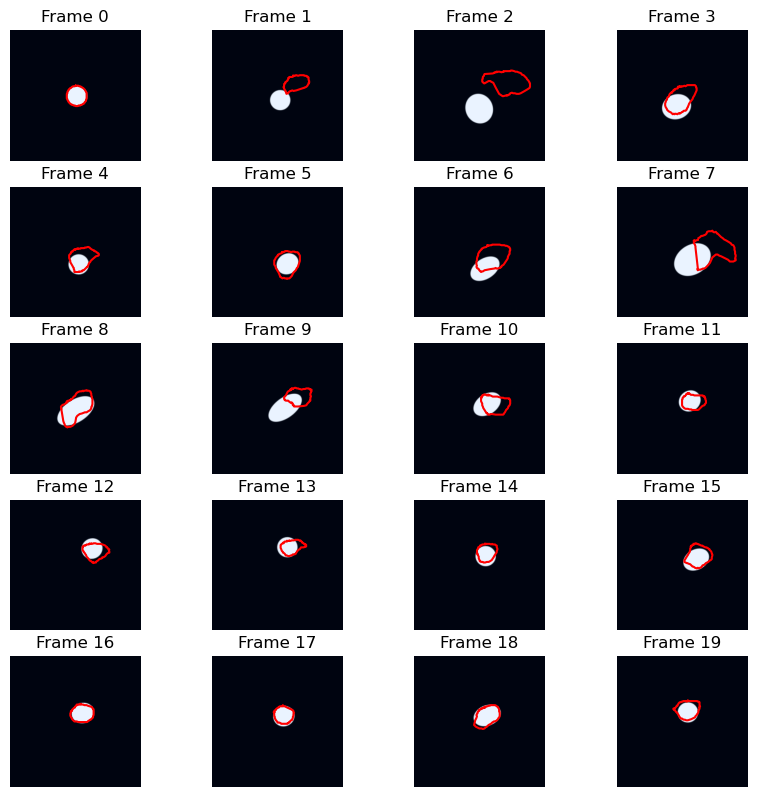

Epoch 715, IOU: 0.512886
Epoch 716, Loss: 21.65
Epoch 717, Loss: 12.58
Epoch 718, Loss: 12.60
Epoch 719, Loss: 16.02
Epoch 720, Loss: 11.52


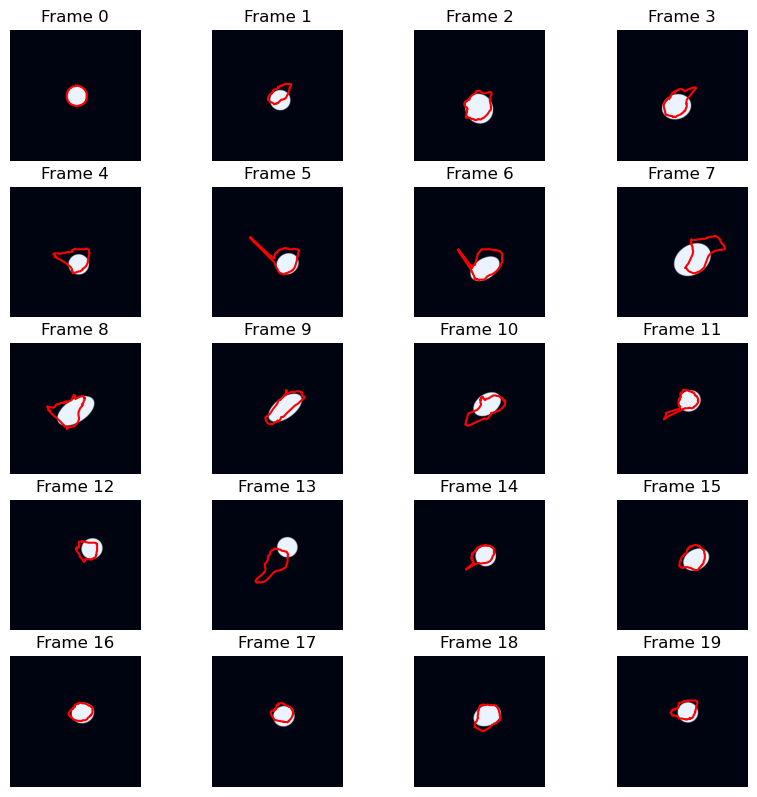

Epoch 720, IOU: 0.586132
Epoch 721, Loss: 12.13
Epoch 722, Loss: 12.26
Epoch 723, Loss: 10.55
Epoch 724, Loss: 10.14
Epoch 725, Loss: 11.51


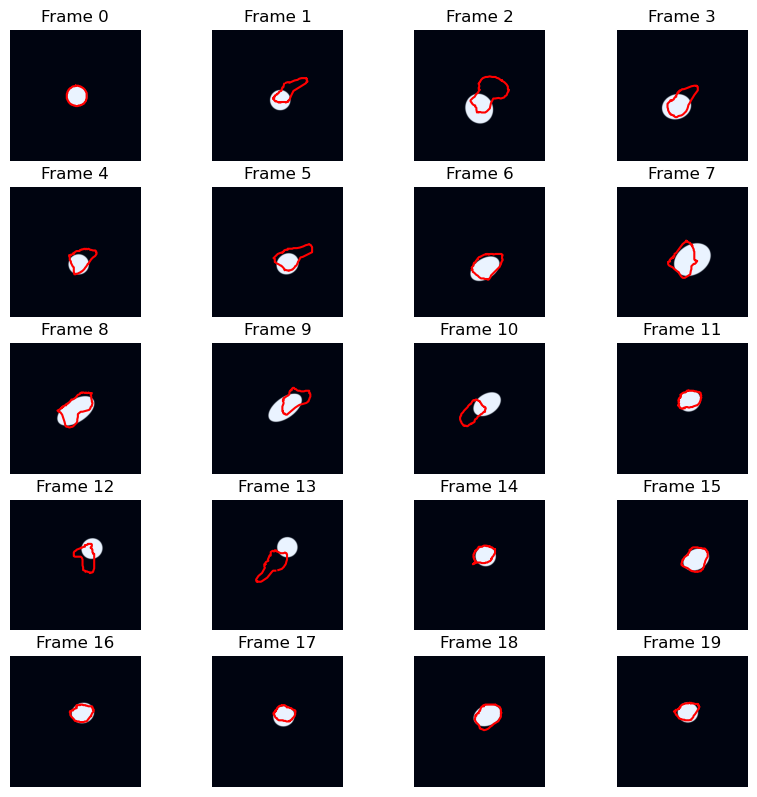

Epoch 725, IOU: 0.544241
Epoch 726, Loss: 11.56
Epoch 727, Loss: 13.06
Epoch 728, Loss: 11.44
Epoch 729, Loss: 12.13
Epoch 730, Loss: 12.64


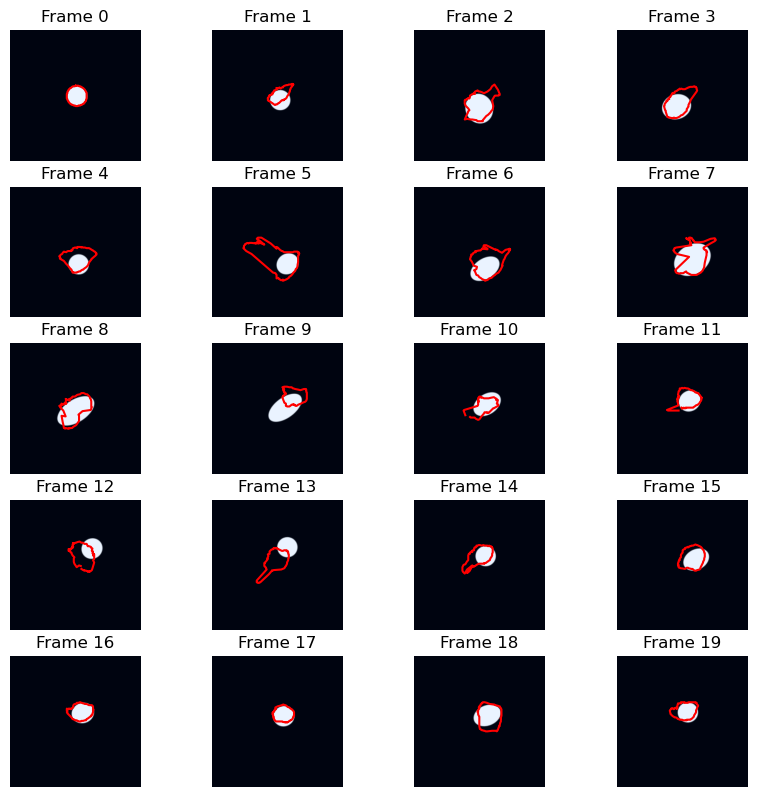

Epoch 730, IOU: 0.538601
Epoch 731, Loss: 11.60
Epoch 732, Loss: 11.89
Epoch 733, Loss: 13.55
Epoch 734, Loss: 13.71
Epoch 735, Loss: 13.53


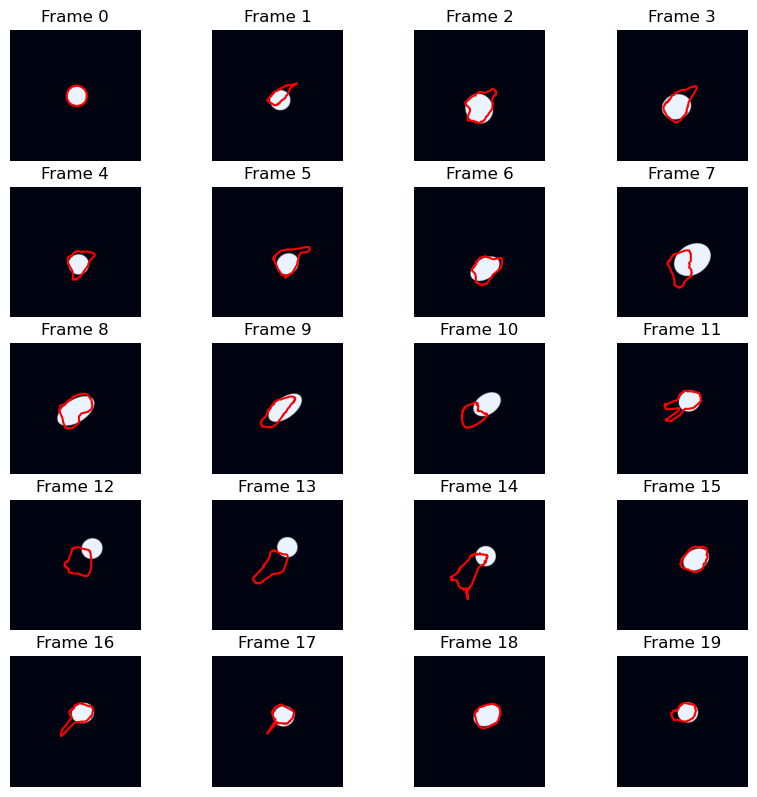

Epoch 735, IOU: 0.556494
Epoch 736, Loss: 13.60
Epoch 737, Loss: 12.91
Epoch 738, Loss: 12.37
Epoch 739, Loss: 12.36
Epoch 740, Loss: 12.63


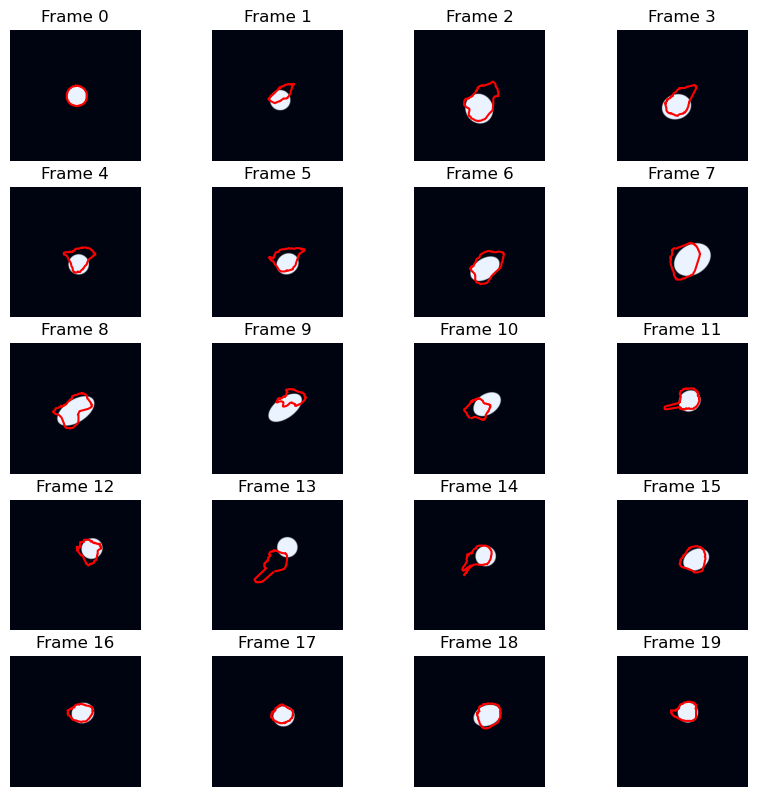

Epoch 740, IOU: 0.576678
Epoch 741, Loss: 10.71
Epoch 742, Loss: 10.50
Epoch 743, Loss: 10.74
Epoch 744, Loss: 17.86
Epoch 745, Loss: 14.67


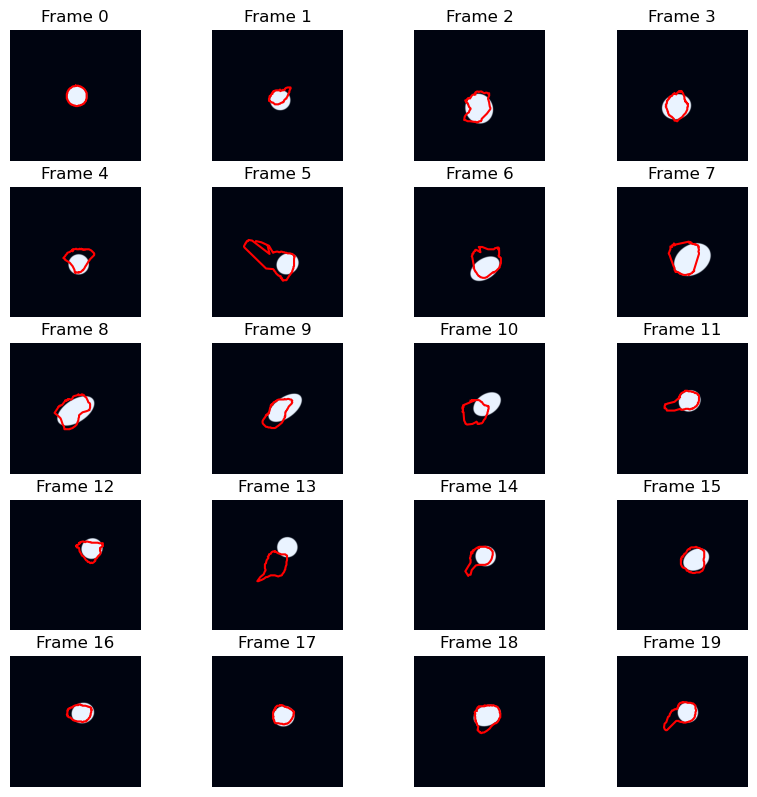

Epoch 745, IOU: 0.579532
Epoch 746, Loss: 11.91
Epoch 747, Loss: 13.54
Epoch 748, Loss: 11.95
Epoch 749, Loss: 11.06
Epoch 750, Loss: 11.84


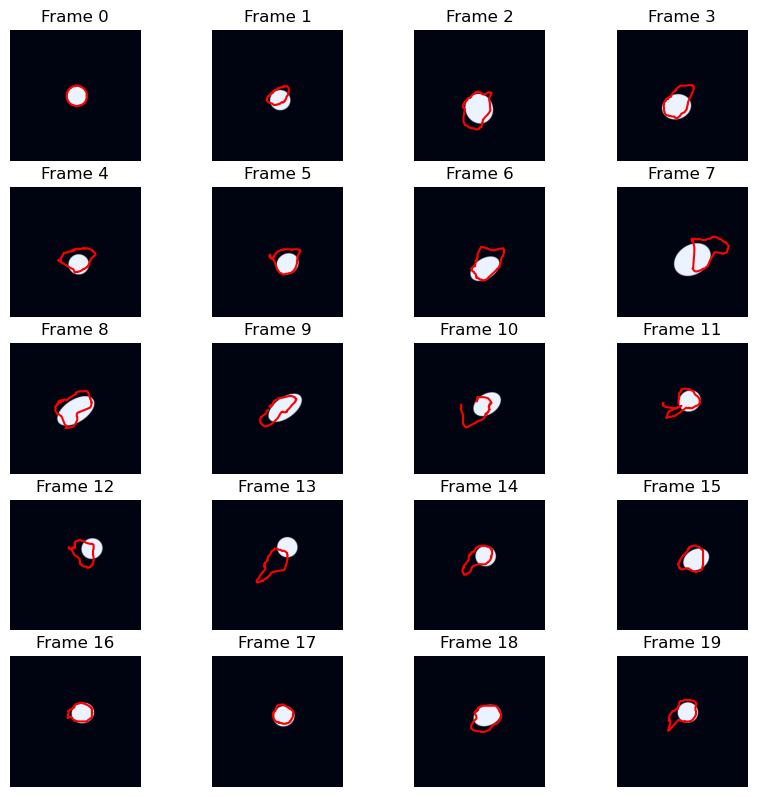

Epoch 750, IOU: 0.549058
Epoch 751, Loss: 12.29
Epoch 752, Loss: 11.02
Epoch 753, Loss: 13.54
Epoch 754, Loss: 13.38
Epoch 755, Loss: 13.67


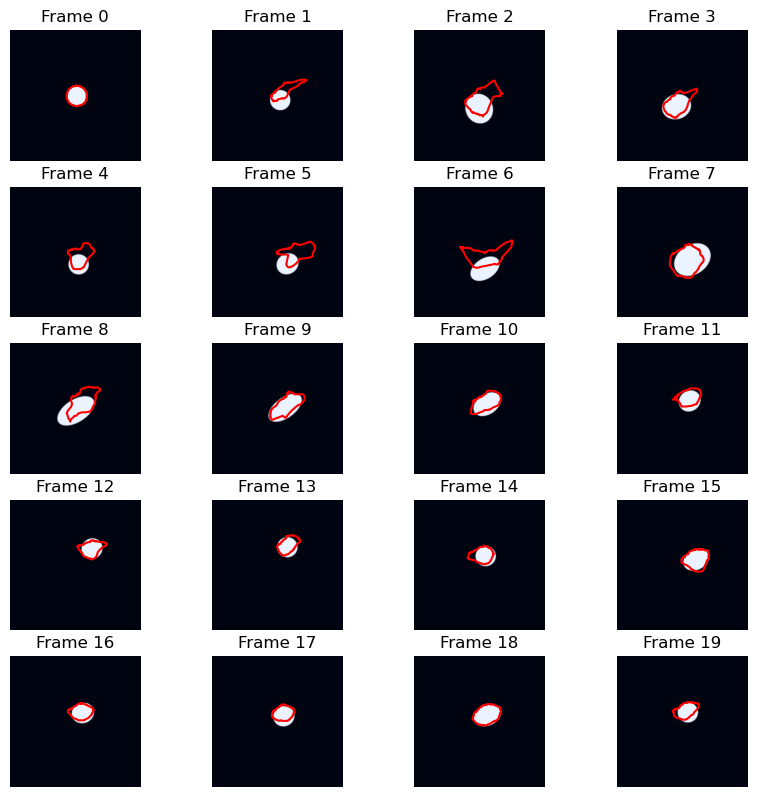

Epoch 755, IOU: 0.589168
Epoch 756, Loss: 15.34
Epoch 757, Loss: 17.84
Epoch 758, Loss: 25.95
Epoch 759, Loss: 22.54
Epoch 760, Loss: 26.60


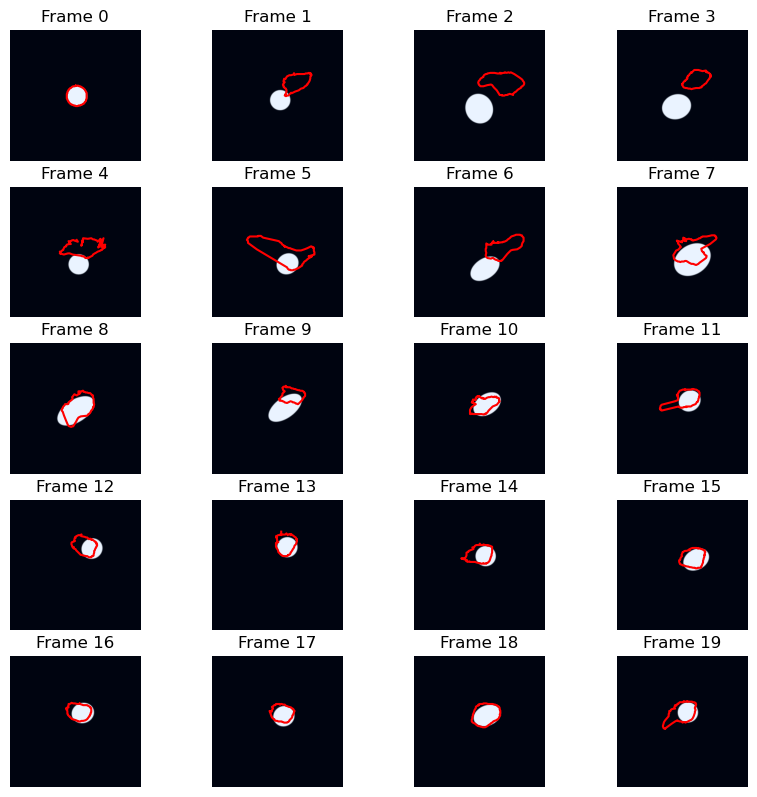

Epoch 760, IOU: 0.417589
Epoch 761, Loss: 16.01
Epoch 762, Loss: 56.82
Epoch 763, Loss: 89.84
Epoch 764, Loss: 69.52
Epoch 765, Loss: 52.36


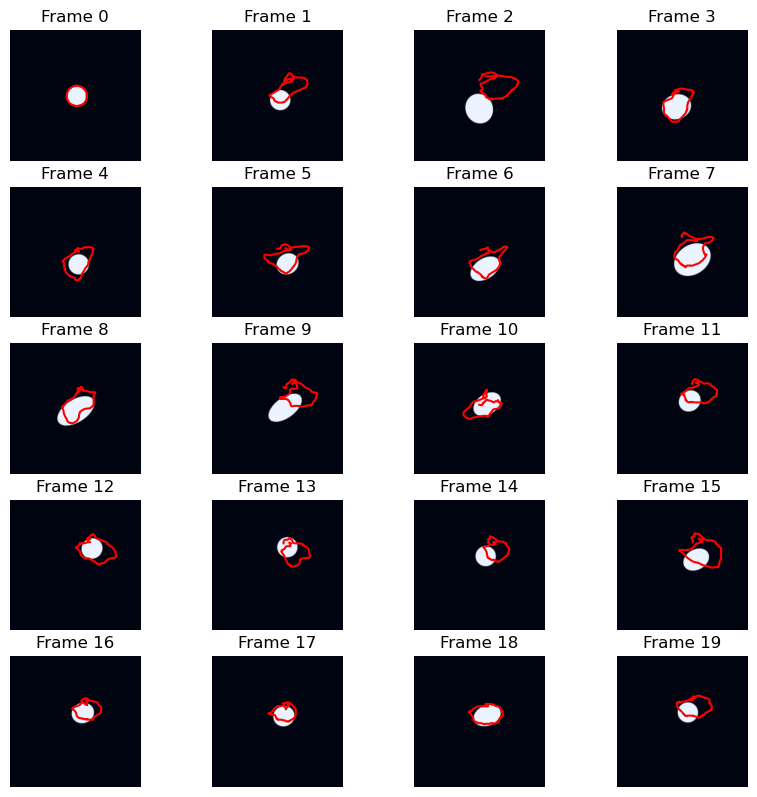

Epoch 765, IOU: 0.431929
Epoch 766, Loss: 54.52
Epoch 767, Loss: 41.04
Epoch 768, Loss: 53.47
Epoch 769, Loss: 32.02
Epoch 770, Loss: 29.44


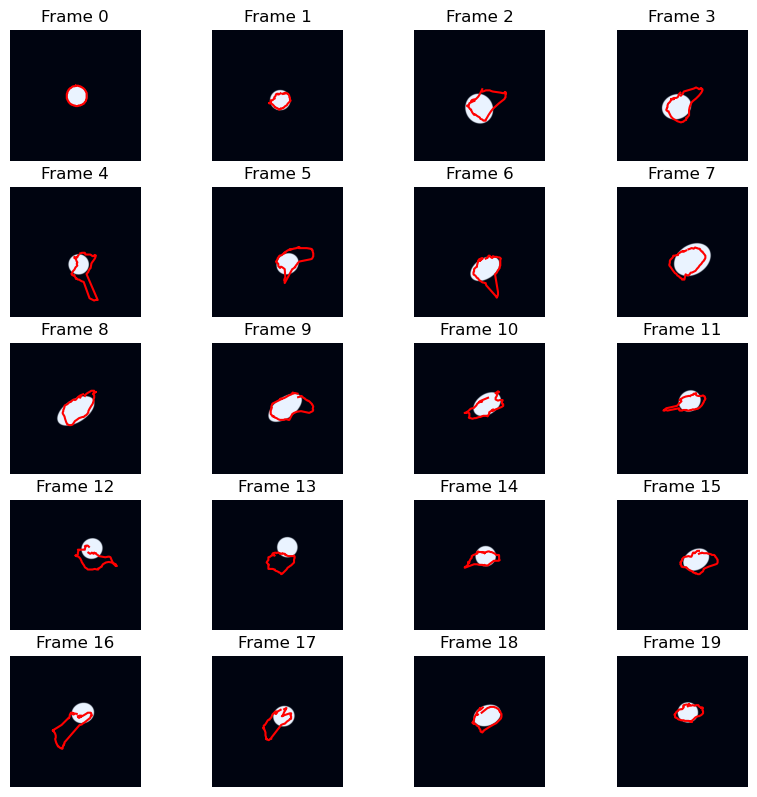

Epoch 770, IOU: 0.535321
Epoch 771, Loss: 29.67
Epoch 772, Loss: 24.18
Epoch 773, Loss: 21.14
Epoch 774, Loss: 20.53
Epoch 775, Loss: 22.71


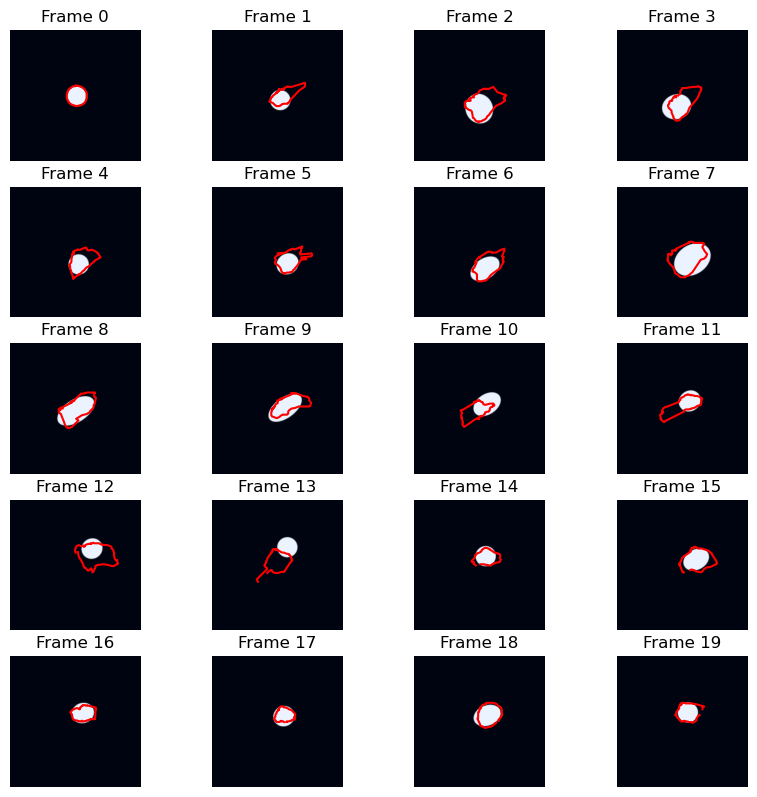

Epoch 775, IOU: 0.579344
Epoch 776, Loss: 20.30
Epoch 777, Loss: 19.30
Epoch 778, Loss: 21.02
Epoch 779, Loss: 18.57
Epoch 780, Loss: 18.31


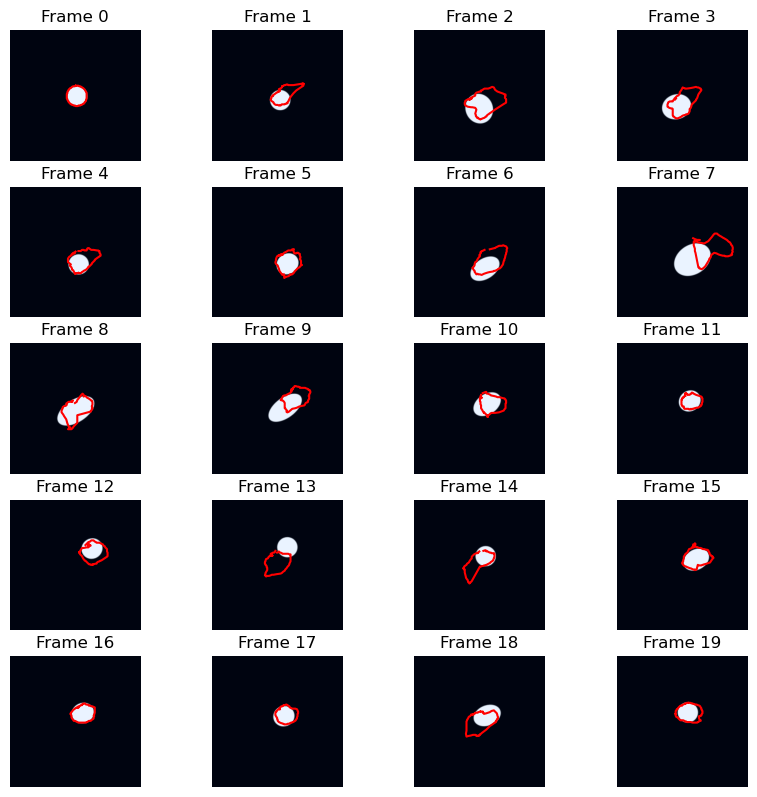

Epoch 780, IOU: 0.539622
Epoch 781, Loss: 19.65
Epoch 782, Loss: 18.73
Epoch 783, Loss: 17.71
Epoch 784, Loss: 16.07
Epoch 785, Loss: 18.06


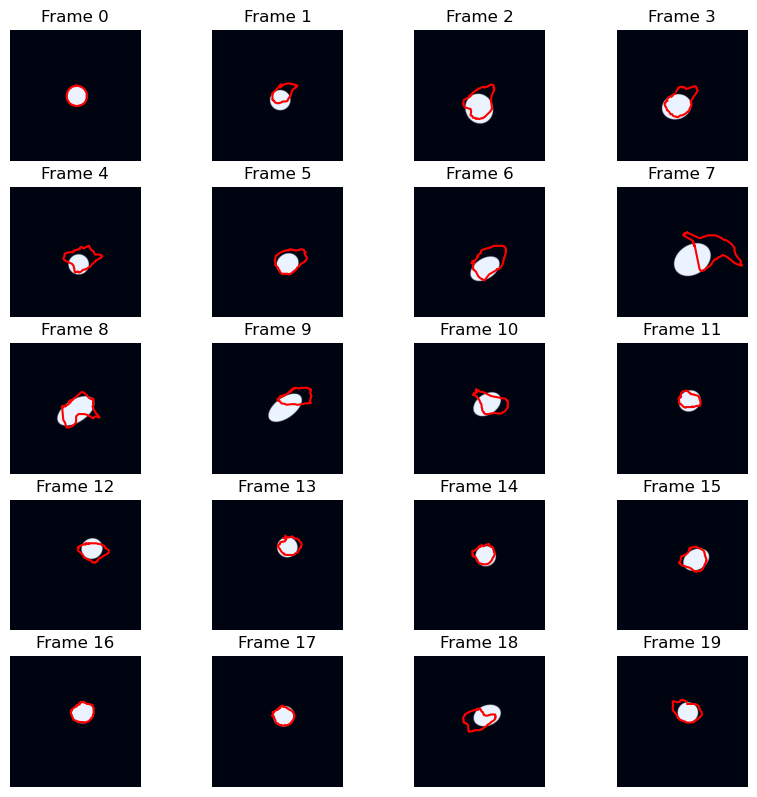

Epoch 785, IOU: 0.588397
Epoch 786, Loss: 18.84
Epoch 787, Loss: 21.12
Epoch 788, Loss: 14.58
Epoch 789, Loss: 13.79
Epoch 790, Loss: 19.78


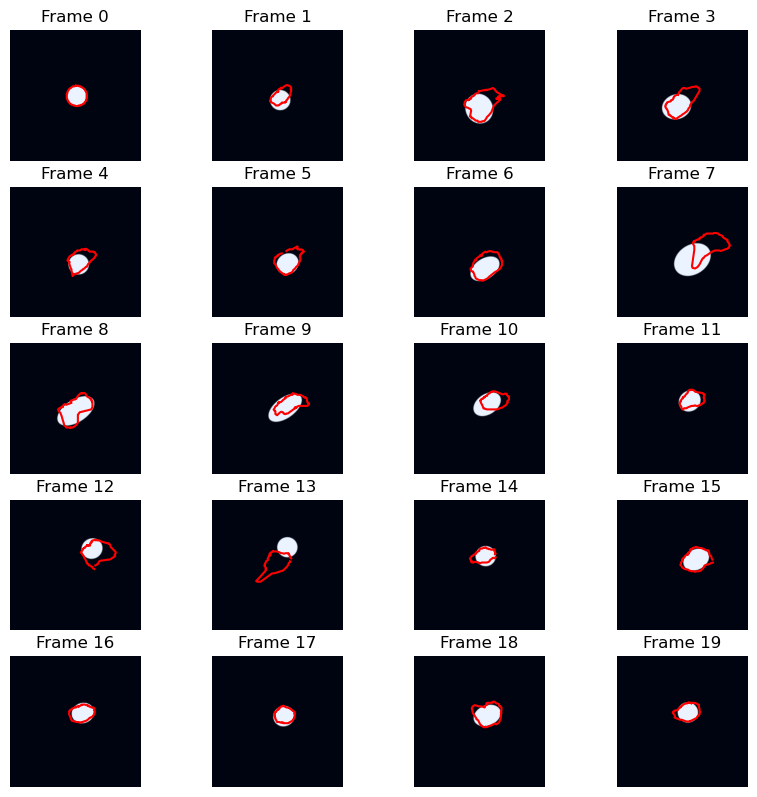

Epoch 790, IOU: 0.601665
Epoch 791, Loss: 12.87
Epoch 792, Loss: 15.52
Epoch 793, Loss: 14.15
Epoch 794, Loss: 15.94
Epoch 795, Loss: 14.92


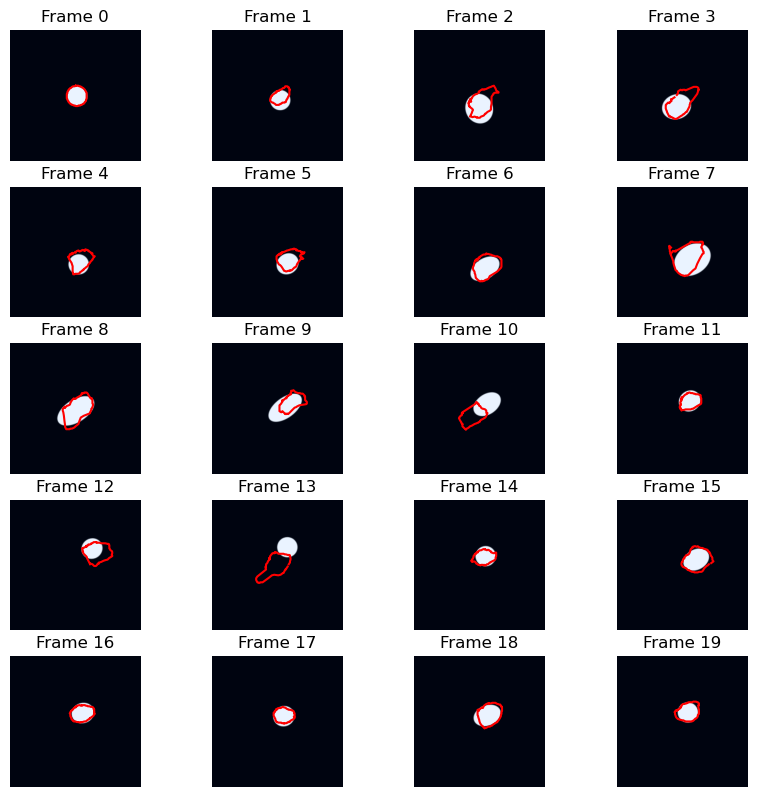

Epoch 795, IOU: 0.609165
Epoch 796, Loss: 13.20
Epoch 797, Loss: 12.85
Epoch 798, Loss: 11.68
Epoch 799, Loss: 12.37
Epoch 800, Loss: 12.53


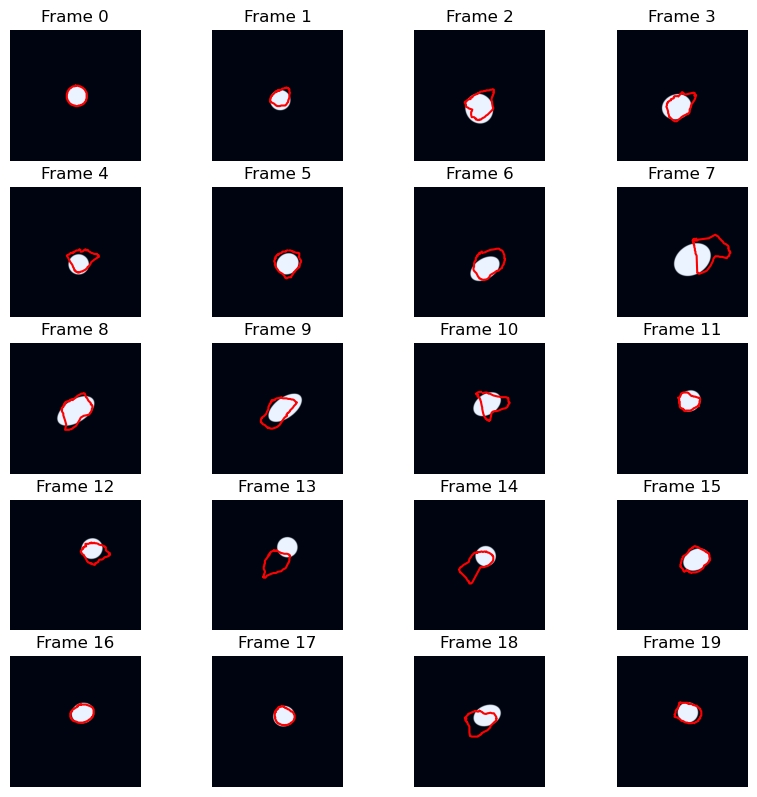

Epoch 800, IOU: 0.602283
Epoch 801, Loss: 15.67
Epoch 802, Loss: 12.79
Epoch 803, Loss: 13.66
Epoch 804, Loss: 19.32
Epoch 805, Loss: 13.28


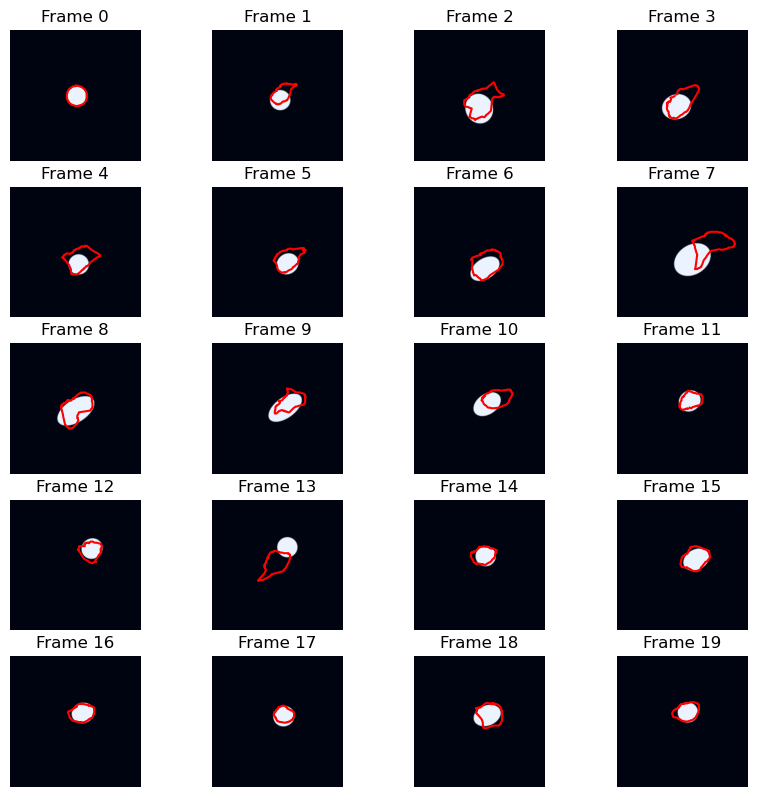

Epoch 805, IOU: 0.586297
Epoch 806, Loss: 11.75
Epoch 807, Loss: 12.00
Epoch 808, Loss: 12.51
Epoch 809, Loss: 12.56
Epoch 810, Loss: 11.64


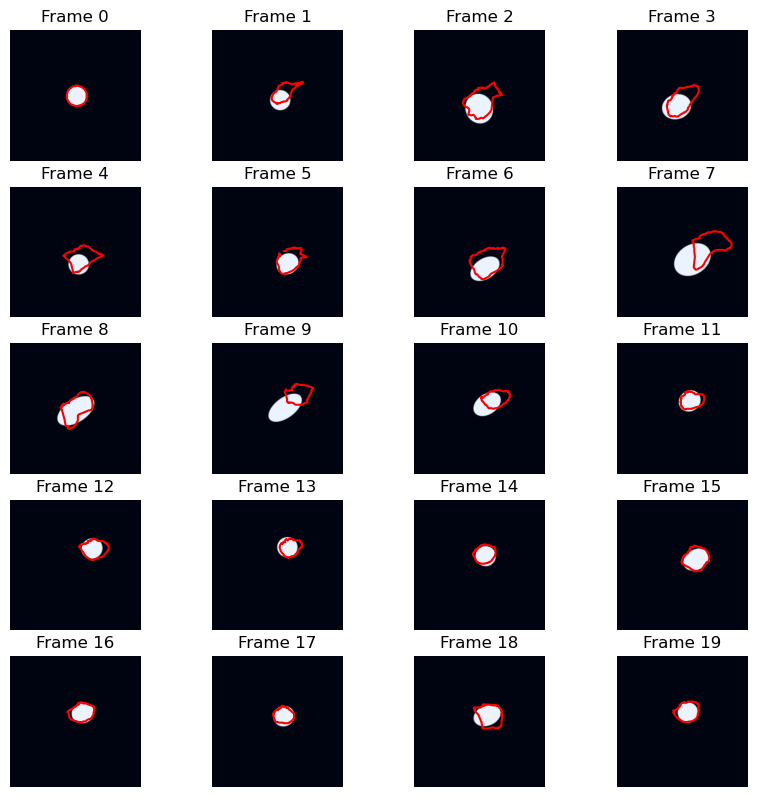

Epoch 810, IOU: 0.594446
Epoch 811, Loss: 12.03
Epoch 812, Loss: 12.16
Epoch 813, Loss: 12.13
Epoch 814, Loss: 12.03
Epoch 815, Loss: 12.41


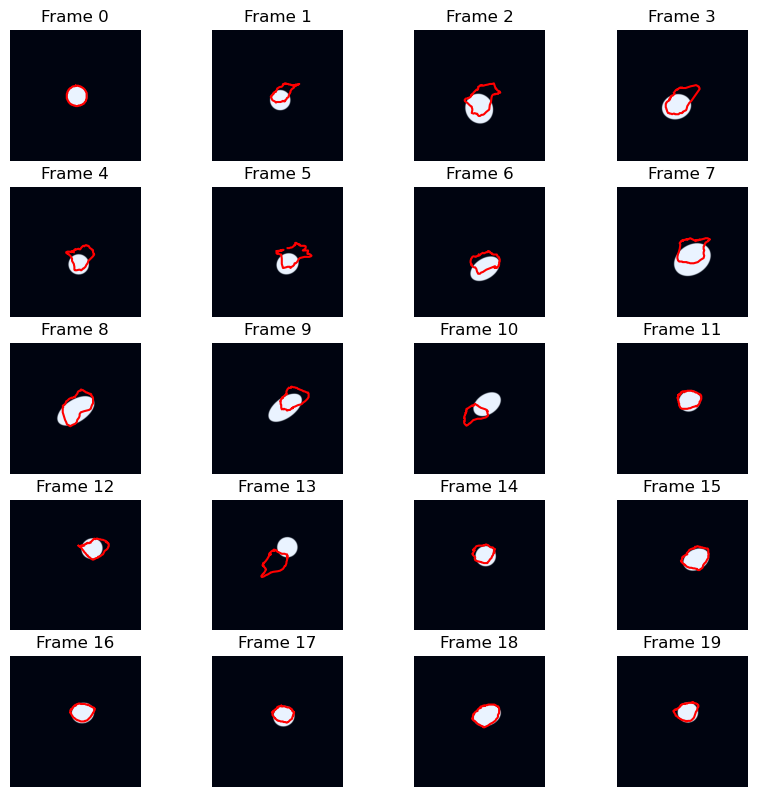

Epoch 815, IOU: 0.543672
Epoch 816, Loss: 13.54
Epoch 817, Loss: 14.38
Epoch 818, Loss: 11.05
Epoch 819, Loss: 10.86
Epoch 820, Loss: 11.84


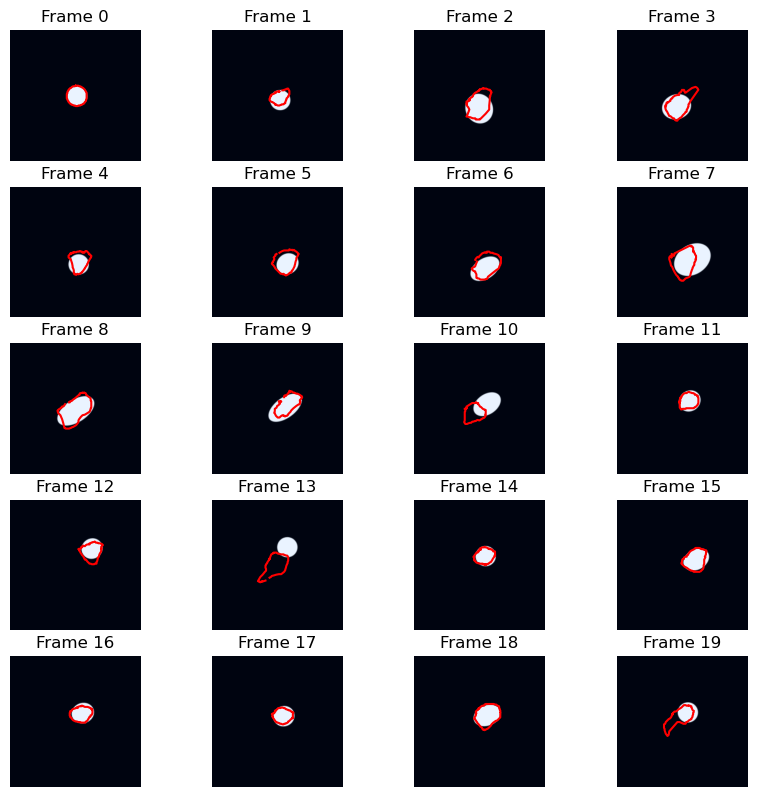

Epoch 820, IOU: 0.624668
Epoch 821, Loss: 12.10
Epoch 822, Loss: 11.01
Epoch 823, Loss: 11.19
Epoch 824, Loss: 10.66
Epoch 825, Loss: 11.57


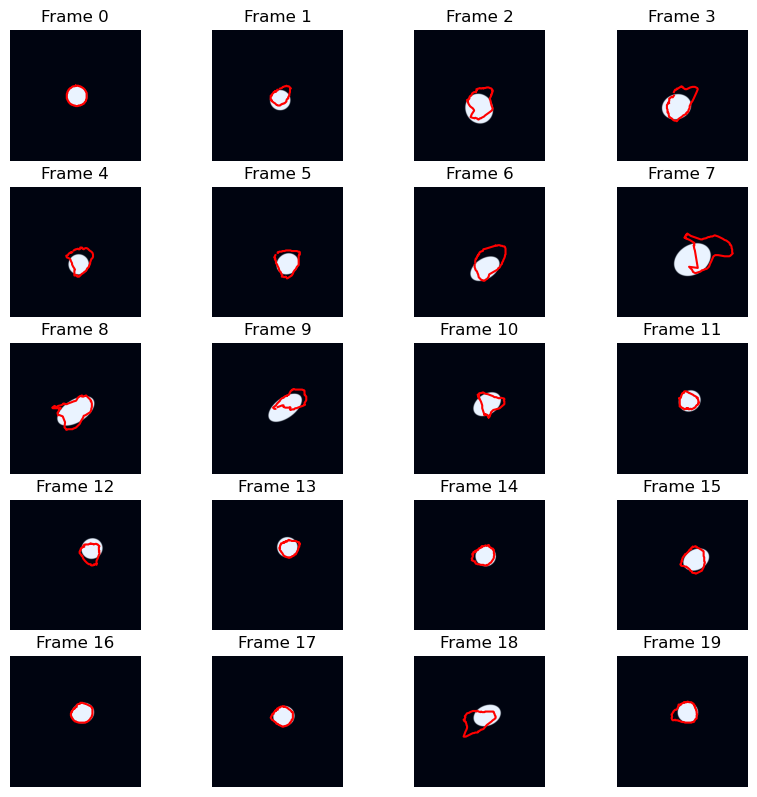

Epoch 825, IOU: 0.634151
Epoch 826, Loss: 17.26
Epoch 827, Loss: 11.85
Epoch 828, Loss: 10.82
Epoch 829, Loss: 10.80
Epoch 830, Loss: 10.28


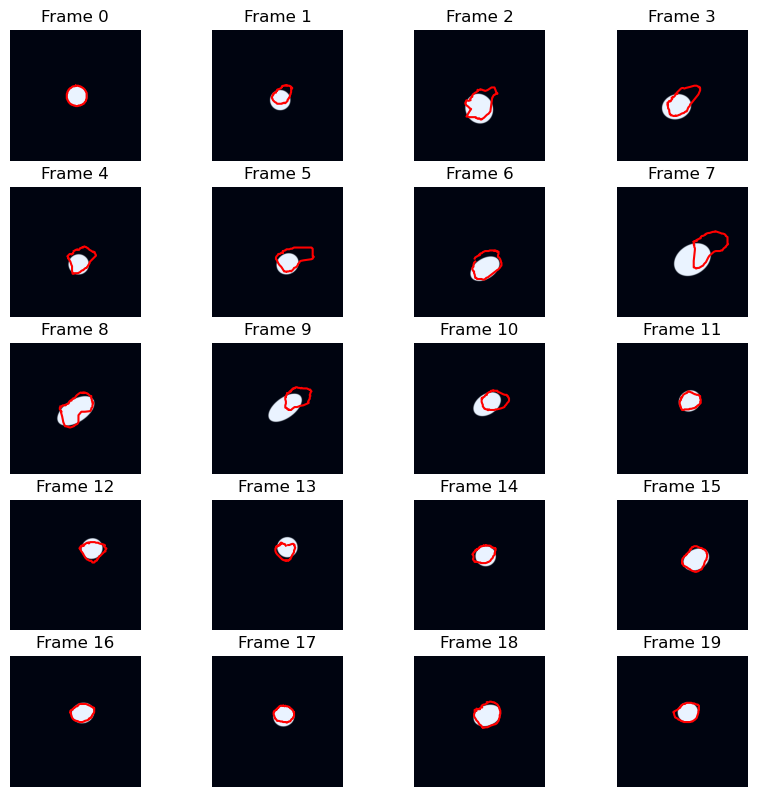

Epoch 830, IOU: 0.624874
Epoch 831, Loss: 10.51
Epoch 832, Loss: 10.46
Epoch 833, Loss: 11.20
Epoch 834, Loss: 11.16
Epoch 835, Loss: 10.21


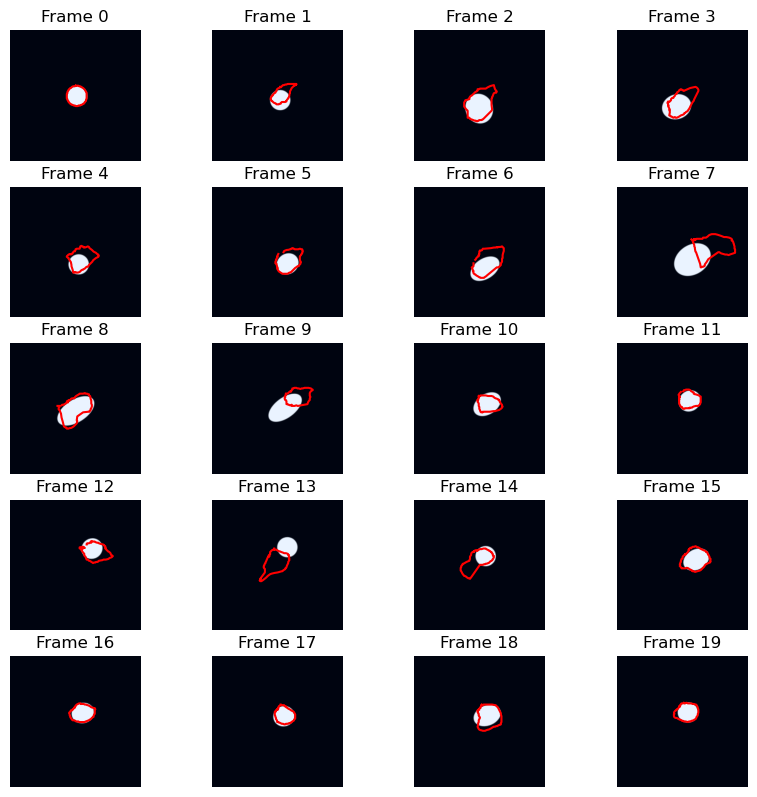

Epoch 835, IOU: 0.580966
Epoch 836, Loss: 10.31
Epoch 837, Loss: 10.21
Epoch 838, Loss: 9.93
Epoch 839, Loss: 10.86
Epoch 840, Loss: 9.44


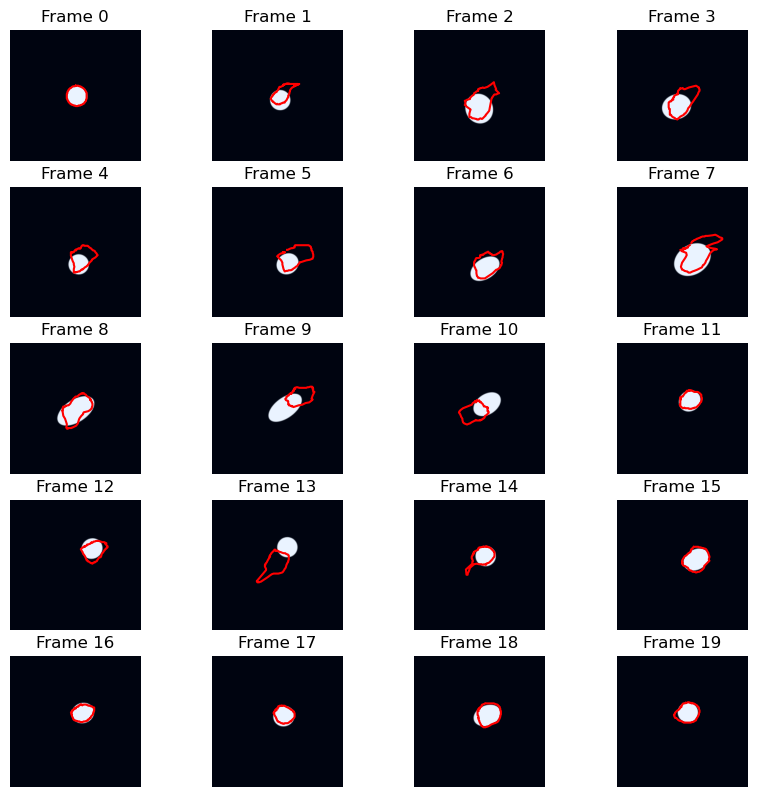

Epoch 840, IOU: 0.577216
Epoch 841, Loss: 9.97
Epoch 842, Loss: 9.45
Epoch 843, Loss: 9.67
Epoch 844, Loss: 10.42
Epoch 845, Loss: 10.10


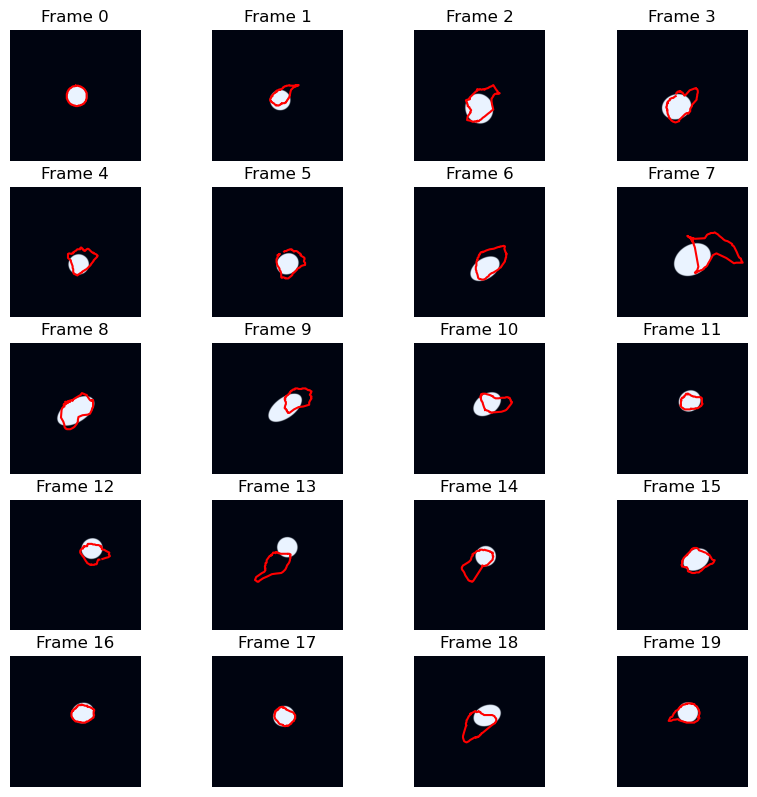

Epoch 845, IOU: 0.553069
Epoch 846, Loss: 10.59
Epoch 847, Loss: 10.94
Epoch 848, Loss: 11.62
Epoch 849, Loss: 10.95
Epoch 850, Loss: 10.76


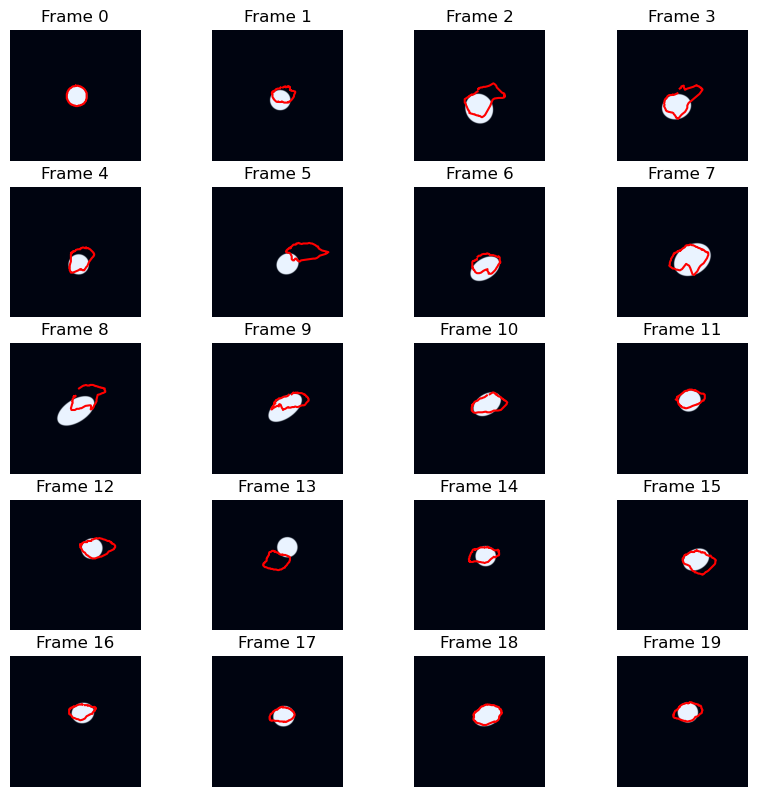

Epoch 850, IOU: 0.545812
Epoch 851, Loss: 10.53
Epoch 852, Loss: 10.42
Epoch 853, Loss: 10.46
Epoch 854, Loss: 11.57
Epoch 855, Loss: 10.87


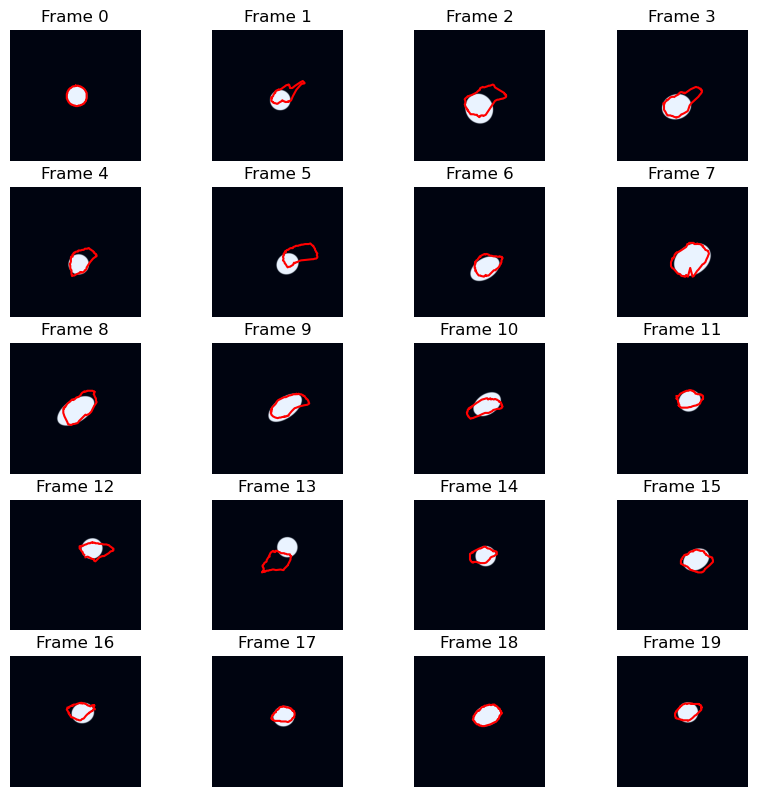

Epoch 855, IOU: 0.616343
Epoch 856, Loss: 10.28
Epoch 857, Loss: 10.63
Epoch 858, Loss: 9.67
Epoch 859, Loss: 9.57
Epoch 860, Loss: 9.26


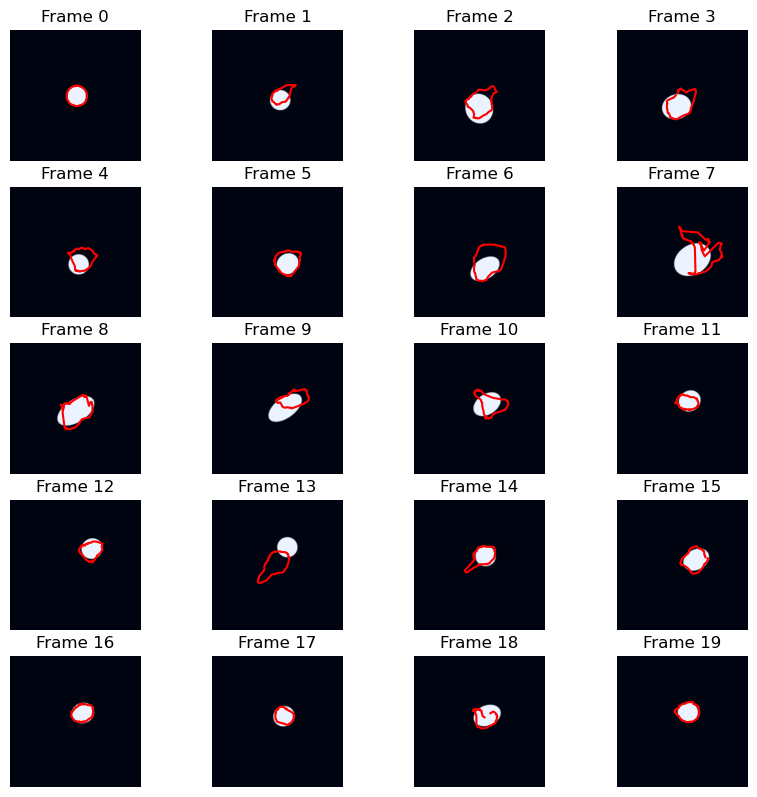

Epoch 860, IOU: 0.591215
Epoch 861, Loss: 17.02
Epoch 862, Loss: 13.80
Epoch 863, Loss: 11.90
Epoch 864, Loss: 9.77
Epoch 865, Loss: 10.13


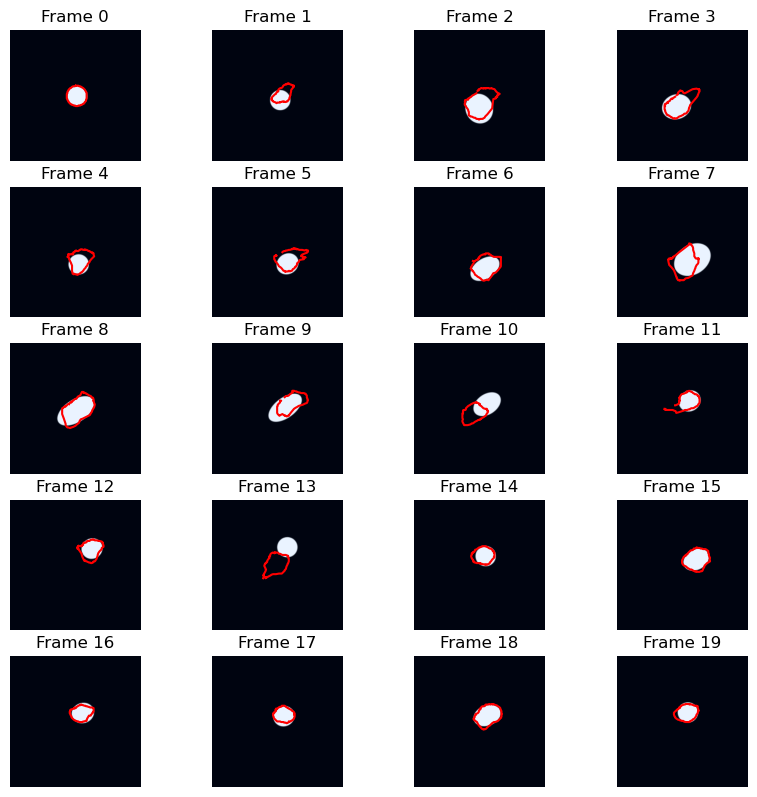

Epoch 865, IOU: 0.631963
Epoch 866, Loss: 9.62
Epoch 867, Loss: 9.61
Epoch 868, Loss: 9.84
Epoch 869, Loss: 9.10
Epoch 870, Loss: 9.85


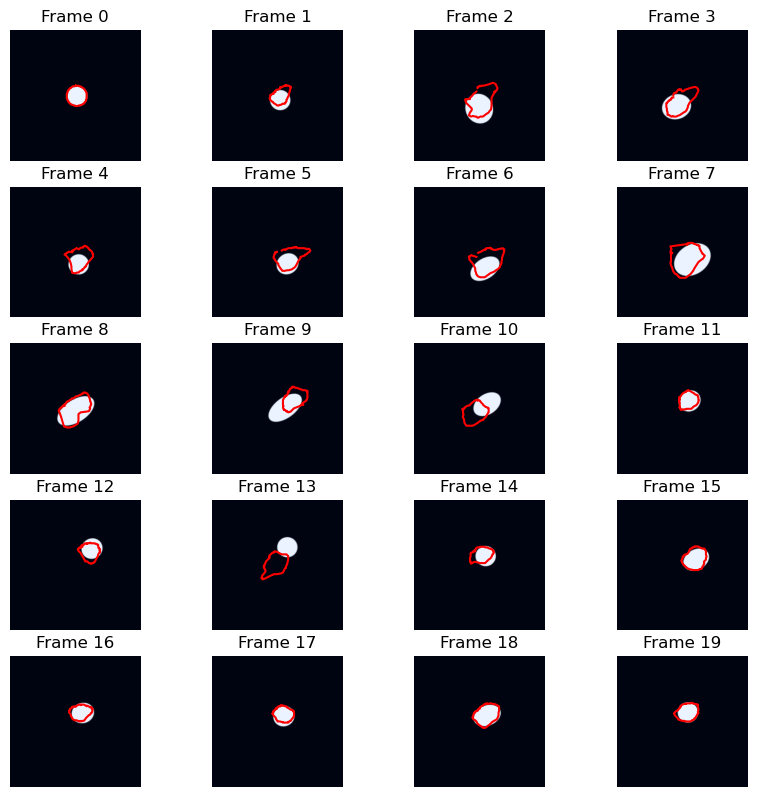

Epoch 870, IOU: 0.585252
Epoch 871, Loss: 10.89
Epoch 872, Loss: 9.65
Epoch 873, Loss: 9.30
Epoch 874, Loss: 9.95
Epoch 875, Loss: 9.25


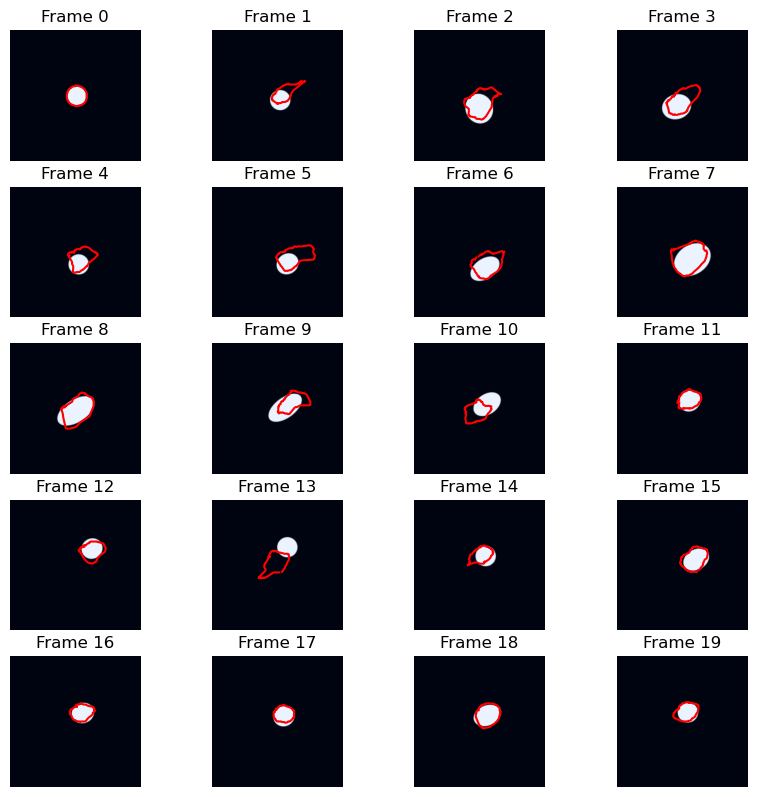

Epoch 875, IOU: 0.605740
Epoch 876, Loss: 9.31
Epoch 877, Loss: 9.27
Epoch 878, Loss: 10.17
Epoch 879, Loss: 10.03
Epoch 880, Loss: 8.84


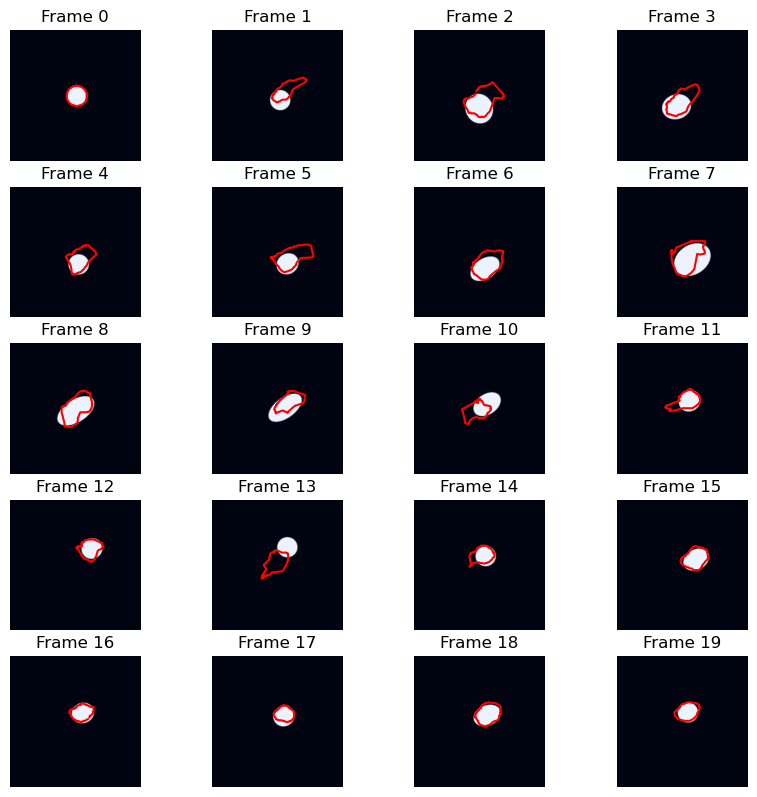

Epoch 880, IOU: 0.587673
Epoch 881, Loss: 8.78
Epoch 882, Loss: 9.09
Epoch 883, Loss: 8.42
Epoch 884, Loss: 9.02
Epoch 885, Loss: 8.91


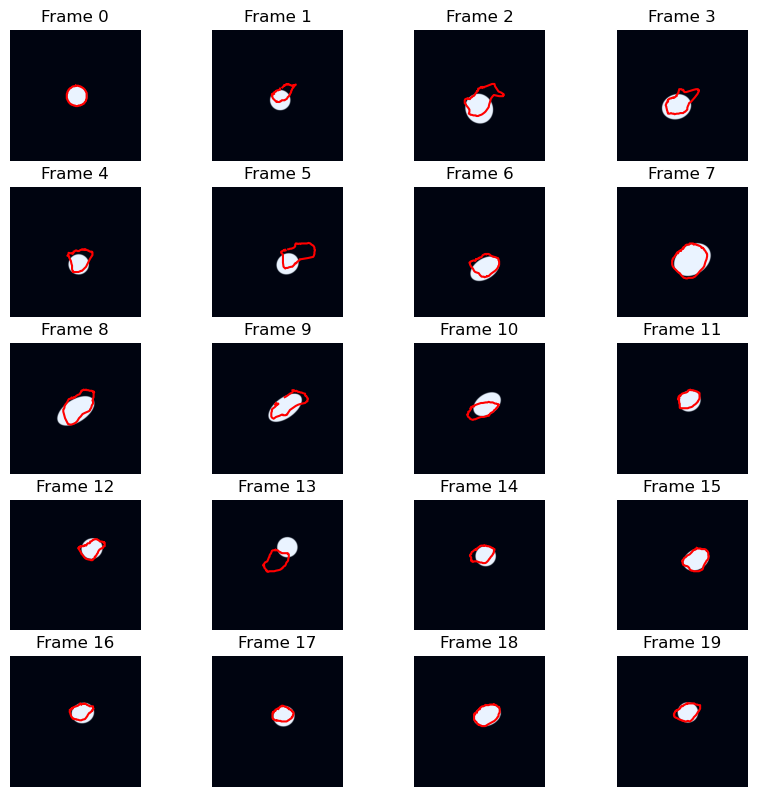

Epoch 885, IOU: 0.607667
Epoch 886, Loss: 9.37
Epoch 887, Loss: 9.17
Epoch 888, Loss: 9.31
Epoch 889, Loss: 9.04
Epoch 890, Loss: 8.63


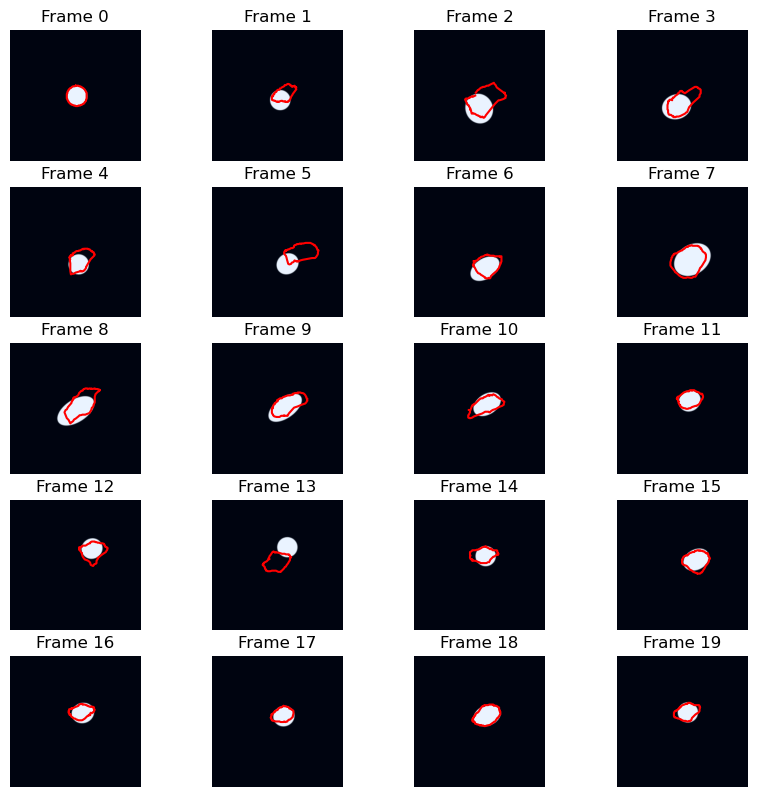

Epoch 890, IOU: 0.606843
Epoch 891, Loss: 8.59
Epoch 892, Loss: 10.12
Epoch 893, Loss: 9.73
Epoch 894, Loss: 9.43
Epoch 895, Loss: 9.35


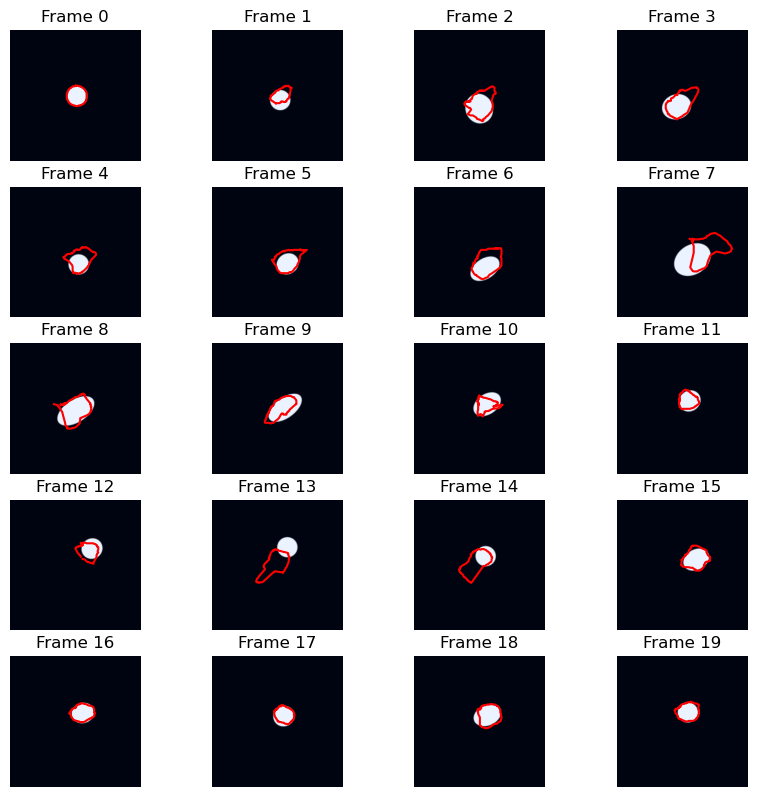

Epoch 895, IOU: 0.610611
Epoch 896, Loss: 9.43
Epoch 897, Loss: 9.84
Epoch 898, Loss: 9.44
Epoch 899, Loss: 9.29
Epoch 900, Loss: 8.99


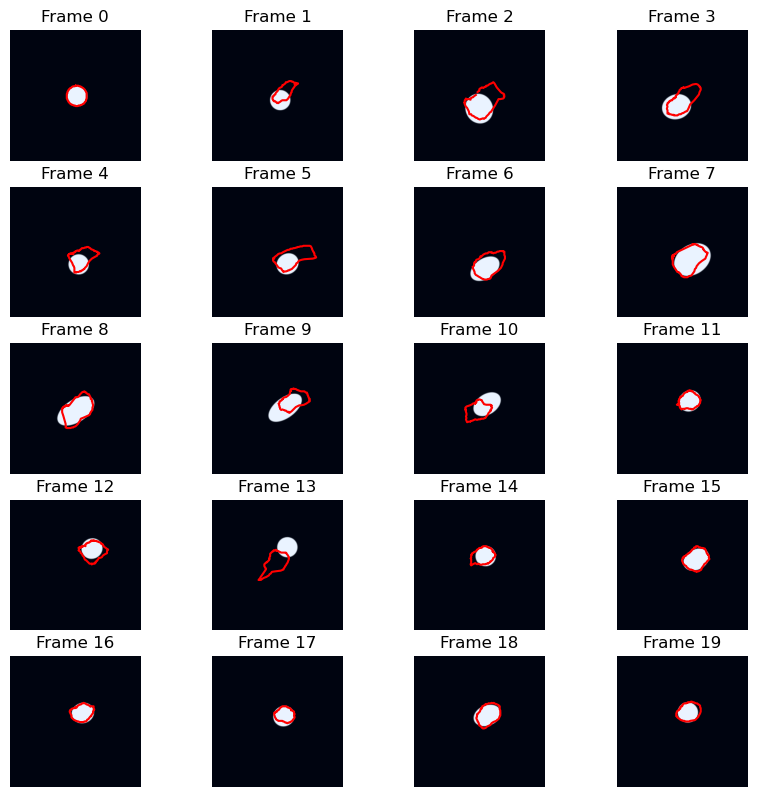

Epoch 900, IOU: 0.605722
Epoch 901, Loss: 9.26
Epoch 902, Loss: 9.75
Epoch 903, Loss: 9.02
Epoch 904, Loss: 9.19
Epoch 905, Loss: 8.73


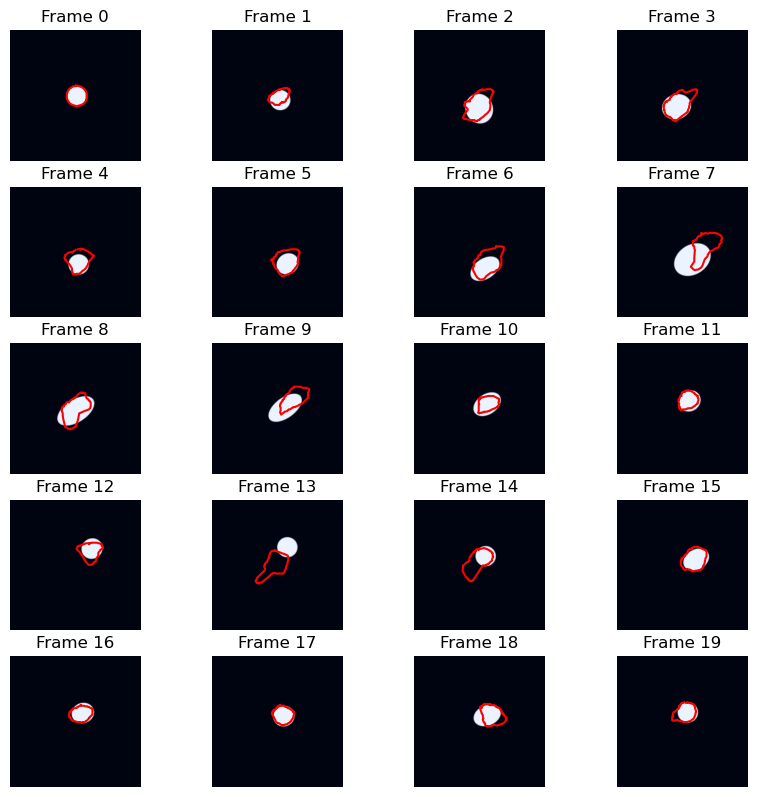

Epoch 905, IOU: 0.603612
Epoch 906, Loss: 9.67
Epoch 907, Loss: 9.97
Epoch 908, Loss: 9.42
Epoch 909, Loss: 10.24
Epoch 910, Loss: 9.31


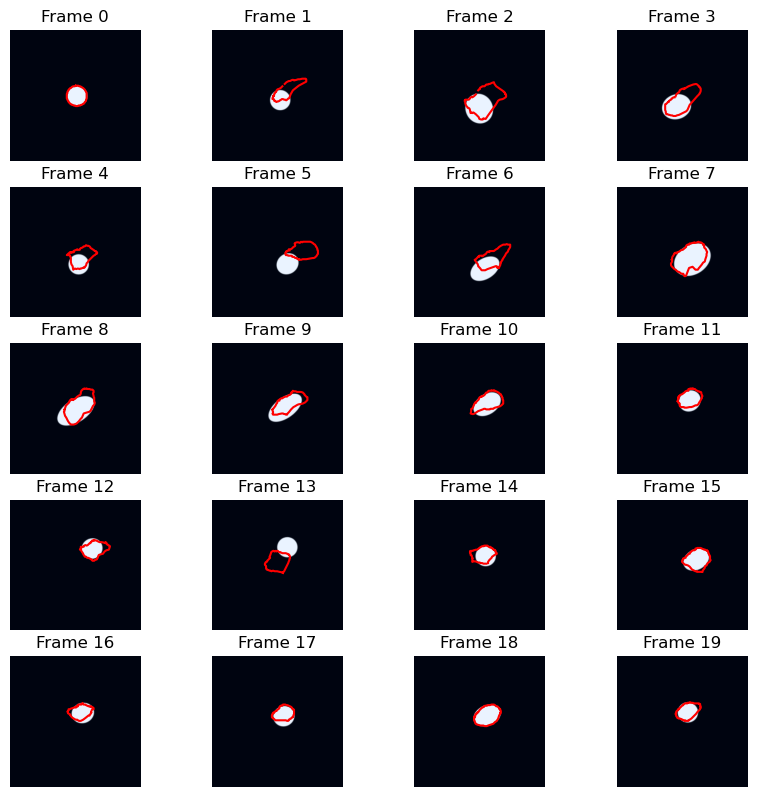

Epoch 910, IOU: 0.566671
Epoch 911, Loss: 9.61
Epoch 912, Loss: 9.99
Epoch 913, Loss: 9.62
Epoch 914, Loss: 12.24
Epoch 915, Loss: 10.21


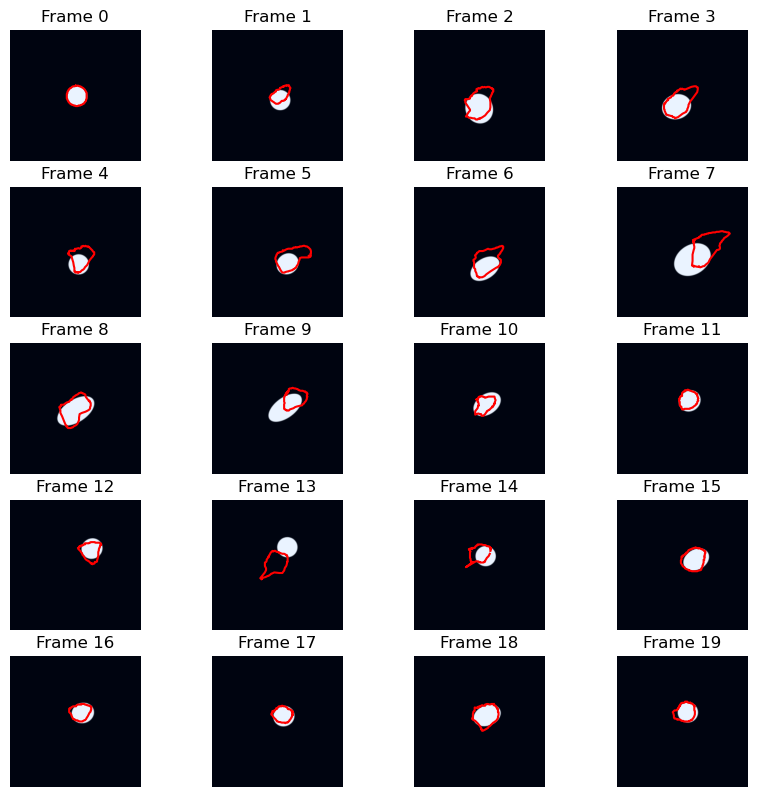

Epoch 915, IOU: 0.571049
Epoch 916, Loss: 10.40
Epoch 917, Loss: 9.85
Epoch 918, Loss: 8.38
Epoch 919, Loss: 9.41
Epoch 920, Loss: 9.72


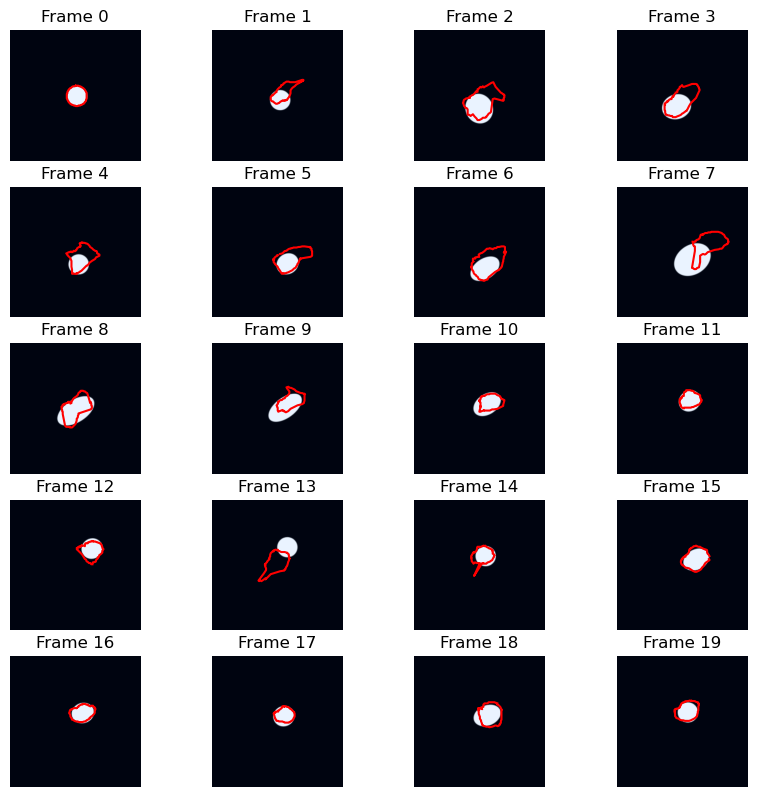

Epoch 920, IOU: 0.581621
Epoch 921, Loss: 8.72
Epoch 922, Loss: 8.80
Epoch 923, Loss: 8.17
Epoch 924, Loss: 8.94
Epoch 925, Loss: 8.84


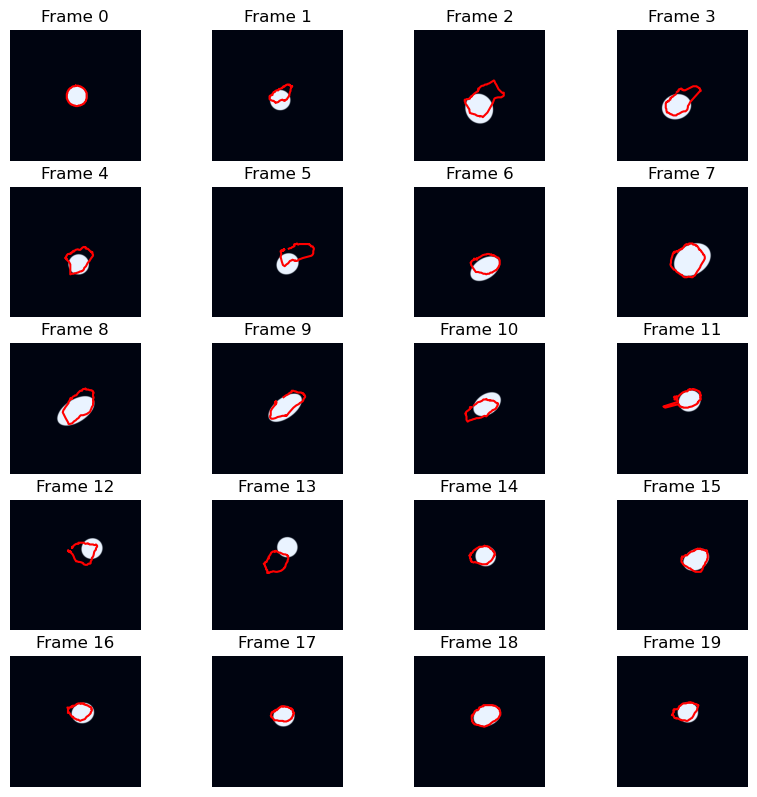

Epoch 925, IOU: 0.579957
Epoch 926, Loss: 9.66
Epoch 927, Loss: 8.93
Epoch 928, Loss: 8.84
Epoch 929, Loss: 9.66
Epoch 930, Loss: 10.83


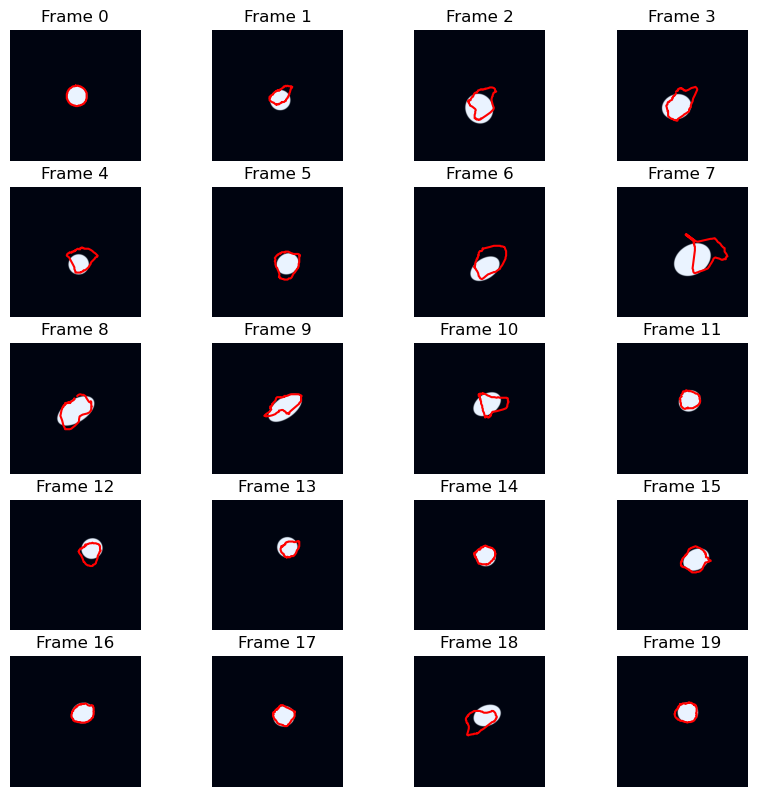

Epoch 930, IOU: 0.650815
Epoch 931, Loss: 9.77
Epoch 932, Loss: 16.98
Epoch 933, Loss: 10.11
Epoch 934, Loss: 9.81
Epoch 935, Loss: 9.95


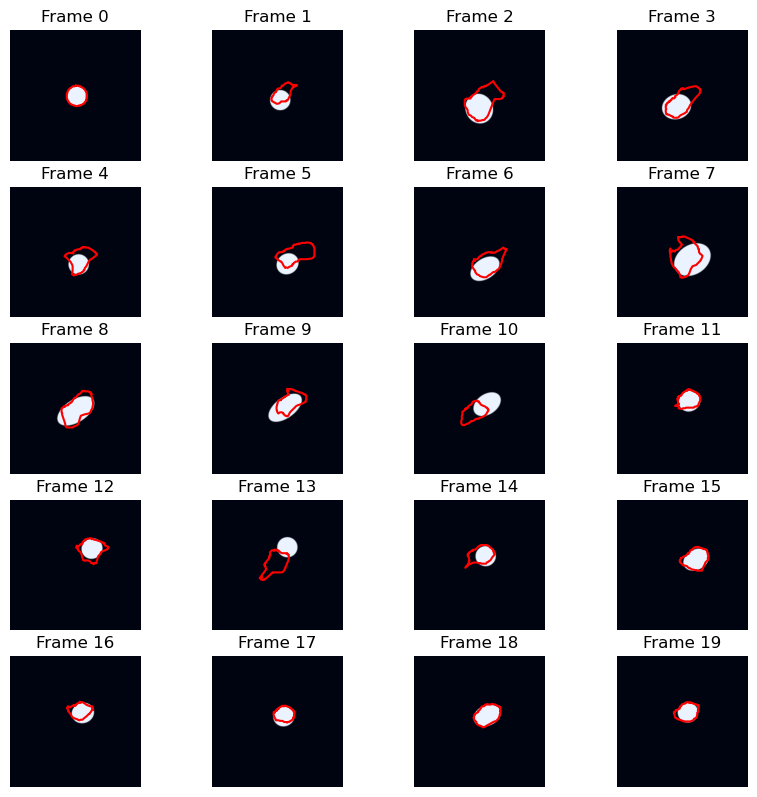

Epoch 935, IOU: 0.585763
Epoch 936, Loss: 9.61
Epoch 937, Loss: 9.05
Epoch 938, Loss: 8.92
Epoch 939, Loss: 7.76
Epoch 940, Loss: 9.09


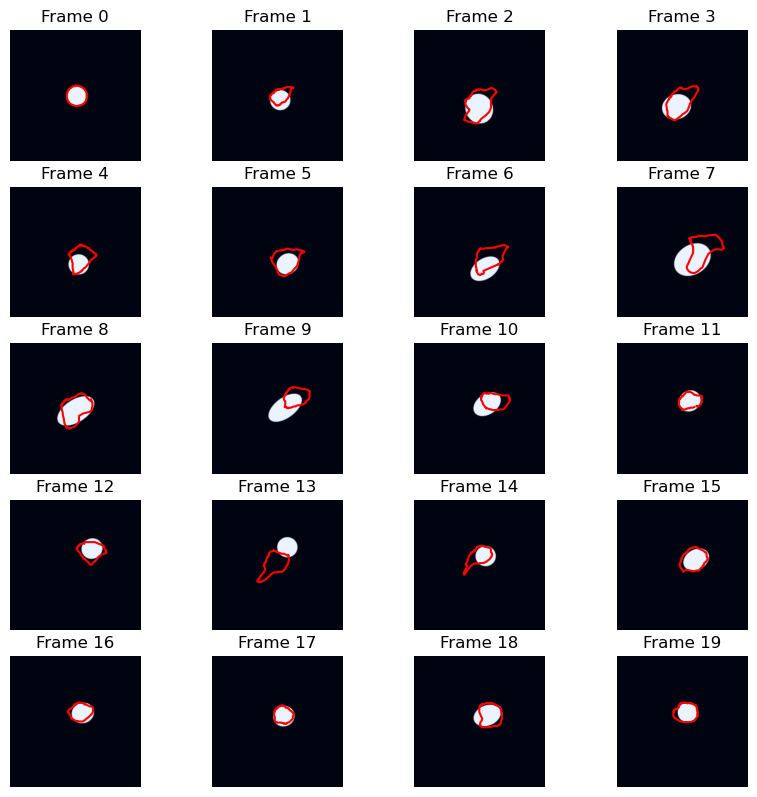

Epoch 940, IOU: 0.575863
Epoch 941, Loss: 9.62
Epoch 942, Loss: 9.87
Epoch 943, Loss: 10.02
Epoch 944, Loss: 9.68
Epoch 945, Loss: 9.37


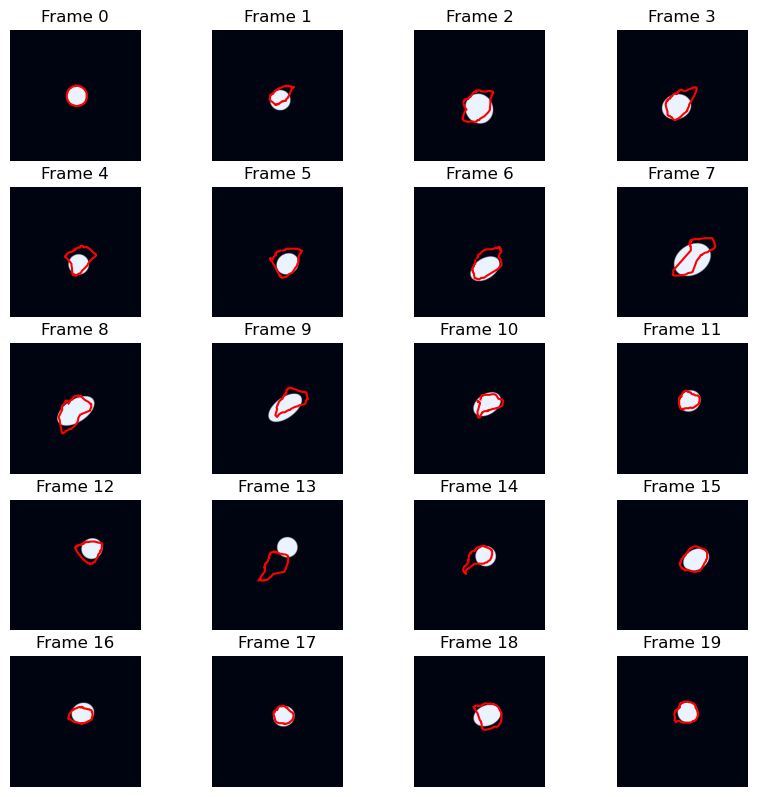

Epoch 945, IOU: 0.618976
Epoch 946, Loss: 8.41
Epoch 947, Loss: 9.20
Epoch 948, Loss: 9.16
Epoch 949, Loss: 8.57
Epoch 950, Loss: 8.52


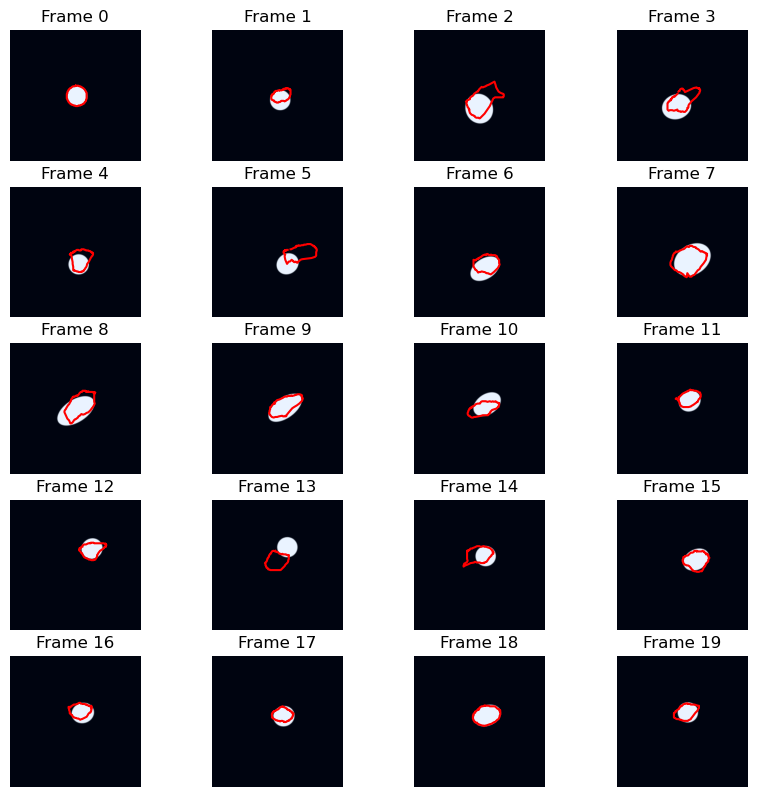

Epoch 950, IOU: 0.578400
Epoch 951, Loss: 8.21
Epoch 952, Loss: 8.78
Epoch 953, Loss: 8.14
Epoch 954, Loss: 8.38
Epoch 955, Loss: 8.21


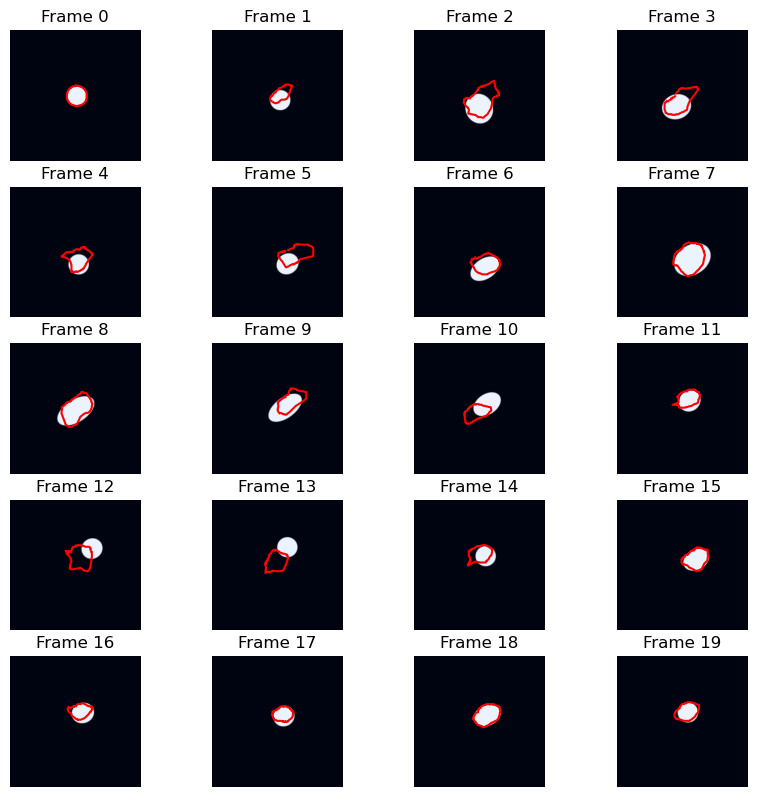

Epoch 955, IOU: 0.554672
Epoch 956, Loss: 8.43
Epoch 957, Loss: 8.83
Epoch 958, Loss: 8.58
Epoch 959, Loss: 8.61
Epoch 960, Loss: 8.97


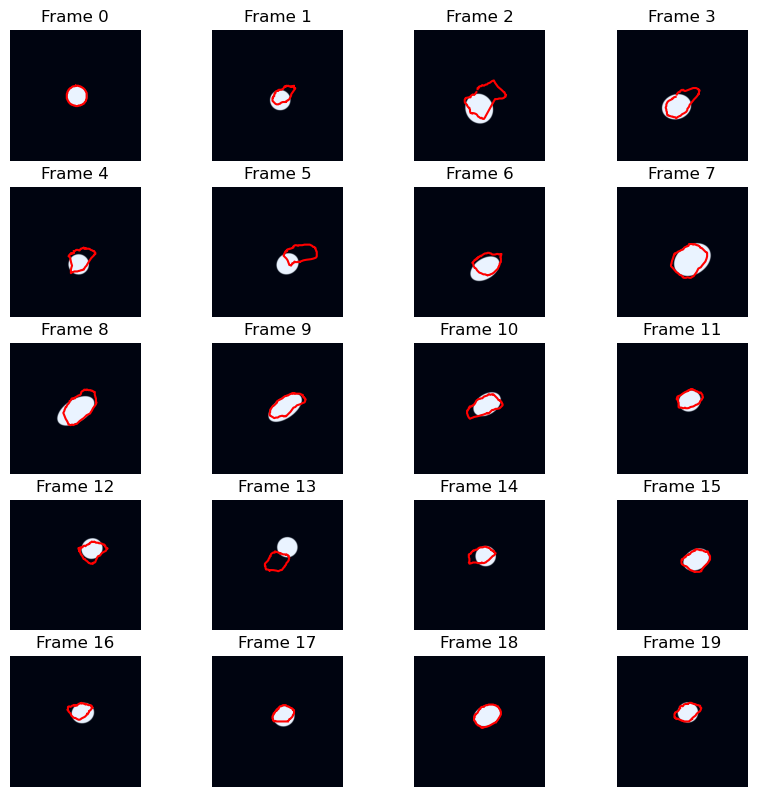

Epoch 960, IOU: 0.614489
Epoch 961, Loss: 8.82
Epoch 962, Loss: 9.29
Epoch 963, Loss: 9.00
Epoch 964, Loss: 9.64
Epoch 965, Loss: 8.97


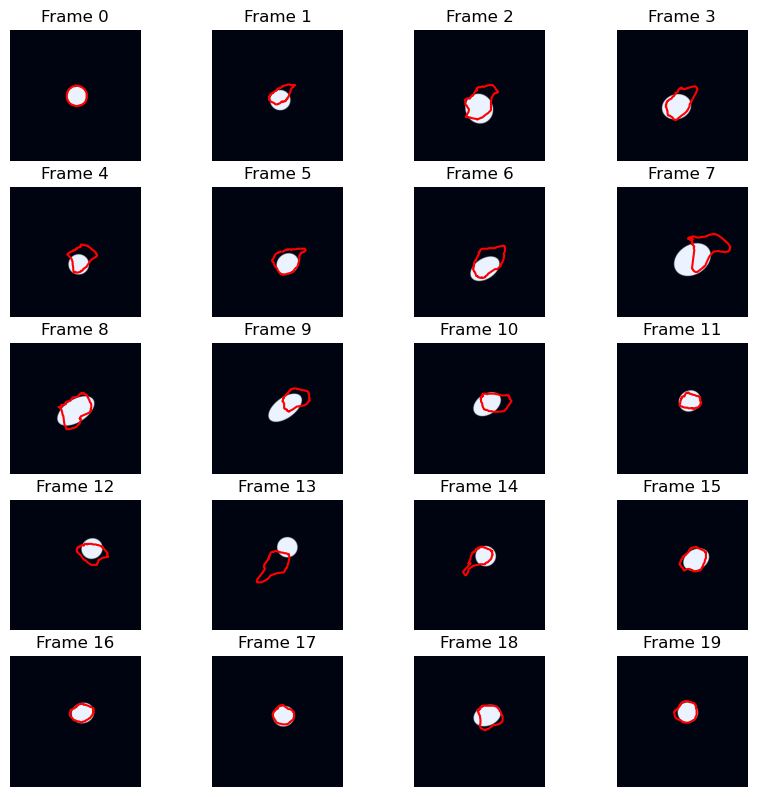

Epoch 965, IOU: 0.580456
Epoch 966, Loss: 9.69
Epoch 967, Loss: 8.93
Epoch 968, Loss: 9.22
Epoch 969, Loss: 8.15
Epoch 970, Loss: 8.44


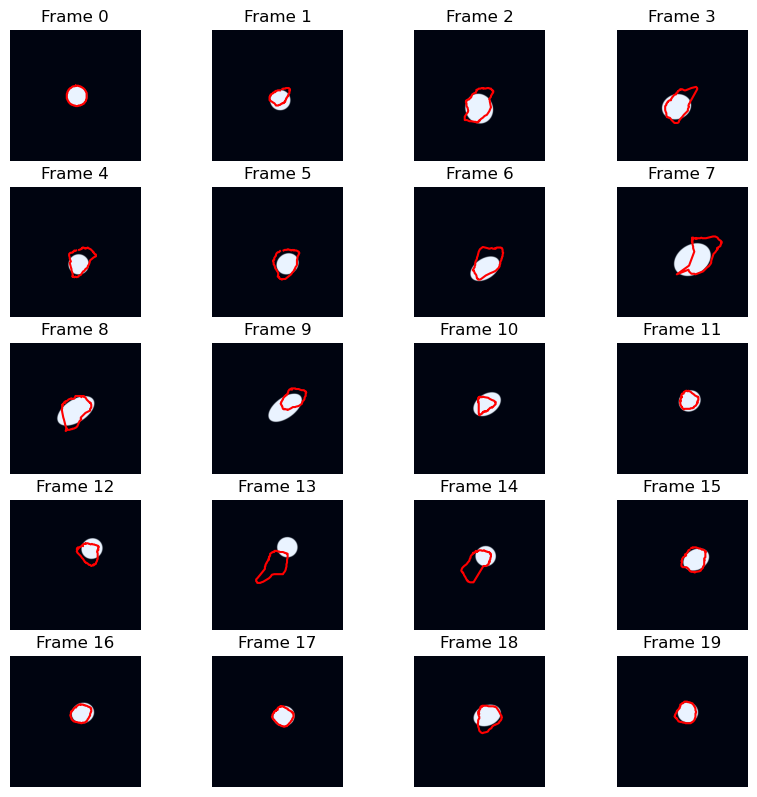

Epoch 970, IOU: 0.595300
Epoch 971, Loss: 9.24
Epoch 972, Loss: 9.44
Epoch 973, Loss: 9.29
Epoch 974, Loss: 9.17
Epoch 975, Loss: 9.34


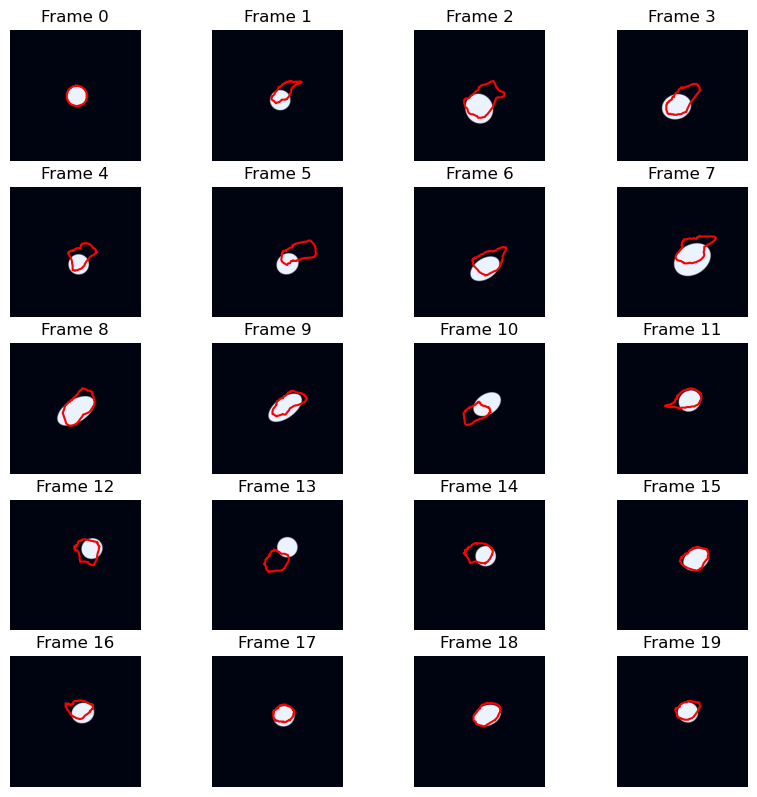

Epoch 975, IOU: 0.510095
Epoch 976, Loss: 9.99
Epoch 977, Loss: 8.82
Epoch 978, Loss: 8.27
Epoch 979, Loss: 8.42
Epoch 980, Loss: 9.46


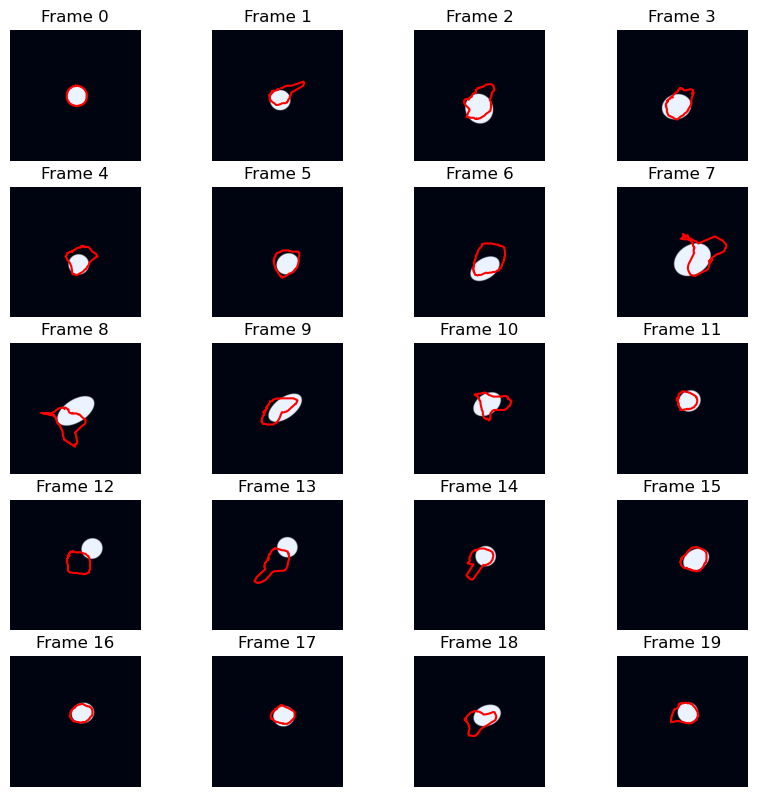

Epoch 980, IOU: 0.534873
Epoch 981, Loss: 9.09
Epoch 982, Loss: 12.92
Epoch 983, Loss: 12.24
Epoch 984, Loss: 10.58
Epoch 985, Loss: 10.66


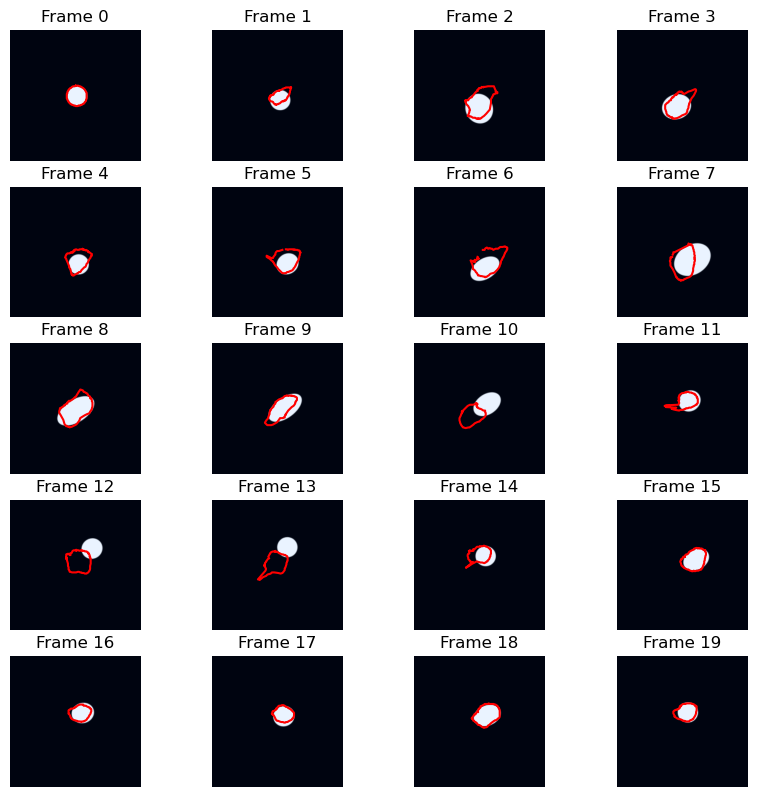

Epoch 985, IOU: 0.571421
Epoch 986, Loss: 9.16
Epoch 987, Loss: 10.07
Epoch 988, Loss: 10.54
Epoch 989, Loss: 9.69
Epoch 990, Loss: 10.04


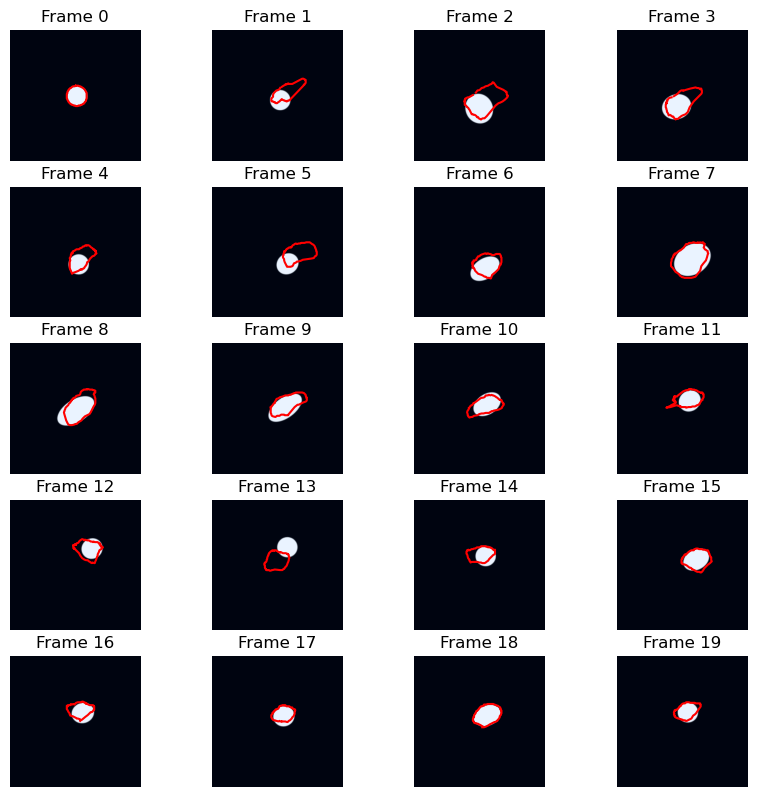

Epoch 990, IOU: 0.593608
Epoch 991, Loss: 9.51
Epoch 992, Loss: 9.80
Epoch 993, Loss: 9.36
Epoch 994, Loss: 9.55
Epoch 995, Loss: 9.43


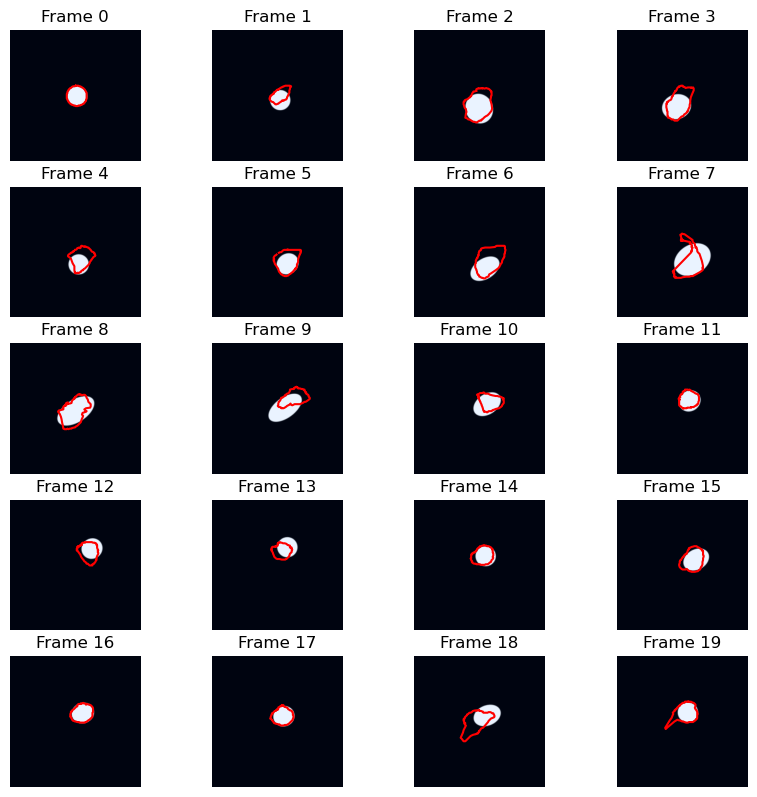

Epoch 995, IOU: 0.612673
Epoch 996, Loss: 10.59
Epoch 997, Loss: 11.19
Epoch 998, Loss: 9.83
Epoch 999, Loss: 9.38
Epoch 1000, Loss: 9.12


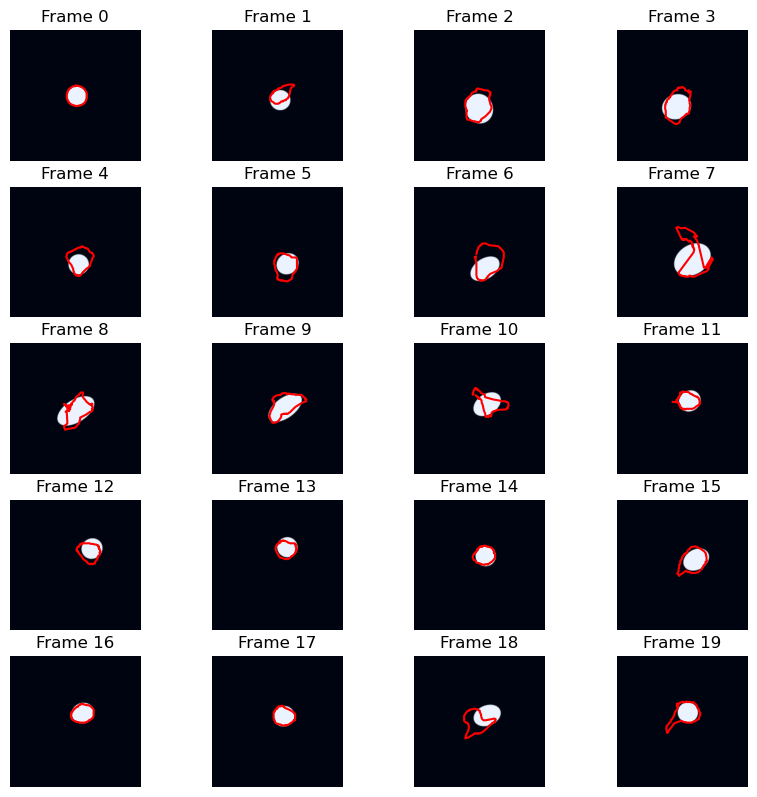

Epoch 1000, IOU: 0.636537


In [21]:
dict_loss = {}
dict_iou = {}
interval_epochs = 50
interval_num = 155
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-3)
gradient_clip = 2
test_set = Balltest("ellipse/uniform_samples_80.json")
model_infer = ModelInfer(test_set)
epoch_index = 0
for interval in range(interval_num):
    for e in range(interval_epochs):
        model.train()
        mean_loss = 0
        for first_frame, first_boundary, pre_frame, curr_frame, pre_boundary, curr_boundary, pre_idx, curr_idx in data_loader:
            pre_idx = pre_idx.item()
            curr_idx = curr_idx.item()
            pre_boundary = model_infer.get_boundary(pre_idx)
            pre_boundary = pre_boundary.unsqueeze(0).to("cuda")
            first_boundary = first_boundary.to("cuda")
            first_frame, first_boundary, pre_frame, curr_frame, pre_boundary, curr_boundary = (
                first_frame.to("cuda"),
                first_boundary.to("cuda"),
                pre_frame.to("cuda"),
                curr_frame.to("cuda"),
                pre_boundary.to("cuda"),
                curr_boundary.to("cuda"),
            )
            optimizer.zero_grad()
            results = model(first_frame, first_boundary, pre_frame, curr_frame, pre_boundary)
            refine_num = len(results)
            loss = 0
            for i in range(refine_num):
                loss += 0.8 ** (refine_num - i - 1) * loss_func(results[i], curr_boundary)
            mean_loss += loss.item()
            # nn.utils.clip_grad_norm_(model.parameters(), gradient_clip)
            loss.backward()
            optimizer.step()
        mean_loss /= len(data_loader)
        epoch_index += 1
        print(f"Epoch {epoch_index}, Loss: {mean_loss:.2f}")
        dict_loss[epoch_index] = mean_loss
    model_infer.infer_model(model)
    iou = model_infer.show_infer_result(0)
    dict_iou[epoch_index] = iou
    print(f"Epoch {epoch_index}, IOU: {iou:5f}")
    if interval_epochs > 5:
        interval_epochs -= 5

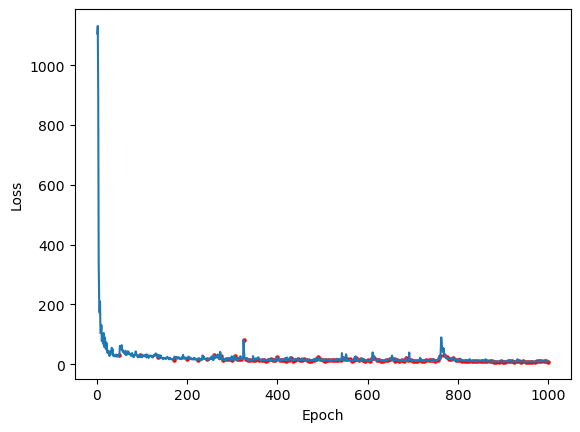

In [22]:
# plot the loss
plt.plot(list(dict_loss.keys()), list(dict_loss.values()))
plt.xlabel("Epoch")
plt.ylabel("Loss")
# plot the update points
plt.scatter(list(dict_iou.keys()), [dict_loss[i] for i in list(dict_iou.keys())], c="r", s=5)
plt.show()

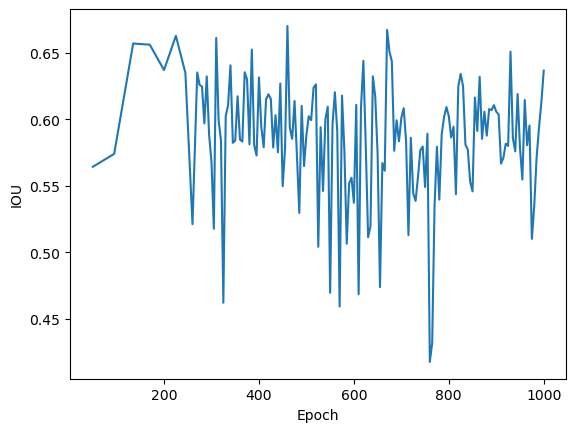

In [23]:
# plot the iou
plt.plot(list(dict_iou.keys()), list(dict_iou.values()))
plt.xlabel("Epoch")
plt.ylabel("IOU")
plt.show()